In [495]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from itertools import combinations
import numpy as np
from statsmodels.tsa.seasonal import seasonal_decompose
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split
import scipy.stats as stats
from statsmodels.graphics.tsaplots import plot_acf
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score
import seaborn as sns
import matplotlib.pyplot as plt
import lightgbm as lgb

In [187]:
df = pd.read_parquet('feature.parq')
df.head()

,mid_prc,b66accf4d4,01d830fc33,ac29aa28b0,86eecbe036,9c51f3cf1d,706dbe6d28,cb232e1c9f,301f8d1b44,134e1a6937,...,2d1cf32644,18af9014b6,9b980c18d7,d762c12f50,c7c3c1666c,73762306aa,1c6e322c2d,0d19cb3fb0,486cb65b0c,c49a5f9c65
timestamp,,,,,,,,,,,,,,,,,,,,,
2025-04-16 00:00:05,1588.010010,5.0,5.0,5.0,5.0,5.0,5.0,5.0,5.0,5.000000,...,5.000000,5.000000,5.000000,5.0,5.000000,5.000000,5.000000,5.0,5.000000,5.0000
2025-04-16 00:00:06,1587.824951,-5.0,-5.0,-5.0,-5.0,-5.0,-5.0,-5.0,-5.0,0.601331,...,0.023879,-1.795081,5.000000,5.0,-0.614067,-5.000000,5.000000,5.0,-0.774996,-5.0000
2025-04-16 00:00:07,1587.824951,-5.0,-5.0,-5.0,-5.0,-5.0,-5.0,-5.0,-5.0,0.322740,...,0.766593,5.000000,5.000000,5.0,0.142544,3.931395,5.000000,5.0,-0.024244,-3.6261
2025-04-16 00:00:08,1587.305054,-5.0,-5.0,-5.0,-5.0,-5.0,-5.0,-5.0,-5.0,-5.000000,...,-5.000000,-5.000000,-4.450434,-5.0,-5.000000,-5.000000,-4.419014,-5.0,-5.000000,-5.0000
2025-04-16 00:00:09,1587.285034,-5.0,-5.0,-5.0,-5.0,-5.0,-5.0,-5.0,-5.0,-5.000000,...,-5.000000,-5.000000,-4.941638,-5.0,-5.000000,-5.000000,-4.966719,-5.0,-5.000000,-5.0000


In [188]:
df.columns

Index(['mid_prc', 'b66accf4d4', '01d830fc33', 'ac29aa28b0', '86eecbe036',
       '9c51f3cf1d', '706dbe6d28', 'cb232e1c9f', '301f8d1b44', '134e1a6937',
       '5f3f783a1f', 'd182b35ca9', 'c910253362', '8572904679', '486b27acac',
       'e10ab80234', '5e7e5a691e', 'ec021e3c39', 'c12d090869', 'ac567aa14a',
       '5e95d4c57f', '84e6dad0a3', '72e0d3737a', '865224234b', '497584e7d1',
       'fe12c6cc6c', '7d08e345ba', 'e486088bae', 'e093f74611', '7a0f3d15e0',
       '7373db20a8', 'd50ec44f62', '98727525fc', '4a9f632715', 'f46c65222f',
       'ac8a9f9f8f', 'd4112c20e5', 'd5b6b02144', 'da2cdd99f0', 'f2541b5abc',
       'f98542952a', 'ffbe745f16', '3e21085969', 'a4e012f275', '5b49e63bed',
       'be3e28c4c3', 'd204751de5', 'fa27718d2f', '066b586798', '299afc361e',
       'f9729a88bb', '470d88c5b1', 'd2edb86598', '71cf837e9a', '203633358c',
       'd0cfd8e5d0', 'e2ab68e2c7', '81bb633696', '2ebb6e47c7', '1b6ac90abc',
       'dee93af023', '7e149245ee', 'df3261ae5e', 'a94fc5357b', '21a69fbc66',
  

In [189]:
df.shape

(604378, 87)

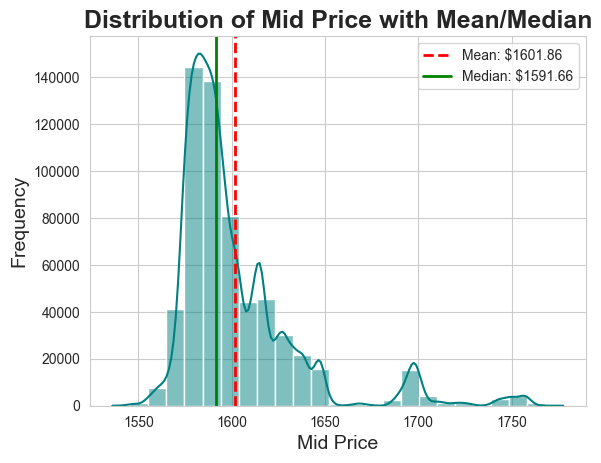

In [190]:
# Create the plot
ax = sns.histplot(data=df, x='mid_prc', bins=25, kde=True, color='teal')

# Add a vertical line for the mean and median to see skewness
mean_price = df['mid_prc'].mean()
median_price = df['mid_prc'].median()

ax.axvline(mean_price, color='red', linestyle='--', linewidth=2, label=f'Mean: ${mean_price:.2f}')
ax.axvline(median_price, color='green', linestyle='-', linewidth=2, label=f'Median: ${median_price:.2f}')

# --- Enhance the plot with titles and labels ---
ax.set_title('Distribution of Mid Price with Mean/Median', fontsize=18, weight='bold')
ax.set_xlabel('Mid Price', fontsize=14)
ax.set_ylabel('Frequency', fontsize=14)
ax.legend()

# --- Display the plot ---
plt.show()


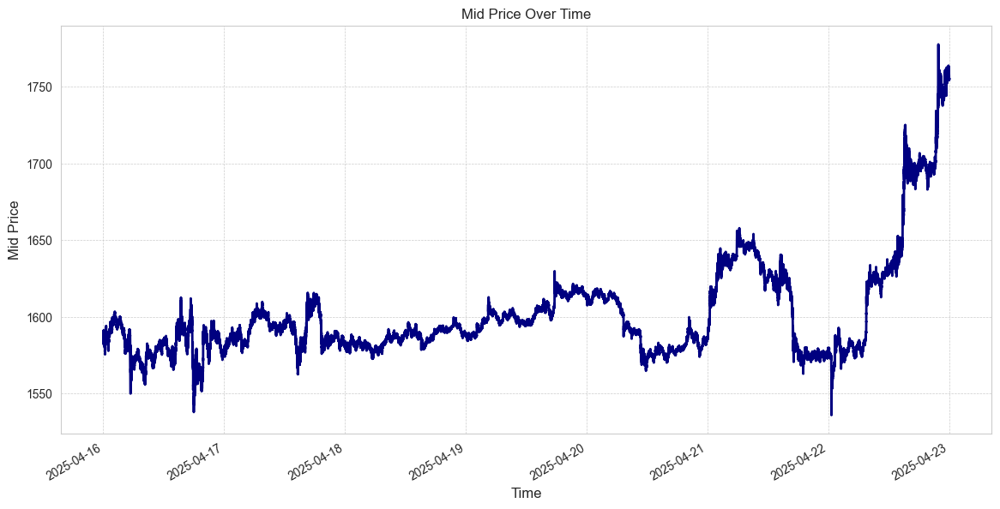

In [191]:
# --- Set a professional plot style ---
sns.set_style("whitegrid")

# --- Create the plot using the pandas .plot() method ---
ax = df['mid_prc'].plot(
    figsize=(14, 7),
    title='Mid Price Over Time',
    color='navy',
    linewidth=2
)

# --- Enhance the plot with clear labels ---
ax.set_xlabel('Time', fontsize=12)
ax.set_ylabel('Mid Price', fontsize=12)
ax.grid(True, which='both', linestyle='--', linewidth=0.5)

# --- Display the plot ---
plt.show()


In [192]:
df.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 604378 entries, 2025-04-16 00:00:05 to 2025-04-22 23:59:59
Data columns (total 87 columns):
 #   Column      Non-Null Count   Dtype  
---  ------      --------------   -----  
 0   mid_prc     604378 non-null  float32
 1   b66accf4d4  604378 non-null  float32
 2   01d830fc33  604378 non-null  float32
 3   ac29aa28b0  604378 non-null  float32
 4   86eecbe036  604378 non-null  float32
 5   9c51f3cf1d  604378 non-null  float32
 6   706dbe6d28  604378 non-null  float32
 7   cb232e1c9f  604378 non-null  float32
 8   301f8d1b44  604378 non-null  float32
 9   134e1a6937  604378 non-null  float32
 10  5f3f783a1f  604378 non-null  float32
 11  d182b35ca9  604378 non-null  float32
 12  c910253362  604378 non-null  float32
 13  8572904679  604378 non-null  float32
 14  486b27acac  604378 non-null  float32
 15  e10ab80234  604378 non-null  float32
 16  5e7e5a691e  604378 non-null  float32
 17  ec021e3c39  604378 non-null  float32
 18  c12d090869

In [193]:
df_describe = df.describe(include='float32')

with pd.option_context('display.max_columns', None):
    print(df_describe)

             mid_prc     b66accf4d4     01d830fc33     ac29aa28b0  \
count  604378.000000  604378.000000  604378.000000  604378.000000   
mean     1601.856689      -0.001573       0.000471       0.000961   
std        33.063606       1.002640       1.000666       0.999296   
min      1536.010010      -5.000000      -5.000000      -5.000000   
25%      1581.724976      -0.673479      -0.634930      -0.610623   
50%      1591.655029      -0.007083      -0.004322       0.000993   
75%      1612.604980       0.664406       0.633471       0.612619   
max      1777.680054       5.000000       5.000000       5.000000   

          86eecbe036     9c51f3cf1d     706dbe6d28     cb232e1c9f  \
count  604378.000000  604378.000000  604378.000000  604378.000000   
mean        0.000961      -0.003787      -0.004580      -0.002970   
std         0.999296       1.005991       1.007335       1.004184   
min        -5.000000      -5.000000      -5.000000      -5.000000   
25%        -0.610618      -0.6613

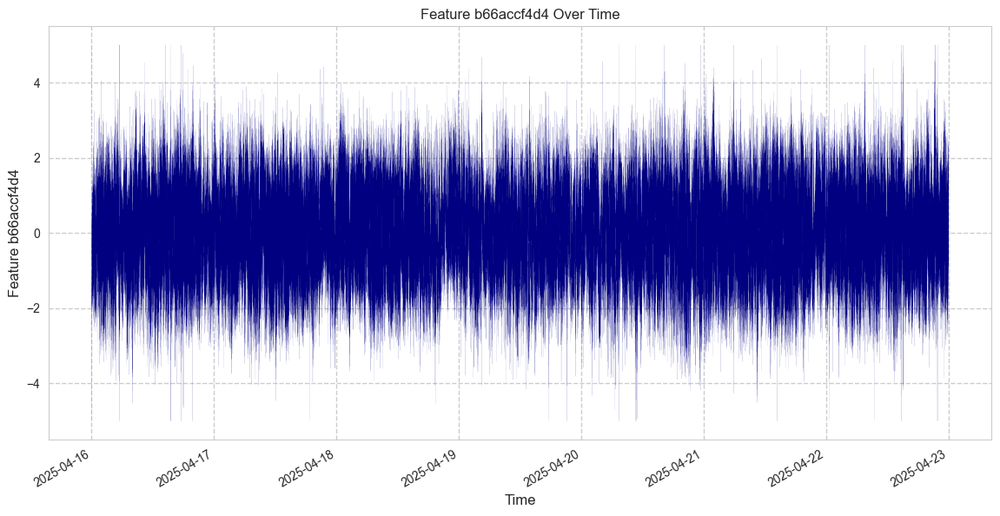

In [194]:
df['b66accf4d4'].plot(figsize=(14, 7), title='Feature b66accf4d4 Over Time', color='navy', linewidth=0.05)
plt.xlabel('Time', fontsize=12)
plt.ylabel('Feature b66accf4d4', fontsize=12)
plt.grid(True, which='both', linestyle='--', linewidth=1)
plt.show()

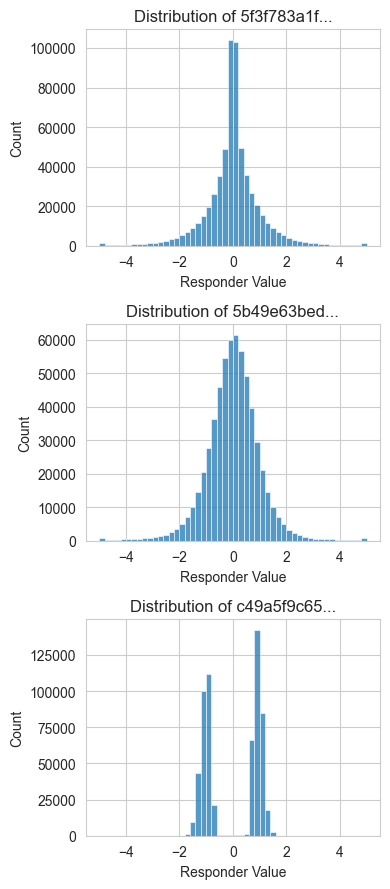

In [248]:
df_copy = df.copy()
responder_cols = df_copy.columns.drop('mid_prc')

# --- Distribution Plots for Sample Responders ---
# We'll use histograms, not count plots
sample_responders_to_plot = [responder_cols[9], responder_cols[43], responder_cols[85]]

plt.figure(figsize=(4, 9))
for i, col_name in enumerate(sample_responders_to_plot, 1):
    plt.subplot(3, 1, i)
    sns.histplot(df[col_name], bins=50)
    plt.title(f'Distribution of {col_name[:10]}...')
    plt.xlabel('Responder Value')

plt.tight_layout()
plt.show()

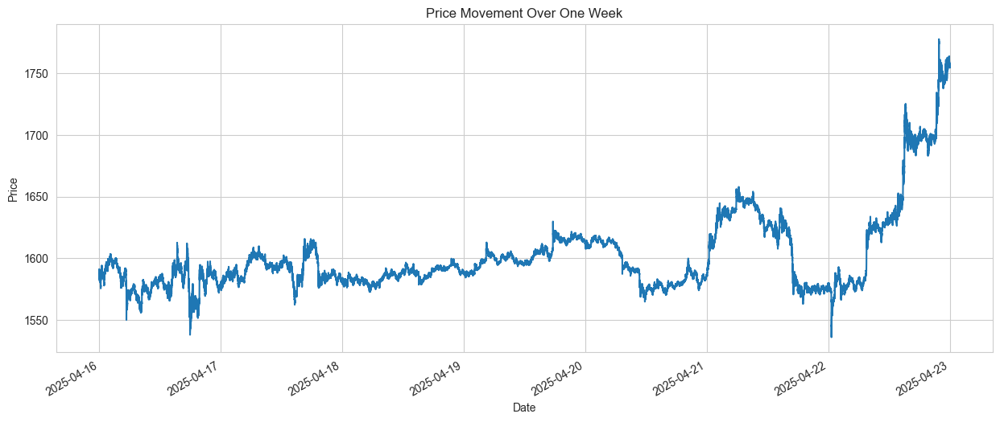

In [226]:
# Plot the price over the entire duration
df_copy['mid_prc'].plot(figsize=(15, 6), title='Price Movement Over One Week')
plt.ylabel('Price')
plt.xlabel('Date')
plt.show()

/var/folders/sr/p42wz5n11rzcm2dvgg2x75l00000gn/T/ipykernel_64591/3416073384.py:2: FutureWarning: 'T' is deprecated and will be removed in a future version, please use 'min' instead.
  df_resampled = df_copy['mid_prc'].resample('10T').mean()


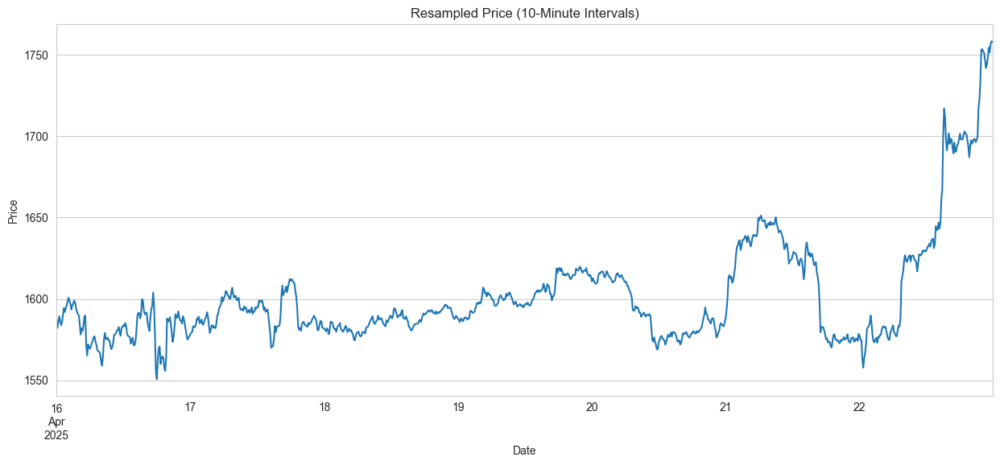

In [227]:
# Resample to 10-minute intervals, taking the mean price for each interval
df_resampled = df_copy['mid_prc'].resample('10T').mean()

# Plot the resampled data
df_resampled.plot(figsize=(15, 6), title='Resampled Price (10-Minute Intervals)')
plt.ylabel('Price')
plt.xlabel('Date')
plt.show()

/var/folders/sr/p42wz5n11rzcm2dvgg2x75l00000gn/T/ipykernel_64591/4233242731.py:3: FutureWarning: 'T' is deprecated and will be removed in a future version, please use 'min' instead.
  df_minute = df_copy['mid_prc'].resample('1T').mean().ffill() # Fill any gaps


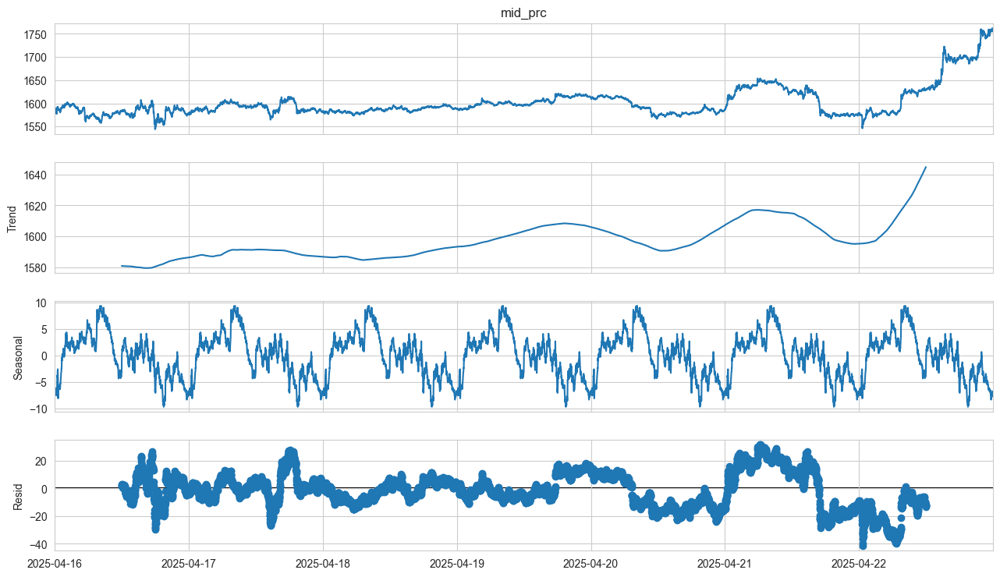

In [228]:
# Decomposition works best on a consistent frequency, so we'll use our resampled data.
# Daily seasonality on minute data means a period of 24 hours * 60 minutes = 1440
df_minute = df_copy['mid_prc'].resample('1T').mean().ffill() # Fill any gaps
result = seasonal_decompose(df_minute, model='additive', period=1440)

# Plot the decomposed components
fig = result.plot()
fig.set_size_inches(14, 8)
plt.show()

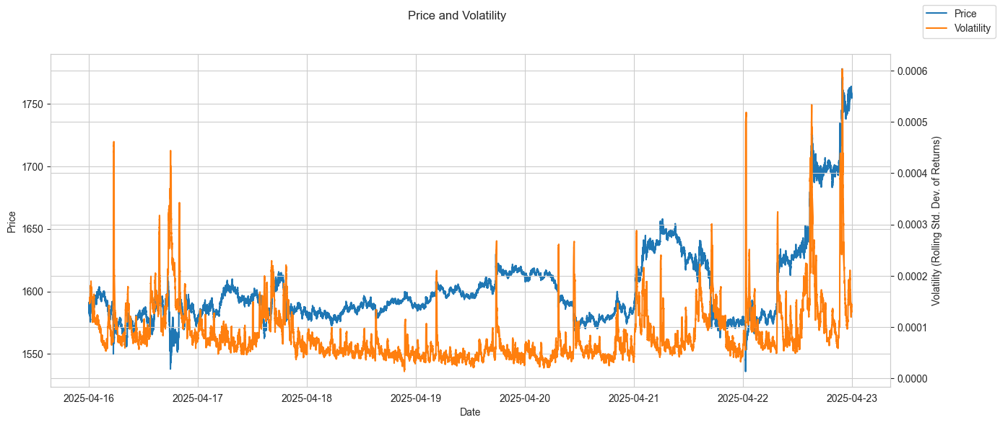

In [229]:
# Calculate the percentage change in price (returns)
df_copy['returns'] = df_copy['mid_prc'].pct_change()

# Calculate the rolling standard deviation of returns (a measure of volatility)
# We'll use a 10-minute window (10 * 60 seconds)
df_copy['volatility'] = df_copy['returns'].rolling(window=10*60).std()

# Plot price and its volatility on the same chart
fig, ax1 = plt.subplots(figsize=(15, 6))

# Plot price on the primary y-axis
ax1.plot(df_copy['mid_prc'], color='C0', label='Price')
ax1.set_ylabel('Price')
ax1.set_xlabel('Date')

# Create a secondary y-axis for volatility
ax2 = ax1.twinx()
ax2.plot(df_copy['volatility'], color='C1', label='Volatility')
ax2.set_ylabel('Volatility (Rolling Std. Dev. of Returns)')

fig.suptitle('Price and Volatility')
fig.legend()
plt.show()

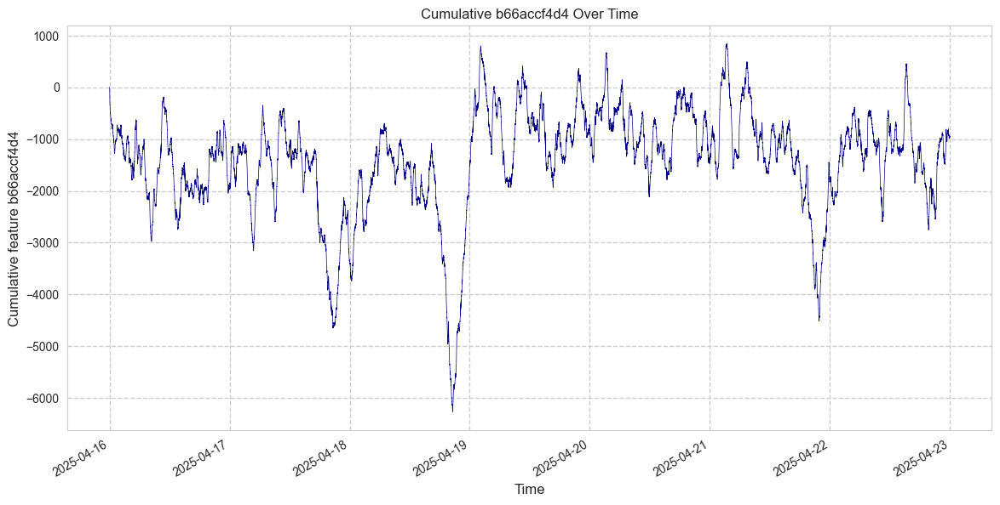

In [230]:
df['b66accf4d4'].cumsum().plot(figsize=(14, 7), title='Cumulative b66accf4d4 Over Time', color='navy', linewidth=0.5)
plt.xlabel('Time', fontsize=12)
plt.ylabel('Cumulative feature b66accf4d4', fontsize=12)
plt.grid(True, which='both', linestyle='--', linewidth=1)
plt.show()

In [231]:
cum_feature = df['b66accf4d4'].cumsum()
correlation = cum_feature.corr(df['mid_prc'])
print(f"Correlation between cumulative b66accf4d4 and mid_prc: {correlation:.4f}")

Correlation between cumulative b66accf4d4 and mid_prc: 0.2229


In [232]:
features_list = {'b66accf4d4', '01d830fc33','ac29aa28b0', '86eecbe036',
       '9c51f3cf1d', '706dbe6d28', 'cb232e1c9f', '301f8d1b44', '134e1a6937',
       '5f3f783a1f', 'd182b35ca9', 'c910253362', '8572904679', '486b27acac',
       'e10ab80234', '5e7e5a691e', 'ec021e3c39', 'c12d090869', 'ac567aa14a',
       '5e95d4c57f', '84e6dad0a3', '72e0d3737a', '865224234b', '497584e7d1',
       'fe12c6cc6c', '7d08e345ba', 'e486088bae', 'e093f74611', '7a0f3d15e0',
       '7373db20a8', 'd50ec44f62', '98727525fc', '4a9f632715', 'f46c65222f',
       'ac8a9f9f8f', 'd4112c20e5', 'd5b6b02144', 'da2cdd99f0', 'f2541b5abc',
       'f98542952a', 'ffbe745f16', '3e21085969', 'a4e012f275', '5b49e63bed',
       'be3e28c4c3', 'd204751de5', 'fa27718d2f', '066b586798', '299afc361e',
       'f9729a88bb', '470d88c5b1', 'd2edb86598', '71cf837e9a', '203633358c',
       'd0cfd8e5d0', 'e2ab68e2c7', '81bb633696', '2ebb6e47c7', '1b6ac90abc',
       'dee93af023', '7e149245ee', 'df3261ae5e', 'a94fc5357b', '21a69fbc66',
       'c5001fe3b3', '1aa3d78298', 'c2675078fe', 'e2624a64cd', '5d422876c4',
       'fd5d8e0768', '1a7b35154d', 'e379e765f6', '862b567dd6', '6d0ae28237',
       'a2dbde07a4', '5f4f6a981b', '2d1cf32644', '18af9014b6', '9b980c18d7',
       'd762c12f50', 'c7c3c1666c', '73762306aa', '1c6e322c2d', '0d19cb3fb0',
       '486cb65b0c', 'c49a5f9c65'}

In [233]:
correlations = {}

for feature in features_list:
    cum_feature = df[feature].cumsum()
    corr = cum_feature.corr(df['mid_prc'])
    correlations[feature] = corr

# Display all correlations
for feature, corr in correlations.items():
    print(f"Correlation between cumulative {feature} and mid_prc: {corr:.4f}")

Correlation between cumulative 9c51f3cf1d and mid_prc: -0.2809
Correlation between cumulative df3261ae5e and mid_prc: 0.1373
Correlation between cumulative 1aa3d78298 and mid_prc: 0.0581
Correlation between cumulative ac567aa14a and mid_prc: -0.3813
Correlation between cumulative da2cdd99f0 and mid_prc: -0.4470
Correlation between cumulative 301f8d1b44 and mid_prc: -0.0645
Correlation between cumulative a94fc5357b and mid_prc: -0.5384
Correlation between cumulative 18af9014b6 and mid_prc: -0.4759
Correlation between cumulative 706dbe6d28 and mid_prc: -0.2132
Correlation between cumulative 7a0f3d15e0 and mid_prc: 0.3506
Correlation between cumulative c2675078fe and mid_prc: 0.3639
Correlation between cumulative e2624a64cd and mid_prc: -0.2683
Correlation between cumulative ac8a9f9f8f and mid_prc: -0.1779
Correlation between cumulative c7c3c1666c and mid_prc: -0.0832
Correlation between cumulative 5d422876c4 and mid_prc: 0.3700
Correlation between cumulative 2d1cf32644 and mid_prc: 0.154

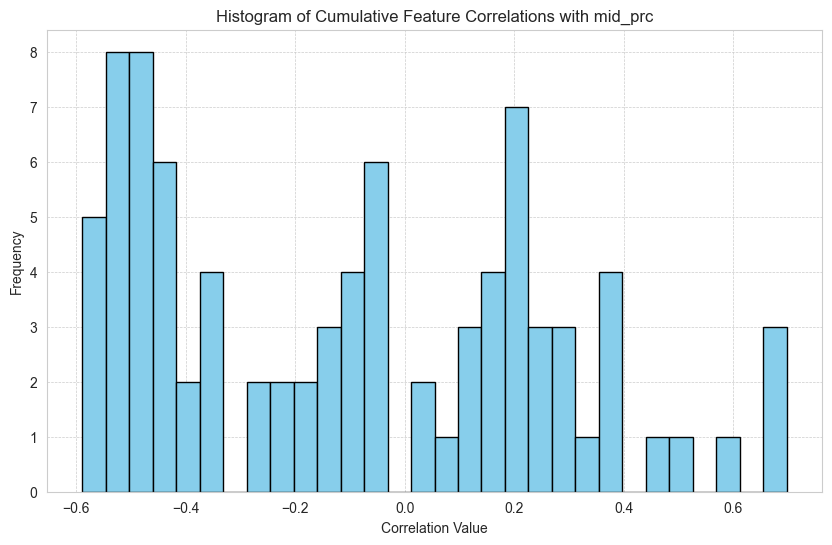

In [234]:
# Plot histogram of correlation values
plt.figure(figsize=(10, 6))
plt.hist(list(correlations.values()), bins=30, color='skyblue', edgecolor='black')
plt.title('Histogram of Cumulative Feature Correlations with mid_prc')
plt.xlabel('Correlation Value')
plt.ylabel('Frequency')
plt.grid(True, linestyle='--', linewidth=0.5)

In [235]:
threshold = 0.65
high_corr_features = [feature for feature, corr in correlations.items() if abs(corr) > threshold]
print(f"Features with correlation > {threshold}:")
for feature in high_corr_features:
    print(feature)


Features with correlation > 0.65:
486b27acac
c910253362
8572904679


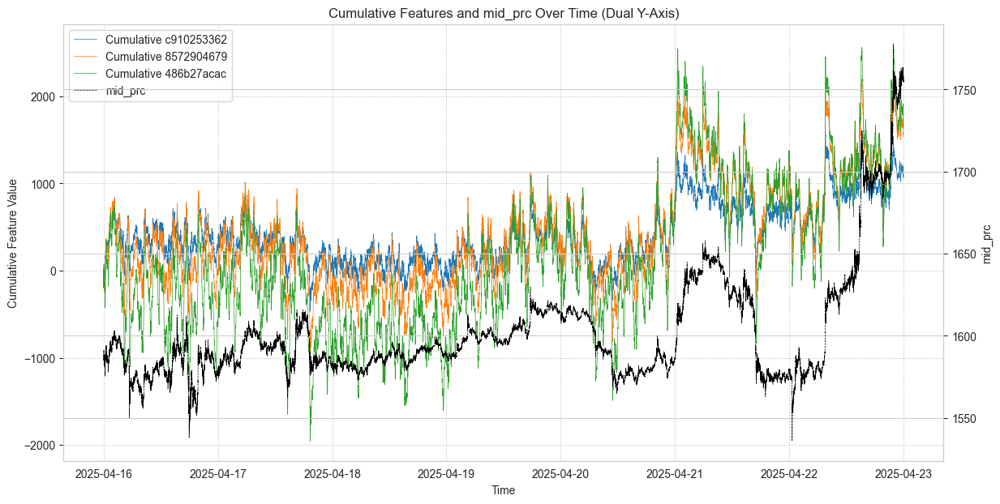

In [236]:
flist = ['c910253362', '8572904679', '486b27acac']  # Example, replace with your desired features

fig, ax1 = plt.subplots(figsize=(14, 7))

# Plot cumulative features on left y-axis
for feature in flist:
    ax1.plot(df[feature].cumsum(), label=f'Cumulative {feature}', linewidth=0.5)
ax1.set_xlabel('Time')
ax1.set_ylabel('Cumulative Feature Value')
ax1.grid(True, which='both', linestyle='--', linewidth=0.5)

# Create a second y-axis for mid_prc
ax2 = ax1.twinx()
ax2.plot(df['mid_prc'], label='mid_prc', color='black', linewidth=0.5, linestyle='--')
ax2.set_ylabel('mid_prc')

# Legends for both axes
lines_1, labels_1 = ax1.get_legend_handles_labels()
lines_2, labels_2 = ax2.get_legend_handles_labels()
ax1.legend(lines_1 + lines_2, labels_1 + labels_2, loc='upper left')

plt.title('Cumulative Features and mid_prc Over Time (Dual Y-Axis)')
plt.show()

In [237]:
# Define a function to compute risk-adjusted return for given thresholds
def evaluate_thresholds(df_sim, horizon, up_th, down_th):
    df_sim['future_change'] = df_sim['mid_prc'].shift(-horizon) - df_sim['mid_prc']
    df_sim['signal'] = df_sim['future_change'].apply(
        lambda x: 1 if x > up_th else (-1 if x < down_th else 0)
    )
    # Simulate returns: assume you buy/sell at signal, hold for 'horizon' seconds
    df_sim['strategy_return'] = df_sim['signal'] * df_sim['future_change']
    mean_ret = df_sim['strategy_return'].mean()
    std_ret = df_sim['strategy_return'].std()
    sharpe = mean_ret / std_ret if std_ret != 0 else 0
    signal_hits = (df_sim['signal'] != 0).sum()
    return sharpe, mean_ret, std_ret, signal_hits

# Grid search for best thresholds (horizon fixed at 5)
best_sharpe = -np.inf
best_up, best_down = None, None
best_hits = None
# horizon = 5
df_sim = df.copy()

for horizon in np.arange(49000, 50001, 10000):  # Test horizons from 150 to 650 seconds
    for up_th in np.arange(0.005, 0.05, 0.005):
        for down_th in np.arange(-0.05, -0.005, 0.005):
            sharpe, mean_ret, std_ret, signal_hits = evaluate_thresholds(df_sim, horizon=horizon, up_th=up_th, down_th=down_th)
            if sharpe > best_sharpe:
                best_sharpe = sharpe
                best_up, best_down = up_th, down_th
                best_hits = signal_hits

print(f"Best thresholds: up={best_up}, down={best_down}, horizon={horizon}, Sharpe={best_sharpe:.2f}, Signal hits={best_hits}")

Best thresholds: up=0.005, down=-0.010000000000000023, horizon=49000, Sharpe=0.97, Signal hits=555263


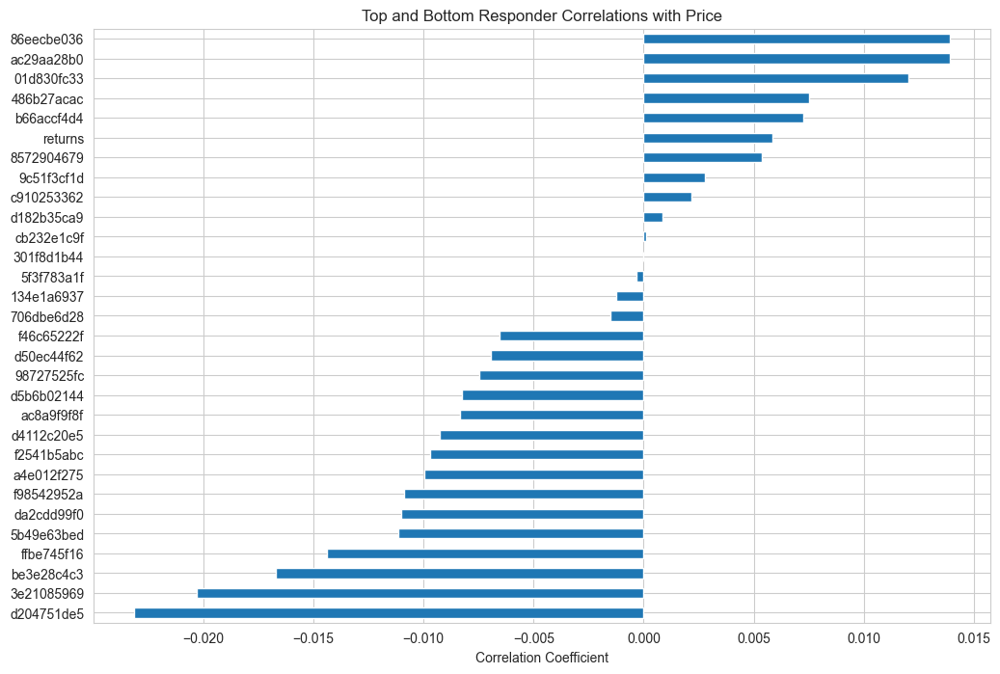

In [240]:
# Calculate the correlation of every column with 'mid_prc'
correlations = df_copy.corr()['mid_prc'].drop(['mid_prc', 'volatility']) # Drop correlation with itself

# Sort the correlations to see the strongest positive and negative ones
sorted_correlations = correlations.sort_values()

# Plot the top 15 positive and top 15 negative correlations
plt.figure(figsize=(12, 8))
# Slicing the sorted Series to get the 15 smallest and 15 largest values
top_and_bottom = pd.concat([sorted_correlations.head(15), sorted_correlations.tail(15)])
top_and_bottom.plot(kind='barh')
plt.title('Top and Bottom Responder Correlations with Price')
plt.xlabel('Correlation Coefficient')
plt.show()

In [307]:
split_index = int(len(df_copy) * 0.7)
df_copy2 = df_copy.iloc[:split_index].copy()

print(f"\nOriginal DataFrame length: {len(df_copy)}")
print(f"New DataFrame (df_copy2) length: {len(df_copy2)}")
print(f"Data in df_copy2 ends at: {df_copy2.index[-1]}")

df_copy2['mid_prc'] = df_copy2['mid_prc'].astype('float64')

df_copy2['price_returns'] = df_copy2['mid_prc'].pct_change()
# Calculate the correlation of every column with 'price_returns'
df_copy2['price_returns_5'] = df_copy2['price_returns'].shift(-5) #shift by 5 seconds into the future
df_copy2['price_returns_4'] = df_copy2['price_returns'].shift(-4) #shift by 4 seconds into the future
df_copy2['price_returns_3'] = df_copy2['price_returns'].shift(-3) #shift by 3 seconds into the future
df_copy2['price_returns_2'] = df_copy2['price_returns'].shift(-2) #shift by 2 seconds into the future
df_copy2['price_returns_1'] = df_copy2['price_returns'].shift(-1) #shift by 1 seconds into the future

#drop correlation with itself
returns_list = ['price_returns', 'mid_prc', 'price_returns_5', 'price_returns_4', 'price_returns_3', 
                'price_returns_2', 'price_returns_1']

# Calculate the Spearman correlation matrix once for efficiency
spearman_corr_matrix = df_copy2.corr(method='spearman')

# Extract the correlation series for each return horizon from the pre-calculated matrix
correlations_ret = spearman_corr_matrix['price_returns'].drop(returns_list, errors='ignore')
correlations_ret5 = spearman_corr_matrix['price_returns_5'].drop(returns_list, errors='ignore')
correlations_ret4 = spearman_corr_matrix['price_returns_4'].drop(returns_list, errors='ignore')
correlations_ret3 = spearman_corr_matrix['price_returns_3'].drop(returns_list, errors='ignore')
correlations_ret2 = spearman_corr_matrix['price_returns_2'].drop(returns_list, errors='ignore')
correlations_ret1 = spearman_corr_matrix['price_returns_1'].drop(returns_list, errors='ignore')

zero_returns_count = (df_copy2['price_returns_1'] == 0).sum()
total_valid_returns = df_copy2['price_returns_1'].notna().sum()
zero_percentage = (zero_returns_count / total_valid_returns) * 100 if total_valid_returns > 0 else 0

print(f"\nNumber of 0s in 'price_returns_1': {zero_returns_count}")
print(f"Percentage of 0s in 'price_returns_1': {zero_percentage:.2f}%\n")

print(df_copy2[returns_list].head())


Original DataFrame length: 604378
New DataFrame (df_copy2) length: 423064
Data in df_copy2 ends at: 2025-04-20 21:37:11

Number of 0s in 'price_returns_1': 269503
Percentage of 0s in 'price_returns_1': 63.70%

                     price_returns      mid_prc  price_returns_5  \
timestamp                                                          
2025-04-16 00:00:05            NaN  1588.010010         0.000069   
2025-04-16 00:00:06      -0.000117  1587.824951         0.000025   
2025-04-16 00:00:07       0.000000  1587.824951        -0.000284   
2025-04-16 00:00:08      -0.000327  1587.305054        -0.000044   
2025-04-16 00:00:09      -0.000013  1587.285034        -0.000113   

                     price_returns_4  price_returns_3  price_returns_2  \
timestamp                                                                
2025-04-16 00:00:05        -0.000013        -0.000327         0.000000   
2025-04-16 00:00:06         0.000069        -0.000013        -0.000327   
2025-04-16 00:00

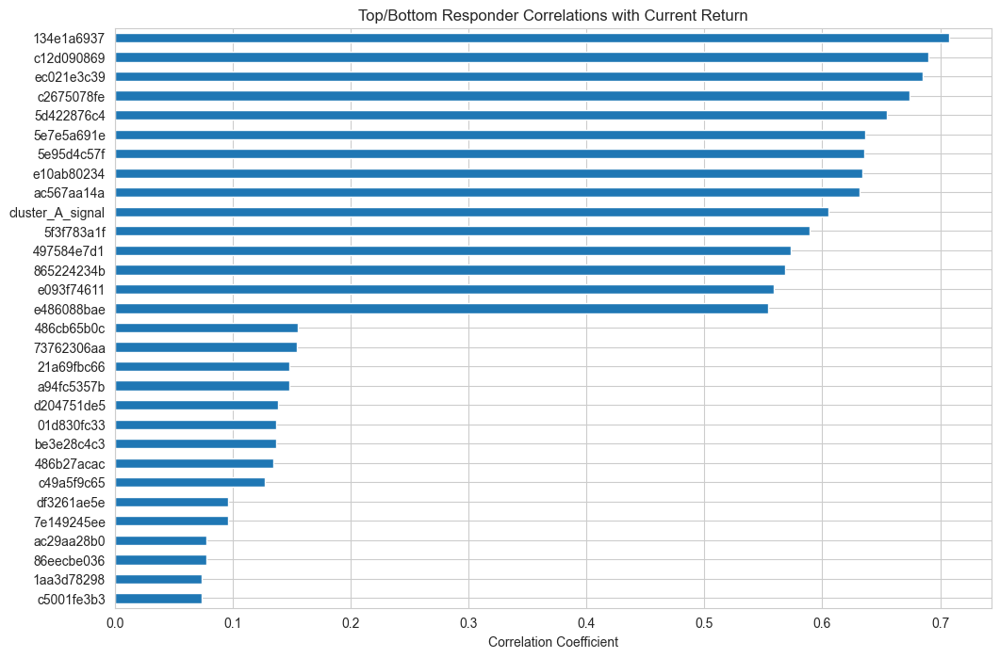

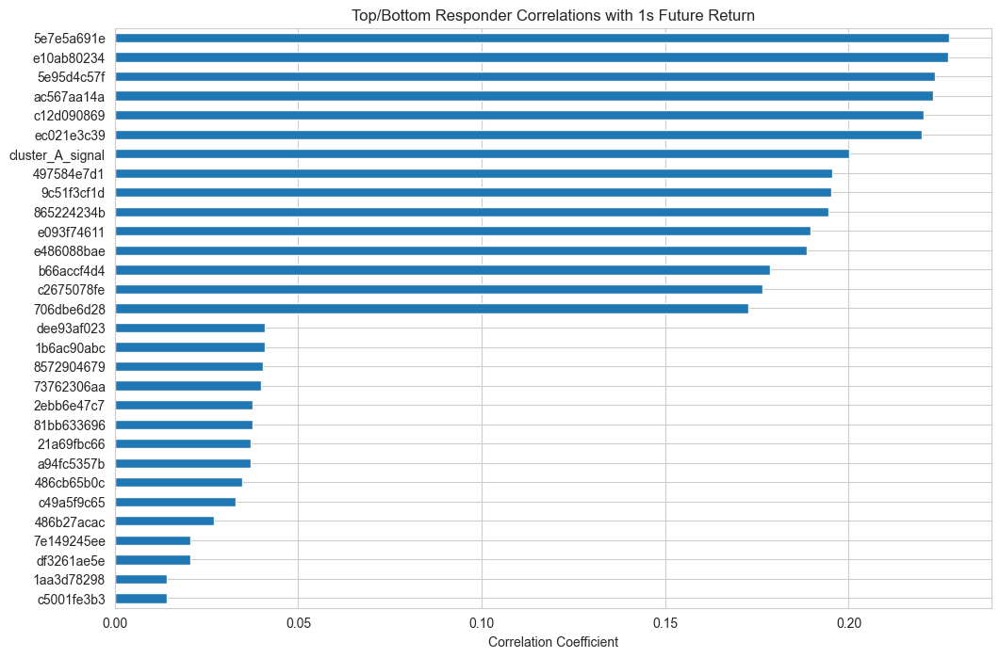

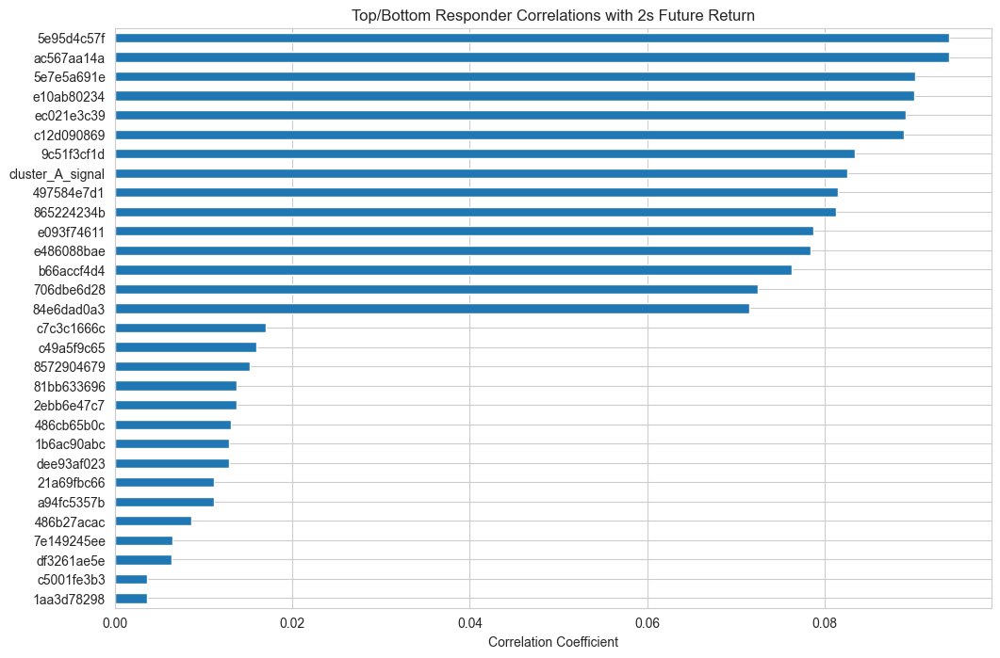

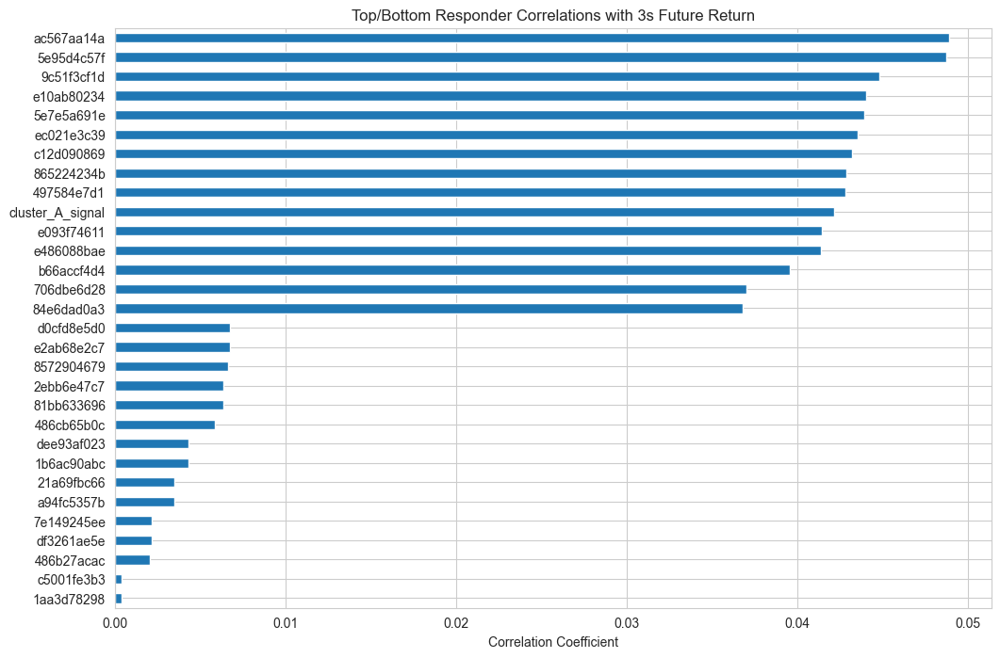

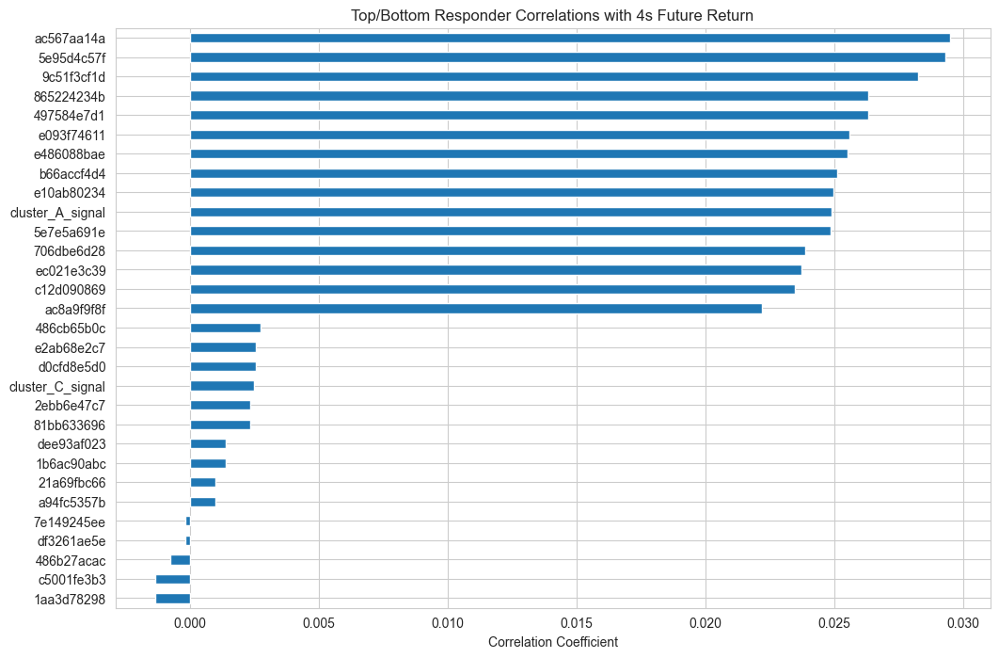

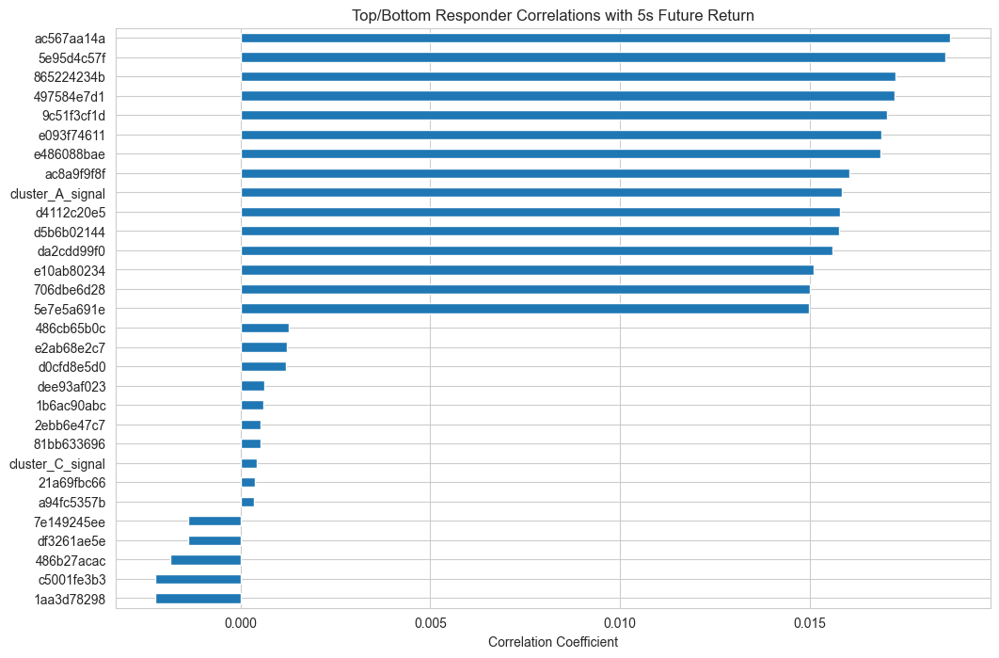

In [282]:
# List of correlation Series and their corresponding titles
correlations_list = [
    correlations_ret,
    correlations_ret1,
    correlations_ret2,
    correlations_ret3,
    correlations_ret4,
    correlations_ret5
]
titles = [
    'Top/Bottom Responder Correlations with Current Return',
    'Top/Bottom Responder Correlations with 1s Future Return',
    'Top/Bottom Responder Correlations with 2s Future Return',
    'Top/Bottom Responder Correlations with 3s Future Return',
    'Top/Bottom Responder Correlations with 4s Future Return',
    'Top/Bottom Responder Correlations with 5s Future Return'
]

# Create a dictionary to store the sorted correlation tables
all_sorted_correlations = {}

# Loop through and plot each one
for i, corr_series in enumerate(correlations_list):
    # Drop NaN values that result from shifting
    valid_correlations = corr_series.dropna()
    
    # Sort the correlations
    sorted_correlations = valid_correlations.sort_values()

    all_sorted_correlations[f'ret_{i}s'] = sorted_correlations

    
    # Create the plot
    plt.figure(figsize=(12, 8))
    
    # Get the top 15 and bottom 15 correlations
    top_and_bottom = pd.concat([sorted_correlations.head(15), sorted_correlations.tail(15)])
    top_and_bottom.plot(kind='barh')
    
    # Set plot details
    plt.title(titles[i])
    plt.xlabel('Correlation Coefficient')
    plt.show()

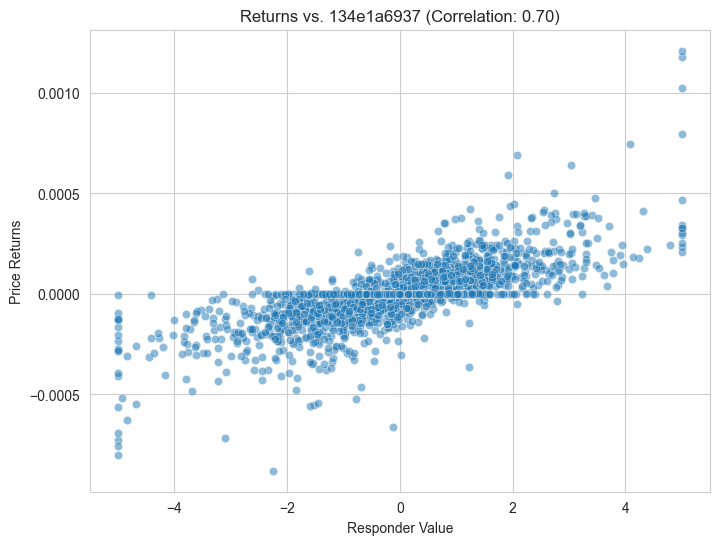

In [212]:
# Replace 'responder_name' with the actual column name of your best responder
best_responder = '134e1a6937' # The column name with the 0.7 correlation

plt.figure(figsize=(8, 6))
# Use a sample for performance and clarity
sns.scatterplot(data=df_copy.sample(5000), x=best_responder, y='price_returns', alpha=0.5)
plt.title(f'Returns vs. {best_responder[:10]} (Correlation: {0.7:.2f})')
plt.xlabel('Responder Value')
plt.ylabel('Price Returns')
plt.grid(True)
plt.show()

In [213]:
# Split the data roughly in half
first_half = df_copy.loc[:'2025-04-19']
second_half = df_copy.loc['2025-04-20':]

corr_first_half = first_half[best_responder].corr(first_half['price_returns'])
corr_second_half = second_half[best_responder].corr(second_half['price_returns'])

print(f"Correlation in first half: {corr_first_half:.4f}")
print(f"Correlation in second half: {corr_second_half:.4f}")

Correlation in first half: 0.7264
Correlation in second half: 0.7022


In [214]:
# --- Data Preparation ---
feature_name = '134e1a6937'
df_model = df_copy[[feature_name, 'price_returns']].dropna().copy()

# --- 1. Split the Data ---
# For time-series, we split chronologically, not randomly.
split_point = int(len(df_model) * 0.7)
train_df = df_model.iloc[:split_point].copy()
test_df = df_model.iloc[split_point:].copy()

print(f"Training data from {train_df.index.min()} to {train_df.index.max()}")
print(f"Testing data from {test_df.index.min()} to {test_df.index.max()}\n")

Training data from 2025-04-16 00:00:06 to 2025-04-20 21:37:11
Testing data from 2025-04-20 21:37:12 to 2025-04-22 23:59:59



In [215]:
# --- Preparation ---
# Make sure to replace these with your actual values
feature_name = '134e1a6937' 
TRANSACTION_COST_PCT = 0.0002 # 0.05% per transaction

# ==============================================================================
# STEP 1: FIND OPTIMAL THRESHOLD ON TRAINING DATA
# ==============================================================================

# Define the range of thresholds to test
candidate_thresholds = np.arange(0.5, 4.0, 0.1) 
train_results = []

# Loop through each candidate threshold
for threshold in candidate_thresholds:
    # Create market states for the current threshold
    conditions = [
        train_df[feature_name] > threshold,
        train_df[feature_name] < -threshold
    ]
    choices = ['bullish', 'bearish']
    train_df['market_state'] = np.select(conditions, choices, default='choppy')
    
    # Isolate returns for bullish and bearish signals
    bull_returns = train_df[train_df['market_state'] == 'bullish']['price_returns']
    bear_returns = train_df[train_df['market_state'] == 'bearish']['price_returns']
    
    # Ensure there are enough signals to be statistically valid
    if len(bull_returns) < 50 or len(bear_returns) < 50:
        continue
        
    # Calculate the performance score (simplified Sharpe Ratio)
    bull_sharpe = bull_returns.mean() / bull_returns.std()
    bear_sharpe = abs(bear_returns.mean() / bear_returns.std())
    score = bull_sharpe + bear_sharpe
    
    train_results.append({'threshold': threshold, 'train_score': score})

# Find the best threshold from the training phase
if not train_results:
    raise ValueError("Optimization failed. No thresholds generated enough signals in the training set.")

train_results_df = pd.DataFrame(train_results)
best_threshold_row = train_results_df.loc[train_results_df['train_score'].idxmax()]
best_threshold = best_threshold_row['threshold']

print("--- Step 1: Optimization Complete ---")
print(f"Optimal Threshold Found on Training Data: {best_threshold:.2f}")
print(f"Best In-Sample (Training) Score: {best_threshold_row['train_score']:.4f}\n")


# ==============================================================================
# STEP 2: EVALUATE THE BEST THRESHOLD ON THE TEST DATA
# ==============================================================================

# Apply the single best threshold to the test set
test_conditions = [
    test_df[feature_name] > 3.7,
    test_df[feature_name] < -3.7
]
test_choices = ['bullish', 'bearish']
test_df['market_state'] = np.select(test_conditions, test_choices, default='choppy')

# Calculate net returns on the test set, including transaction costs
test_df['signal'] = test_df['market_state'].map({'bullish': 1, 'choppy': 0, 'bearish': -1})
test_df['strategy_returns'] = test_df['signal'].shift(1) * test_df['price_returns']
test_df['trades'] = test_df['signal'].diff().abs()
test_df['costs'] = test_df['trades'] * TRANSACTION_COST_PCT
test_df['net_returns'] = test_df['strategy_returns'] - test_df['costs']
test_df.dropna(inplace=True)

# --- Calculate Final Performance Metrics on NET Returns ---
# 1. Total Profit (Cumulative Return)
cumulative_net_return = (1 + test_df['net_returns']).cumprod()
total_net_profit_pct = (cumulative_net_return.iloc[-1] - 1) * 100

# 2. Maximum Drawdown
high_water_mark = cumulative_net_return.cummax()
drawdown = (cumulative_net_return - high_water_mark) / high_water_mark
max_drawdown_pct = drawdown.min() * 100

# 3. Annualized Sharpe Ratio
SECONDS_IN_A_YEAR = 365 * 24 * 60 * 60
annualization_factor = np.sqrt(SECONDS_IN_A_YEAR)
mean_net_return = test_df['net_returns'].mean()
std_dev_net = test_df['net_returns'].std()
sharpe_ratio = (mean_net_return / std_dev_net) * annualization_factor if std_dev_net > 0 else 0

# --- Print Final Results ---
print("--- Step 2: Final Backtest Evaluation ---")
print("Performance metrics calculated on unseen test data:\n")
print(f"Total Net Profit/Loss: {total_net_profit_pct:.2f}%")
print(f"Maximum Drawdown: {max_drawdown_pct:.2f}%")
print(f"Annualized Sharpe Ratio: {sharpe_ratio:.2f}")

--- Step 1: Optimization Complete ---
Optimal Threshold Found on Training Data: 3.40
Best In-Sample (Training) Score: 2.2458

--- Step 2: Final Backtest Evaluation ---
Performance metrics calculated on unseen test data:

Total Net Profit/Loss: -45.11%
Maximum Drawdown: -45.39%
Annualized Sharpe Ratio: -327.62


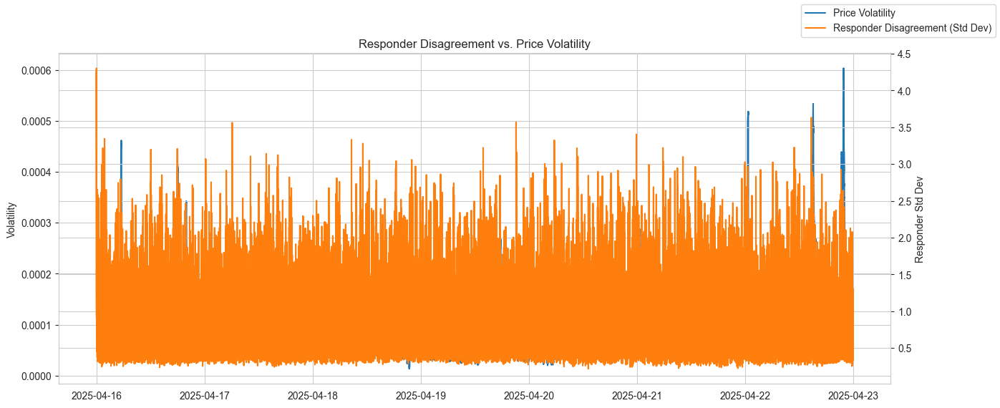

In [216]:
# Get the list of responder columns
responder_cols = df_copy.columns.drop(['mid_prc', 'returns', 'volatility'], errors='ignore')

# Create aggregate features
df_eda = df_copy.copy()
df_eda['responder_mean'] = df_eda[responder_cols].mean(axis=1)
df_eda['responder_std'] = df_eda[responder_cols].std(axis=1)

# --- Plot responder disagreement vs. price volatility ---
# Ensure you have the 'volatility' column from our previous analysis
if 'volatility' not in df_eda.columns:
    df_eda['returns'] = df_eda['mid_prc'].pct_change()
    df_eda['volatility'] = df_eda['returns'].rolling(window=10*60).std()

# Plot on a dual-axis chart to compare
fig, ax1 = plt.subplots(figsize=(15, 6))
ax1.set_title('Responder Disagreement vs. Price Volatility')
ax1.plot(df_eda.index, df_eda['volatility'], color='C0', label='Price Volatility')
ax1.set_ylabel('Volatility')
ax2 = ax1.twinx()
ax2.plot(df_eda.index, df_eda['responder_std'], color='C1', label='Responder Disagreement (Std Dev)')
ax2.set_ylabel('Responder Std Dev')
fig.legend()
plt.show()

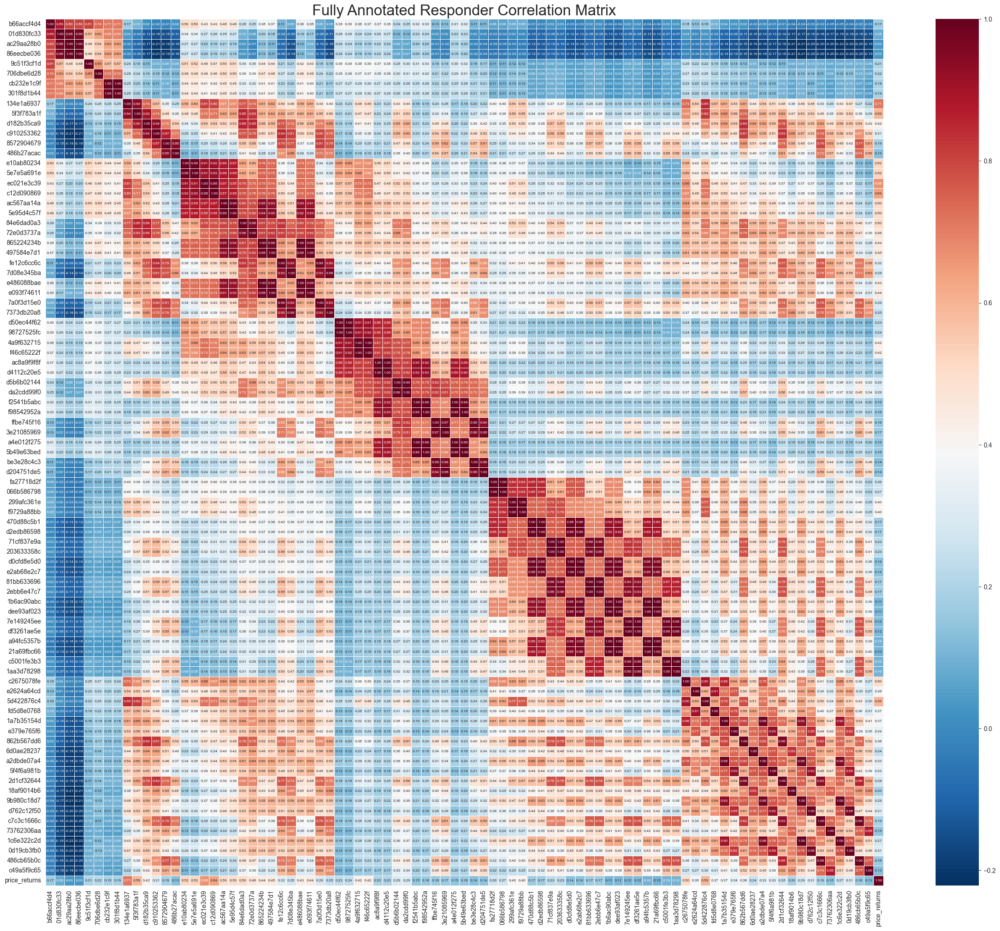

In [217]:
# Calculate the correlation matrix between all responders
responder_corr = df_eda[responder_cols].corr()

fig, ax = plt.subplots(figsize=(30, 25))

sns.heatmap(
    responder_corr,
    annot=True,                 # This is the key change: display the numbers
    fmt=".2f",                  # Format to 2 decimal places
    cmap='RdBu_r',                # Use a diverging colormap for positive/negative
    annot_kws={"size": 6},      # Use a very small font size for the numbers
    linewidths=.5,
    ax=ax
)

ax.set_title('Fully Annotated Responder Correlation Matrix', fontsize=24)
plt.show()

In [254]:
# Example: Let's say you identified two clusters from your heatmap
# (Replace with the actual column names you identify)

cluster_A_responders = ['e10ab80234', '5e7e5a691e', 'ec021e3c39', 'c12d090869', 'ac567aa14a', '5e95d4c57f',
                        '84e6dad0a3', '72e0d3737a', '865224234b', '497584e7d1', 'fe12c6cc6c', '7d08e345ba',
                        'e486088bae', 'e093f74611', '7a0f3d15e0', '7373db20a8'] # A positively correlated group
cluster_B_responders = ['d50ec44f62', '98727525fc', '4a9f632715', 'f46c65222f', 'ac8a9f9f8f', 'd4112c20e5',
                        'd5b6b02144', 'da2cdd99f0', 'f2541b5abc', 'f98542952a', 'ffbe745f16', '3e21085969',
                        'a4e012f275', '5b49e63bed', 'be3e28c4c3', 'd204751de5'] # Another correlated group
cluster_C_responders = ['fa27718d2f', '066b586798', '299afc361e', 'f9729a88bb', '470d88c5b1', 'd2edb86598',
                        '71cf837e9a', '203633358c', 'd0cfd8e5d0', 'e2ab68e2c7', '81bb633696', '2ebb6e47c7',
                        '1b6ac90abc', 'dee93af023', '7e149245ee', 'df3261ae5e', 'a94fc5357b', '21a69fbc66',
                        'c5001fe3b3', '1aa3d78298']

# Create new features by averaging the values in each cluster
df_copy['cluster_A_signal'] = df_copy[cluster_A_responders].mean(axis=1)
df_copy['cluster_B_signal'] = df_copy[cluster_B_responders].mean(axis=1)
df_copy['cluster_C_signal'] = df_copy[cluster_C_responders].mean(axis=1)

print("Created new composite features:")
print(df_copy[['cluster_A_signal', 'cluster_B_signal', 'cluster_C_signal']].head())

Created new composite features:
                     cluster_A_signal  cluster_B_signal  cluster_C_signal
timestamp                                                                
2025-04-16 00:00:05          5.000000          5.000000         -5.000000
2025-04-16 00:00:06          0.638066         -1.098204         -1.919456
2025-04-16 00:00:07          0.946871          0.857852         -1.753716
2025-04-16 00:00:08         -5.000000         -0.908650         -2.025688
2025-04-16 00:00:09         -4.984200         -2.074759         -1.841629


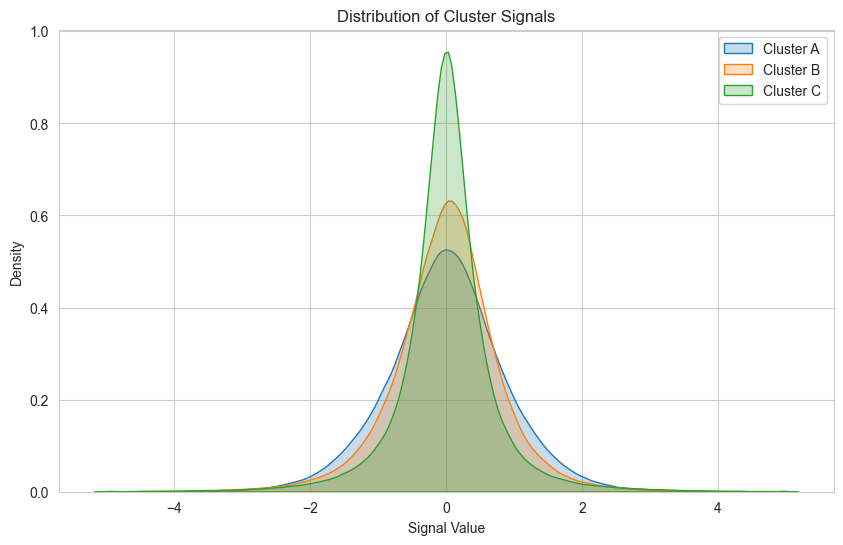

In [258]:
plt.figure(figsize=(10, 6))
sns.kdeplot(df_copy['cluster_A_signal'], label='Cluster A', fill=True)
sns.kdeplot(df_copy['cluster_B_signal'], label='Cluster B', fill=True)
sns.kdeplot(df_copy['cluster_C_signal'], label='Cluster C', fill=True)
plt.title('Distribution of Cluster Signals')
plt.xlabel('Signal Value')
plt.legend()
plt.grid(True)
plt.show()

In [219]:
# Ensure you have the 'price_returns' column
if 'price_returns' not in df_copy.columns:
    df_copy['price_returns'] = df_copy['mid_prc'].pct_change()

# Check the correlation of the new cluster signals with returns
corr_A = df_copy['cluster_A_signal'].corr(df_copy['price_returns'])
corr_B = df_copy['cluster_B_signal'].corr(df_copy['price_returns'])
corr_C = df_copy['cluster_C_signal'].corr(df_copy['price_returns'])

print(f"\nCorrelation of Cluster A Signal with Price Returns: {corr_A:.4f}")
print(f"Correlation of Cluster B Signal with Price Returns: {corr_B:.4f}")
print(f"Correlation of Cluster C Signal with Price Returns: {corr_C:.4f}")


Correlation of Cluster A Signal with Price Returns: 0.5267
Correlation of Cluster B Signal with Price Returns: 0.2584
Correlation of Cluster C Signal with Price Returns: 0.2040


In [220]:


# --- 1. Prepare Your Final Features ---
# (You would have already created these columns on df_copy)
# df_copy['cluster_A_signal'] = ...
# df_copy['cluster_B_signal'] = ...
# df_copy['cluster_C_signal'] = ...

# Define your predictive features (X) and the target (y)
features = ['cluster_A_signal', 'cluster_B_signal', 'cluster_C_signal']
target = 'price_returns'

# Create the final modeling DataFrame and remove any missing values
df_model = df_copy[features + [target]].dropna()

X = df_model[features]
y = df_model[target]

# --- 2. Split the Data Chronologically ---
# We use shuffle=False for time-series data
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, shuffle=False)

# --- 3. Train the Linear Regression Model ---
model = LinearRegression()
model.fit(X_train, y_train)

# --- 4. Evaluate the Model on the Test Set ---
r_squared = model.score(X_test, y_test)

# --- 5. Print the Final Results ---
print("--- Final Multi-Feature Model Evaluation ---")
print(f"Features Used: {features}")
print(f"Out-of-Sample R-squared: {r_squared:.4f}\n")

# See how the model weights each feature
feature_weights = pd.Series(model.coef_, index=features)
print("--- Model Feature Weights ---")
print(feature_weights)

--- Final Multi-Feature Model Evaluation ---
Features Used: ['cluster_A_signal', 'cluster_B_signal', 'cluster_C_signal']
Out-of-Sample R-squared: 0.2652

--- Model Feature Weights ---
cluster_A_signal    0.000064
cluster_B_signal   -0.000014
cluster_C_signal   -0.000004
dtype: float32


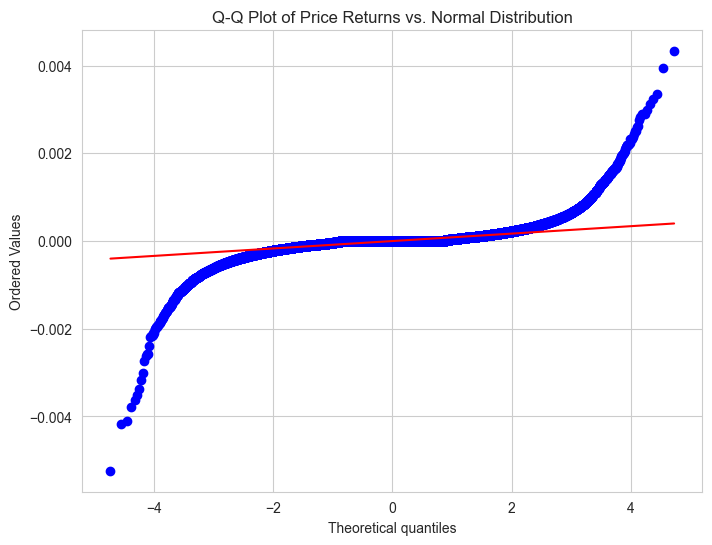

Kurtosis of price returns: 87.51


In [221]:
# --- Q-Q Plot for Price Returns ---
returns_sample = df_copy['price_returns'].dropna()

plt.figure(figsize=(8, 6))
stats.probplot(returns_sample, dist="norm", plot=plt)
plt.title('Q-Q Plot of Price Returns vs. Normal Distribution')
plt.grid(True)
plt.show()

# Calculate Kurtosis (a measure of "tailedness")
kurt = returns_sample.kurtosis()
print(f"Kurtosis of price returns: {kurt:.2f}")

<Figure size 1200x500 with 0 Axes>

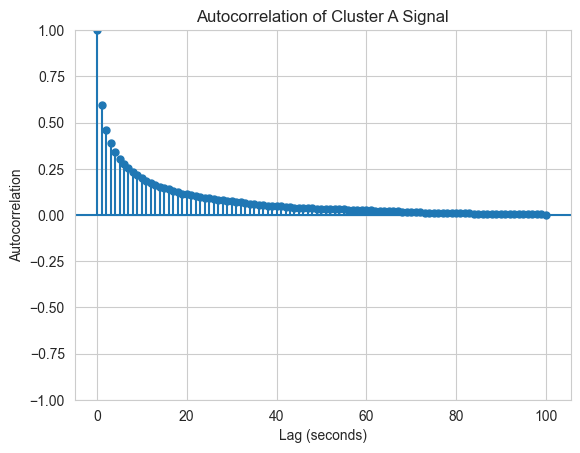

In [222]:
# --- Autocorrelation of the Best Cluster Signal ---
signal_to_check = df_copy['cluster_A_signal'].dropna()

plt.figure(figsize=(12, 5))
plot_acf(signal_to_check, lags=100) # Check up to 100 seconds of memory
plt.title('Autocorrelation of Cluster A Signal')
plt.xlabel('Lag (seconds)')
plt.ylabel('Autocorrelation')
plt.grid(True)
plt.show()


--- Signal Correlation by Hour of Day ---
hour
0     0.511857
1     0.560832
2     0.571754
3     0.584086
4     0.561633
5     0.476347
6     0.584984
7     0.528216
8     0.591878
9     0.574117
10    0.531003
11    0.576919
12    0.563861
13    0.583463
14    0.537042
15    0.520481
16    0.594691
17    0.556430
18    0.568651
19    0.534807
20    0.581384
21    0.430908
22    0.543662
23    0.531928
Name: (cluster_A_signal, price_returns), dtype: float64


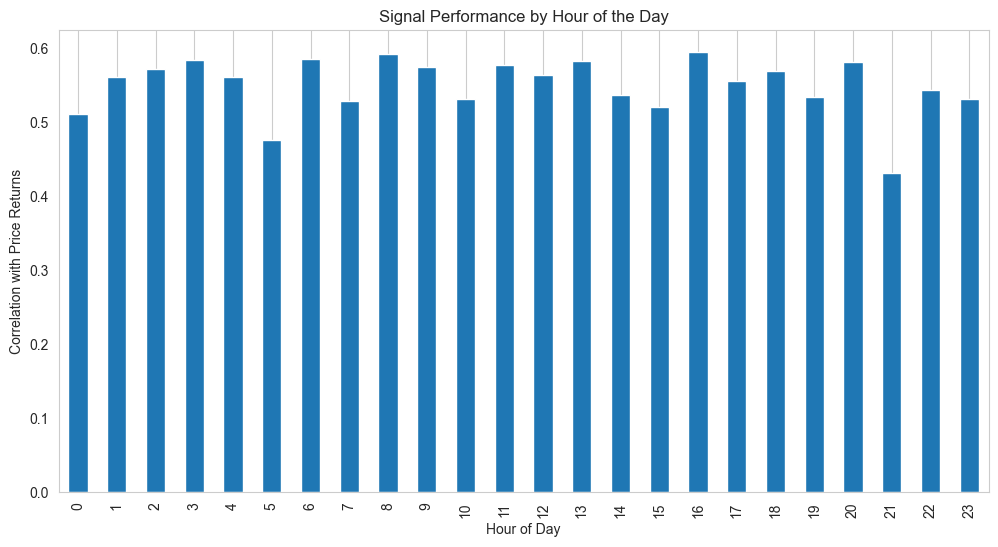

In [223]:
# --- Ensure required columns exist ---
df_intraday = df_copy[['cluster_A_signal', 'price_returns']].dropna().copy()

# --- 1. Create an 'hour' feature ---
df_intraday['hour'] = df_intraday.index.hour

# --- 2. Calculate Correlation for each Hour ---
hourly_corr = df_intraday.groupby('hour')[['cluster_A_signal', 'price_returns']].corr().unstack().iloc[:,1]

print("\n--- Signal Correlation by Hour of Day ---")
print(hourly_corr)

# --- 3. Plot the results ---
hourly_corr.plot(kind='bar', figsize=(12, 6))
plt.title('Signal Performance by Hour of the Day')
plt.ylabel('Correlation with Price Returns')
plt.xlabel('Hour of Day')
plt.grid(axis='y')
plt.show()

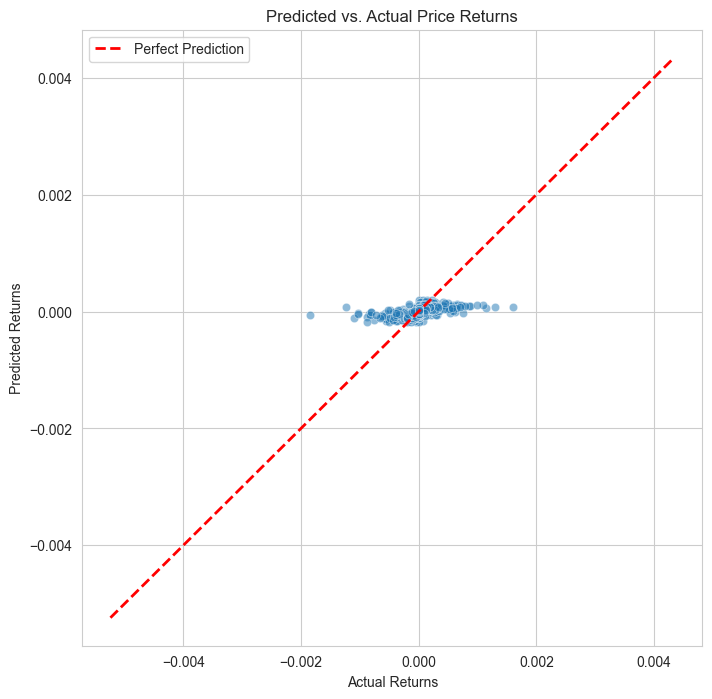

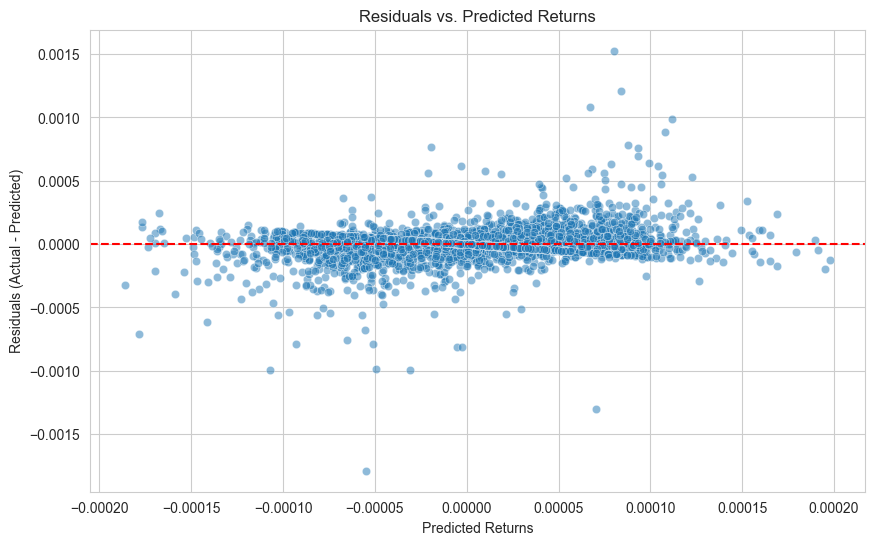

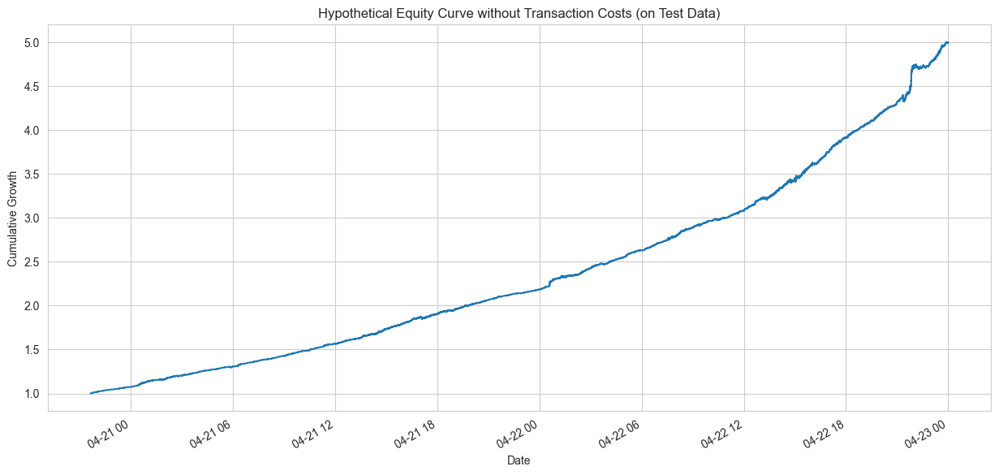

In [263]:
# --- 1. Prepare Your Data and Train the Model (Same as before) ---
features = ['cluster_A_signal', 'cluster_B_signal', 'cluster_C_signal']
target = 'price_returns'
df_model = df_copy[features + [target]].dropna()
X = df_model[features]
y = df_model[target]

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, shuffle=False)

model = LinearRegression()
model.fit(X_train, y_train)

# --- 2. Generate Predictions on the Test Set ---
y_pred = model.predict(X_test)


# ==============================================================================
# VISUALIZATION 1: PREDICTED vs. ACTUAL PLOT
# ==============================================================================
plt.figure(figsize=(8, 8))
# Use a sample for performance and clarity
sample_indices = np.random.choice(len(y_test), 5000, replace=False)
sns.scatterplot(x=y_test.iloc[sample_indices], y=y_pred[sample_indices], alpha=0.5)

# Add the 45-degree line for reference
plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'r--', lw=2, label='Perfect Prediction')

plt.title('Predicted vs. Actual Price Returns')
plt.xlabel('Actual Returns')
plt.ylabel('Predicted Returns')
plt.legend()
plt.grid(True)
plt.show()


# ==============================================================================
# VISUALIZATION 2: RESIDUALS PLOT
# ==============================================================================
residuals = y_test - y_pred

plt.figure(figsize=(10, 6))
# Use a sample for performance and clarity
sns.scatterplot(x=y_pred[sample_indices], y=residuals.iloc[sample_indices], alpha=0.5)

# Add a horizontal line at y=0 for reference
plt.axhline(0, color='red', linestyle='--')

plt.title('Residuals vs. Predicted Returns')
plt.xlabel('Predicted Returns')
plt.ylabel('Residuals (Actual - Predicted)')
plt.grid(True)
plt.show()

TRANSACTION_COST_PCT = 0.0000 # 0.01% per trade (entry or exit)

# ==============================================================================
# VISUALIZATION 3 (Corrected): EQUITY CURVE WITH TRANSACTION COSTS
# ==============================================================================

# Create a DataFrame from test set results
test_results = pd.DataFrame({
    'actual_returns': y_test,
    'predicted_returns': y_pred
})

# 1. Create a signal based on the model's prediction
test_results['signal'] = np.sign(test_results['predicted_returns'])

# 2. Calculate gross returns
test_results['strategy_returns'] = test_results['signal'].shift(1) * test_results['actual_returns']

# 3. Identify trades and calculate costs
# A trade occurs when the signal changes (e.g., from +1 to 0, or 0 to -1, etc.)
test_results['trades'] = test_results['signal'].diff().abs()
test_results['costs'] = test_results['trades'] * TRANSACTION_COST_PCT

# 4. Calculate net returns
test_results['net_returns'] = test_results['strategy_returns'] - test_results['costs']
test_results.dropna(inplace=True)

# 5. Calculate the final cumulative net returns
test_results['cumulative_net_strategy'] = (1 + test_results['net_returns']).cumprod()

# --- Plotting ---
plt.figure(figsize=(15, 7))
test_results['cumulative_net_strategy'].plot()
plt.title('Hypothetical Equity Curve without Transaction Costs (on Test Data)')
plt.ylabel('Cumulative Growth')
plt.xlabel('Date')
plt.grid(True)
plt.show()

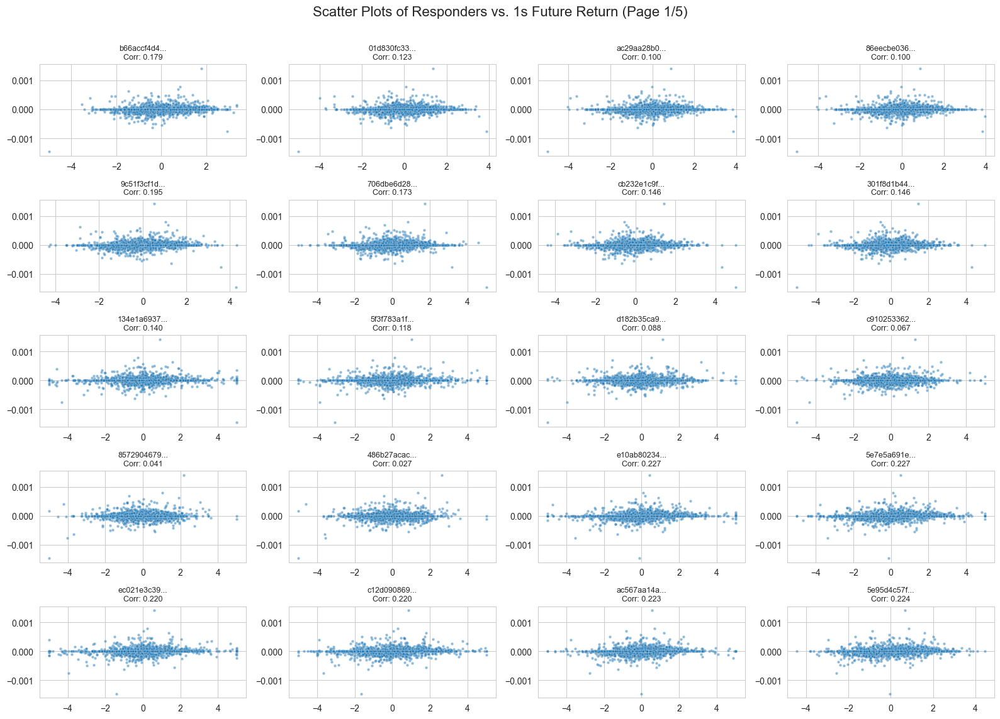

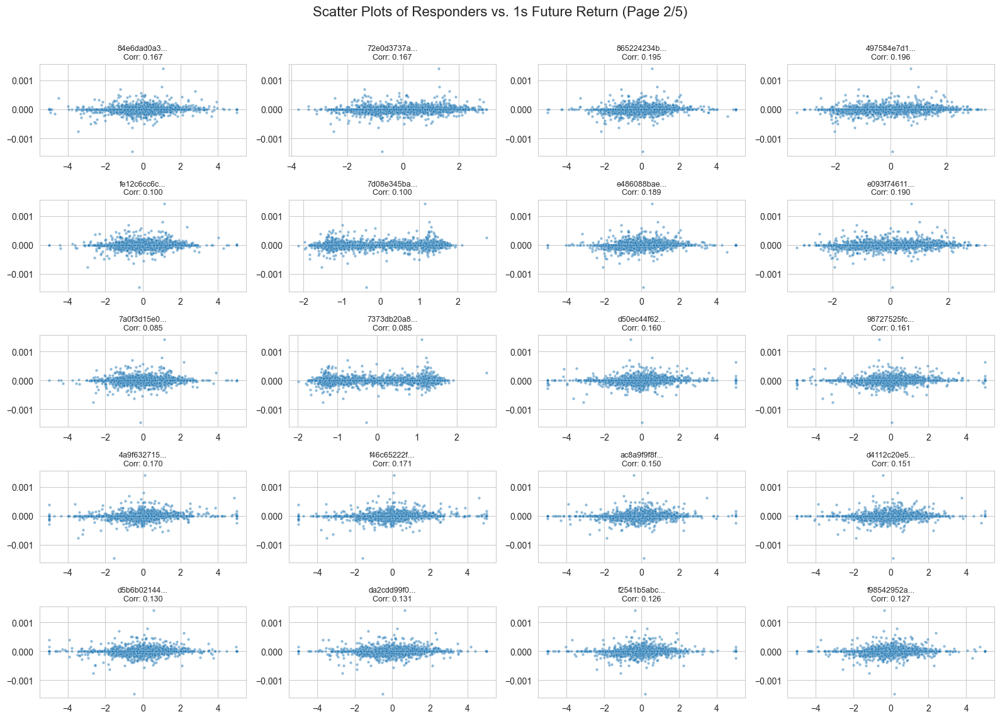

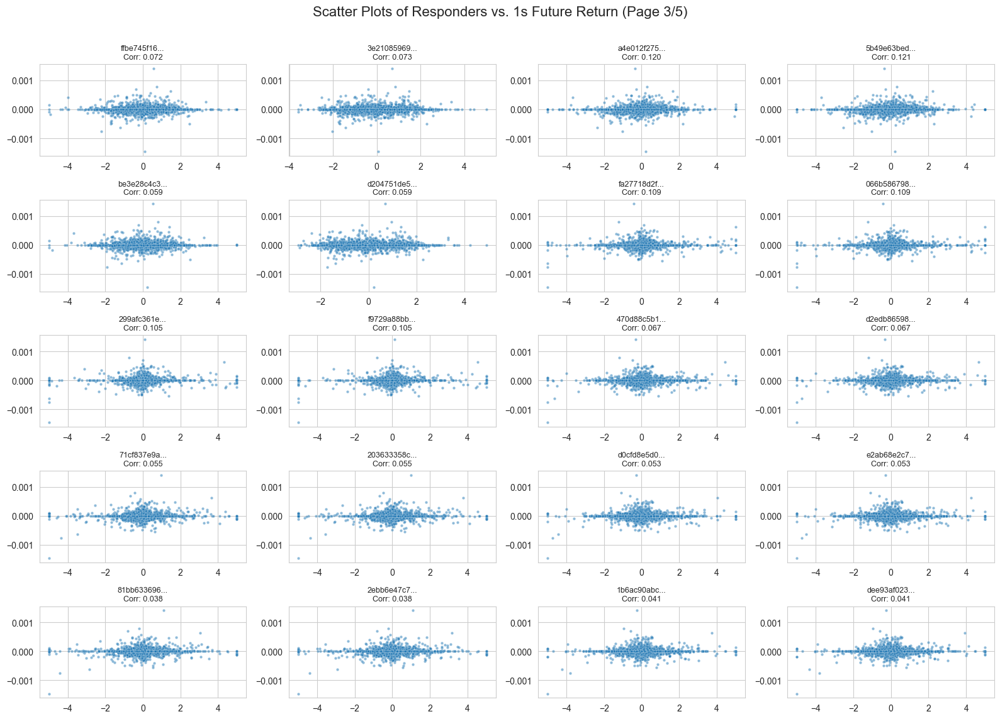

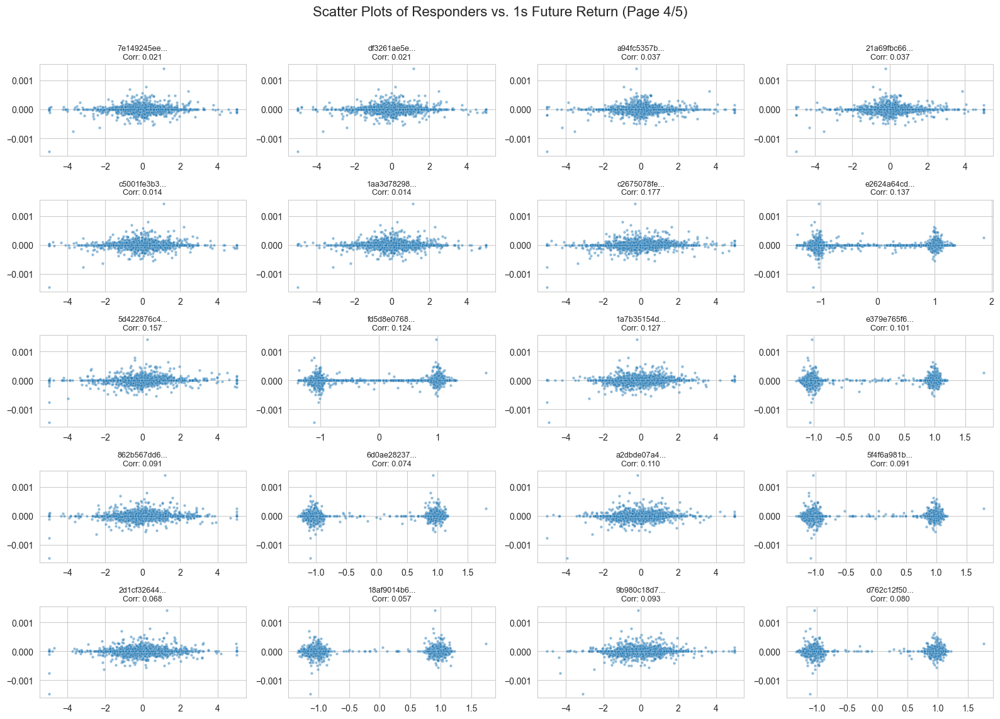

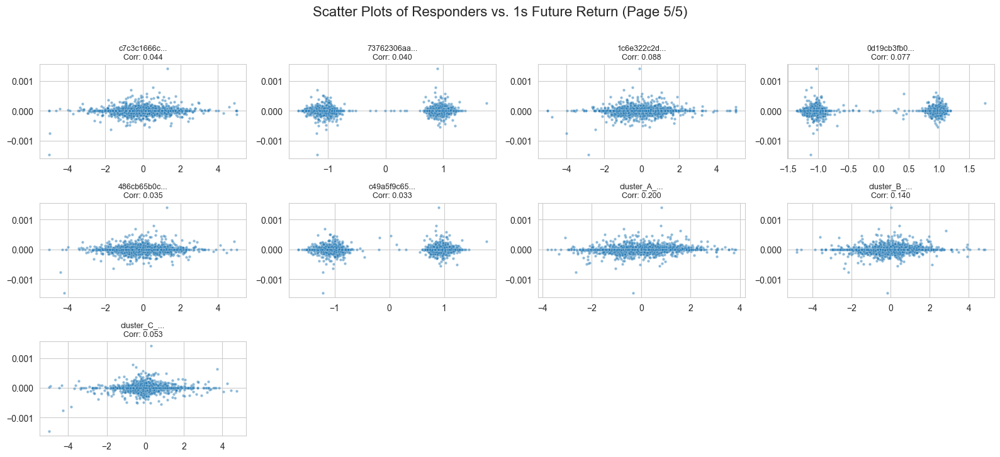

In [290]:
responder_cols_for_plotting = df_copy2.columns.drop(returns_list)

# --- Plotting in a Matrix of Subplots ---

# Define the layout of the subplot matrix
nrows = 5
ncols = 4
plots_per_figure = nrows * ncols

# Calculate the number of figures needed
num_figures = int(np.ceil(len(responder_cols_for_plotting) / plots_per_figure))

# Use a smaller sample for faster plotting in a dense matrix
df_sample = df_copy2.sample(3000, random_state=1)

# Loop to create each figure
for fig_num in range(num_figures):
    fig, axes = plt.subplots(nrows, ncols, figsize=(16, 12))
    
    # Flatten the axes array for easy iteration
    axes = axes.flatten()
    
    # Determine the slice of responders for the current figure
    start_index = fig_num * plots_per_figure
    end_index = start_index + plots_per_figure
    responders_subset = responder_cols_for_plotting[start_index:end_index]
    
    # Create a subplot for each responder in the subset
    for i, responder in enumerate(responders_subset):
        ax = axes[i]
        correlation_value = all_sorted_correlations['ret_1s'].get(responder, 0.0)
        
        sns.scatterplot(data=df_sample, x=responder, y='price_returns_1', alpha=0.5, s=10, ax=ax)
        
        ax.set_title(f'{responder[:10]}...\nCorr: {correlation_value:.3f}', fontsize=9)
        ax.set_xlabel('')
        ax.set_ylabel('')
        ax.grid(True)

    # Hide any unused subplots in the last figure
    for i in range(len(responders_subset), len(axes)):
        axes[i].set_visible(False)
        
    fig.suptitle(f'Scatter Plots of Responders vs. 1s Future Return (Page {fig_num + 1}/{num_figures})', fontsize=16)
    plt.tight_layout(rect=[0, 0.03, 1, 0.97]) # Adjust layout to make room for suptitle
    plt.show()

In [305]:
print(all_sorted_correlations['ret_1s'].sort_values(ascending=False))

# --- Conditional Correlation Analysis by Return Quintile ---

# 1. Create a temporary DataFrame for this analysis to keep df_copy2 clean
df_conditional = df_copy2.copy()

# 2. Define the columns to correlate (responders)
# Ensure we exclude all return-related and helper columns
cols_to_exclude = returns_list + ['volatility', 'returns']
responder_cols = df_conditional.columns.drop(cols_to_exclude, errors='ignore')

# 3. Create quintiles based on 1-second future returns
# We use qcut to divide the data into 5 equal-sized groups (quintiles)
# 'labels' provides meaningful names for the groups
try:
    df_conditional['return_quintile'] = pd.qcut(
        df_conditional['price_returns_1'],
        q=3,
        labels=['Q1', 'Q2', 'Q3', 'Q4', 'Q5']
        # include_lowest=True,
        # duplicates='drop', # Handles cases where quantile edges are not unique
        # retbins=True,
        # labels=False
    )

    # 4. Group by quintile and calculate correlation for each group
    # We will store the results in a list of Series
    quintile_correlations = []

    for quintile_name, group_df in df_conditional.groupby('return_quintile'):
        # For each quintile, calculate the correlation of responders with future returns
        # Using Spearman correlation as it's robust to outliers
        corrs = group_df[responder_cols].corrwith(group_df['price_returns_1'], method='spearman')
        corrs.name = quintile_name
        quintile_correlations.append(corrs)

    # 5. Combine the results into a single DataFrame for easy comparison
    conditional_corr_df = pd.concat(quintile_correlations, axis=1)

    print("\n--- Spearman Correlation of Responders with 1s Future Return, by Return Quintile ---")
    with pd.option_context('display.max_rows', None): # Ensure all rows are printed
        print(conditional_corr_df)

except ValueError as e:
    print(f"\nCould not perform conditional analysis. Error during quintile creation: {e}")
    print("This can happen if the 'price_returns_1' column has too many identical values, making it impossible to create distinct groups.")


5e7e5a691e    0.227470
e10ab80234    0.227092
5e95d4c57f    0.223602
ac567aa14a    0.222947
c12d090869    0.220332
                ...   
486b27acac    0.027135
7e149245ee    0.020643
df3261ae5e    0.020643
1aa3d78298    0.014316
c5001fe3b3    0.014312
Name: price_returns_1, Length: 89, dtype: float64

Could not perform conditional analysis. Error during quintile creation: Bin edges must be unique: Index([-0.004162907600402832, 0.0, 0.0, 0.0039386749267578125], dtype='float64', name='price_returns_1').
You can drop duplicate edges by setting the 'duplicates' kwarg
This can happen if the 'price_returns_1' column has too many identical values, making it impossible to create distinct groups.


In [303]:
df_conditional['return_quintile'].value_counts()

return_quintile
Q3    422743
Q4       219
Q2        90
Q1         6
Q5         5
Name: count, dtype: int64

In [297]:
print(df_conditional.head)

<bound method NDFrame.head of                          mid_prc  b66accf4d4  01d830fc33  ac29aa28b0  \
timestamp                                                              
2025-04-16 00:00:05  1588.010010    5.000000    5.000000    5.000000   
2025-04-16 00:00:06  1587.824951   -5.000000   -5.000000   -5.000000   
2025-04-16 00:00:07  1587.824951   -5.000000   -5.000000   -5.000000   
2025-04-16 00:00:08  1587.305054   -5.000000   -5.000000   -5.000000   
2025-04-16 00:00:09  1587.285034   -5.000000   -5.000000   -5.000000   
...                          ...         ...         ...         ...   
2025-04-20 21:37:07  1590.234985    0.187653   -0.205063   -0.294818   
2025-04-20 21:37:08  1590.234985    0.442364   -0.072251   -0.209293   
2025-04-20 21:37:09  1590.395020   -0.004306   -0.587807   -0.614311   
2025-04-20 21:37:10  1590.334961   -0.657712   -0.644728   -0.654655   
2025-04-20 21:37:11  1590.170044   -0.107688   -0.169117   -0.182553   

                     86eecbe036  

Plotting for the first quintile, which contains 219 data points.


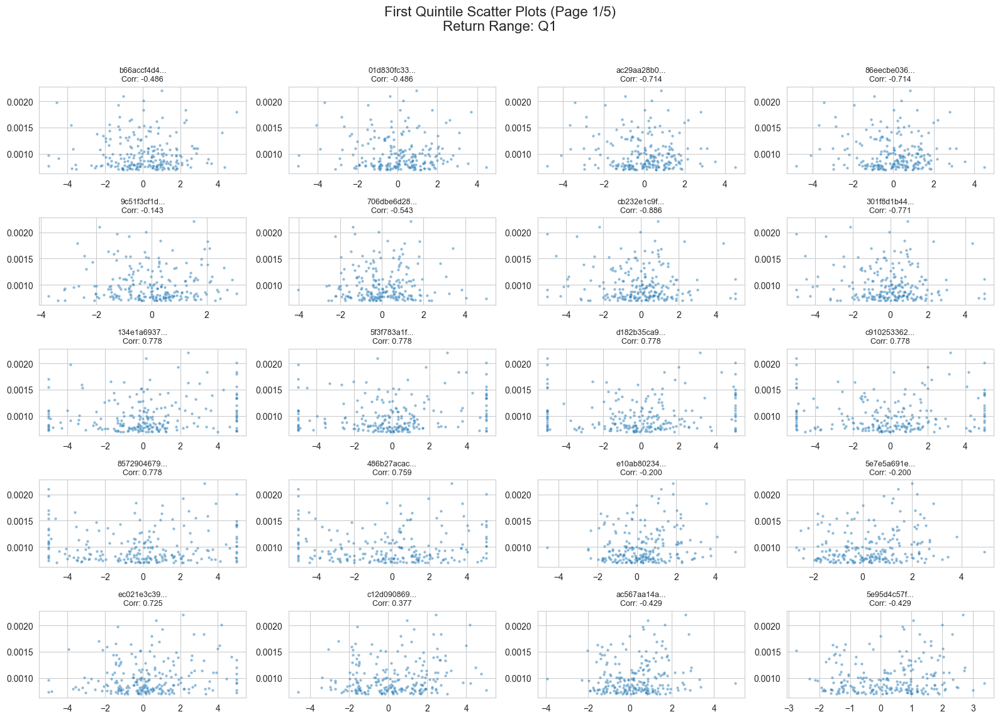

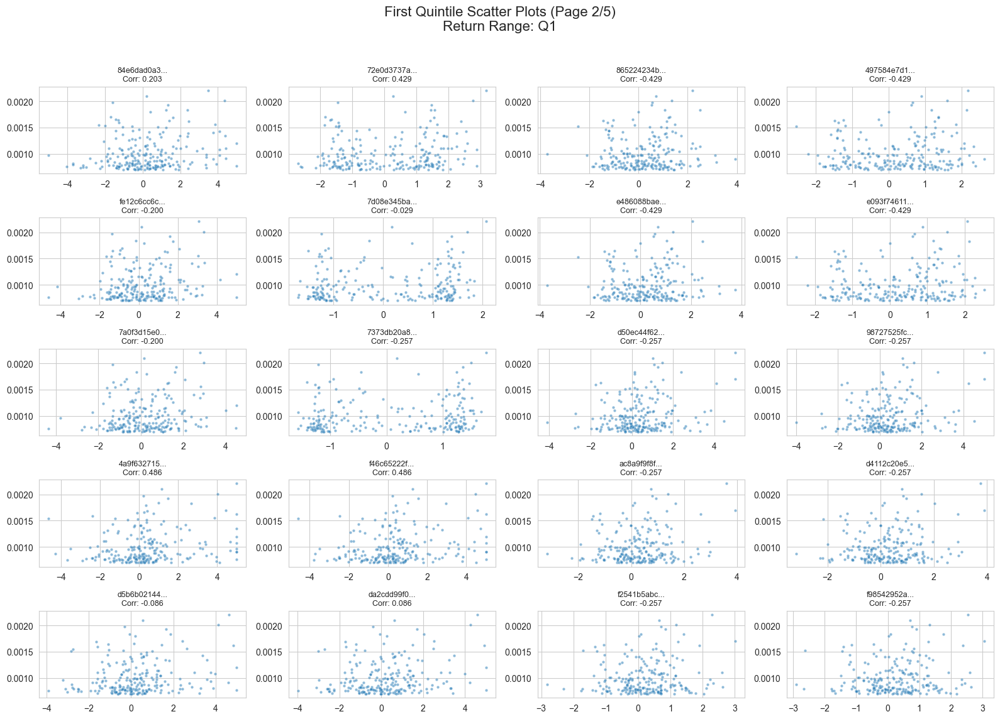

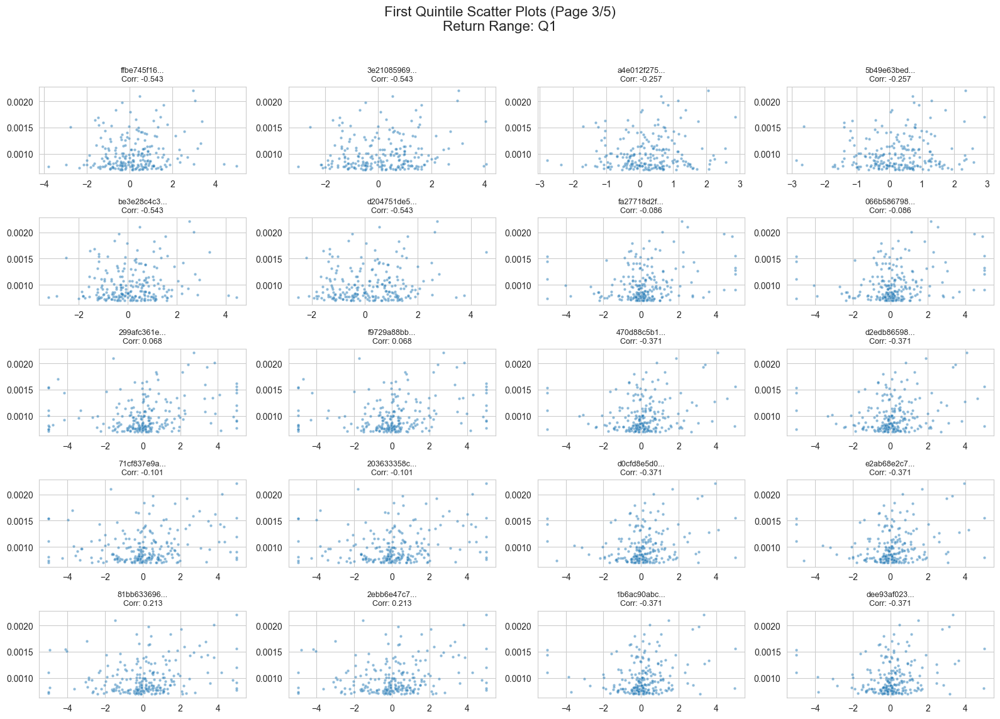

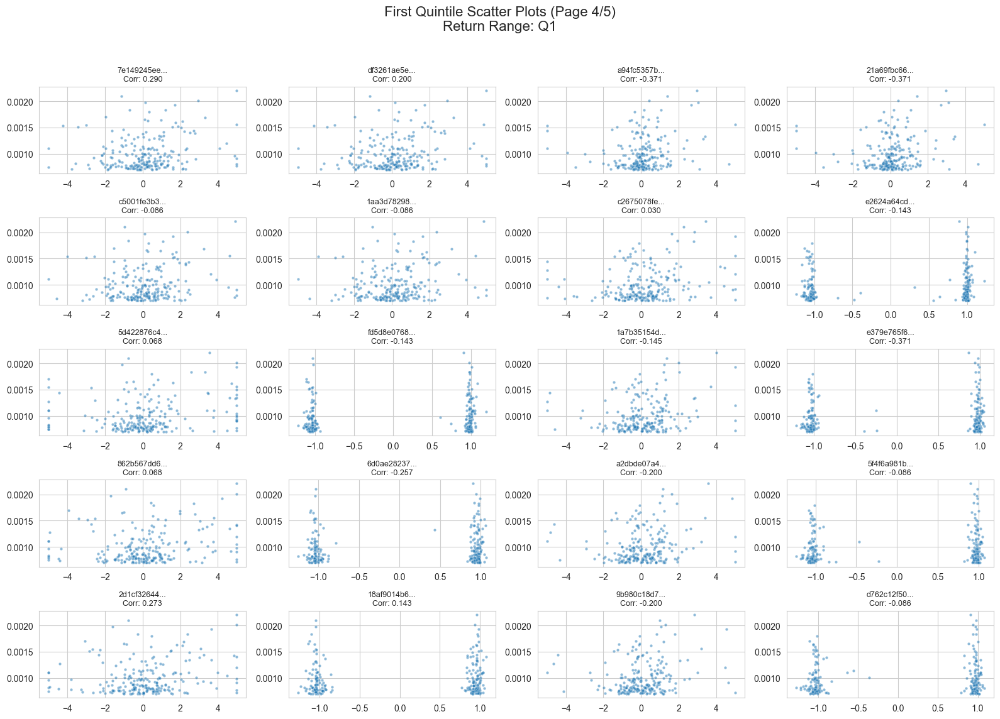

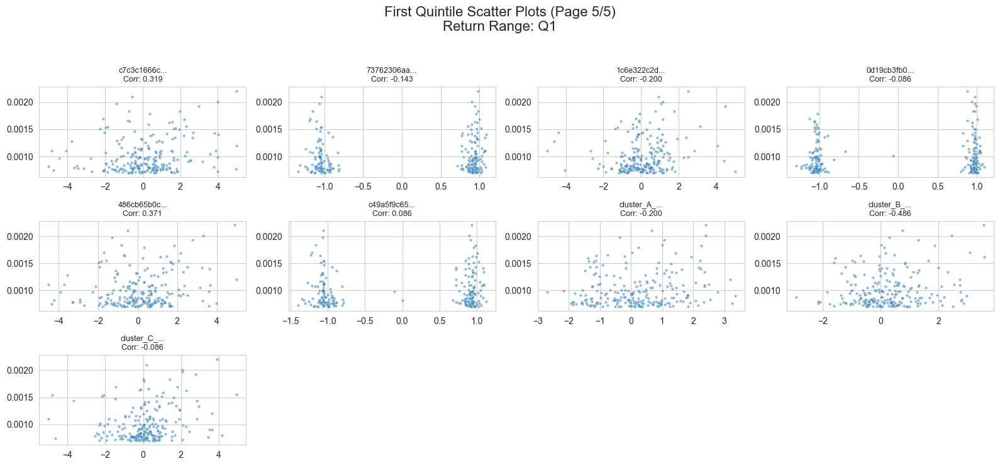

In [302]:
# --- Scatter Plots for the First Quintile ---

# 1. Isolate the data for the first quintile (labeled 0 by qcut)
# This assumes the previous cell has been run to create df_conditional
try:
    df_quintile_1 = df_conditional[df_conditional['return_quintile'] == 'Q4'].copy()
    print(f"Plotting for the first quintile, which contains {len(df_quintile_1)} data points.")

    # 2. Get the correlations specific to this quintile from the previously calculated DataFrame
    # The column name will be the Interval object for the first quintile
    first_quintile_corr_col = conditional_corr_df.columns[0]
    quintile_1_correlations = conditional_corr_df[first_quintile_corr_col]

    # 3. Setup for plotting
    responder_cols_for_plotting = df_copy2.columns.drop(returns_list)
    nrows = 5
    ncols = 4
    plots_per_figure = nrows * ncols
    num_figures = int(np.ceil(len(responder_cols_for_plotting) / plots_per_figure))

    # Use a sample if the quintile is very large, otherwise use all of it
    sample_size = min(len(df_quintile_1), 5000)
    df_sample = df_quintile_1.sample(sample_size, random_state=1)

    # 4. Loop to create each figure
    for fig_num in range(num_figures):
        fig, axes = plt.subplots(nrows, ncols, figsize=(16, 12))
        axes = axes.flatten()
        
        start_index = fig_num * plots_per_figure
        end_index = start_index + plots_per_figure
        responders_subset = responder_cols_for_plotting[start_index:end_index]
        
        for i, responder in enumerate(responders_subset):
            ax = axes[i]
            correlation_value = quintile_1_correlations.get(responder, 0.0)
            
            sns.scatterplot(data=df_sample, x=responder, y='price_returns_1', alpha=0.5, s=10, ax=ax)
            
            ax.set_title(f'{responder[:10]}...\nCorr: {correlation_value:.3f}', fontsize=9)
            ax.set_xlabel('')
            ax.set_ylabel('')
            ax.grid(True)

        # Hide unused subplots
        for i in range(len(responders_subset), len(axes)):
            axes[i].set_visible(False)
            
        fig.suptitle(f'First Quintile Scatter Plots (Page {fig_num + 1}/{num_figures})\nReturn Range: {first_quintile_corr_col}', fontsize=16)
        plt.tight_layout(rect=[0, 0.03, 1, 0.96])
        plt.show()

except (NameError, KeyError):
    print("Could not generate plots. Please ensure the previous cell calculating quintiles has been run successfully.")
except IndexError:
    print("Could not generate plots. The 'conditional_corr_df' DataFrame appears to be empty.")

In [308]:
df_copy2.columns

Index(['mid_prc', 'b66accf4d4', '01d830fc33', 'ac29aa28b0', '86eecbe036',
       '9c51f3cf1d', '706dbe6d28', 'cb232e1c9f', '301f8d1b44', '134e1a6937',
       '5f3f783a1f', 'd182b35ca9', 'c910253362', '8572904679', '486b27acac',
       'e10ab80234', '5e7e5a691e', 'ec021e3c39', 'c12d090869', 'ac567aa14a',
       '5e95d4c57f', '84e6dad0a3', '72e0d3737a', '865224234b', '497584e7d1',
       'fe12c6cc6c', '7d08e345ba', 'e486088bae', 'e093f74611', '7a0f3d15e0',
       '7373db20a8', 'd50ec44f62', '98727525fc', '4a9f632715', 'f46c65222f',
       'ac8a9f9f8f', 'd4112c20e5', 'd5b6b02144', 'da2cdd99f0', 'f2541b5abc',
       'f98542952a', 'ffbe745f16', '3e21085969', 'a4e012f275', '5b49e63bed',
       'be3e28c4c3', 'd204751de5', 'fa27718d2f', '066b586798', '299afc361e',
       'f9729a88bb', '470d88c5b1', 'd2edb86598', '71cf837e9a', '203633358c',
       'd0cfd8e5d0', 'e2ab68e2c7', '81bb633696', '2ebb6e47c7', '1b6ac90abc',
       'dee93af023', '7e149245ee', 'df3261ae5e', 'a94fc5357b', '21a69fbc66',
  

In [311]:
df_copy3 = df_copy2.copy()
df_copy3.drop(columns=['price_returns_5', 'price_returns_4', 'price_returns_3', 'price_returns_2', 
                       'cluster_A_signal', 'cluster_B_signal', 'cluster_C_signal'], inplace=True, errors='ignore')

In [312]:
print(df_copy3.columns)

Index(['mid_prc', 'b66accf4d4', '01d830fc33', 'ac29aa28b0', '86eecbe036',
       '9c51f3cf1d', '706dbe6d28', 'cb232e1c9f', '301f8d1b44', '134e1a6937',
       '5f3f783a1f', 'd182b35ca9', 'c910253362', '8572904679', '486b27acac',
       'e10ab80234', '5e7e5a691e', 'ec021e3c39', 'c12d090869', 'ac567aa14a',
       '5e95d4c57f', '84e6dad0a3', '72e0d3737a', '865224234b', '497584e7d1',
       'fe12c6cc6c', '7d08e345ba', 'e486088bae', 'e093f74611', '7a0f3d15e0',
       '7373db20a8', 'd50ec44f62', '98727525fc', '4a9f632715', 'f46c65222f',
       'ac8a9f9f8f', 'd4112c20e5', 'd5b6b02144', 'da2cdd99f0', 'f2541b5abc',
       'f98542952a', 'ffbe745f16', '3e21085969', 'a4e012f275', '5b49e63bed',
       'be3e28c4c3', 'd204751de5', 'fa27718d2f', '066b586798', '299afc361e',
       'f9729a88bb', '470d88c5b1', 'd2edb86598', '71cf837e9a', '203633358c',
       'd0cfd8e5d0', 'e2ab68e2c7', '81bb633696', '2ebb6e47c7', '1b6ac90abc',
       'dee93af023', '7e149245ee', 'df3261ae5e', 'a94fc5357b', '21a69fbc66',
  

In [313]:
df_test = df_copy.iloc[split_index:].copy()

In [314]:
print(f"\nOriginal DataFrame length: {len(df_copy)}")
print(f"New DataFrame (df_copy2) length: {len(df_copy2)}")
print(f"Data in df_copy2 ends at: {df_copy2.index[-1]}")
print(f"Data in df_test starts at: {df_test.index[0]}")


Original DataFrame length: 604378
New DataFrame (df_copy2) length: 423064
Data in df_copy2 ends at: 2025-04-20 21:37:11
Data in df_test starts at: 2025-04-20 21:37:12


In [315]:
# Save the processed training and testing dataframes to Parquet files
# This is useful for loading them later without re-running the preprocessing steps.

# Define file paths for the output
train_output_path = './train_data.parquet'
test_output_path = './test_data.parquet'

# Save the training data (df_copy3)
df_copy3.to_parquet(train_output_path)
print(f"Training data saved to: {train_output_path}")

# Save the testing data (df_test)
df_test.to_parquet(test_output_path)
print(f"Testing data saved to: {test_output_path}")

Training data saved to: ./train_data.parquet
Testing data saved to: ./test_data.parquet


In [317]:
print(df_copy3.tail())

                         mid_prc  b66accf4d4  01d830fc33  ac29aa28b0  \
timestamp                                                              
2025-04-20 21:37:07  1590.234985    0.187653   -0.205063   -0.294818   
2025-04-20 21:37:08  1590.234985    0.442364   -0.072251   -0.209293   
2025-04-20 21:37:09  1590.395020   -0.004306   -0.587807   -0.614311   
2025-04-20 21:37:10  1590.334961   -0.657712   -0.644728   -0.654655   
2025-04-20 21:37:11  1590.170044   -0.107688   -0.169117   -0.182553   

                     86eecbe036  9c51f3cf1d  706dbe6d28  cb232e1c9f  \
timestamp                                                             
2025-04-20 21:37:07   -0.294818    0.384975    0.324708    0.127975   
2025-04-20 21:37:08   -0.209293    0.571029    0.523087    0.295832   
2025-04-20 21:37:09   -0.614311   -0.410322    0.245579    0.902693   
2025-04-20 21:37:10   -0.654655   -0.324804   -0.542008    1.152387   
2025-04-20 21:37:11   -0.182553    1.143170   -0.399360    0.026524  

In [321]:
df_test.drop(columns=['cluster_A_signal', 'cluster_B_signal', 'cluster_C_signal', 
                      'price_returns_5', 'price_returns_4', 'price_returns_3', 'price_returns_2',
                      'price_returns_1', 'price_returns'], inplace=True, errors='ignore')
print(df_test.columns)

Index(['mid_prc', 'b66accf4d4', '01d830fc33', 'ac29aa28b0', '86eecbe036',
       '9c51f3cf1d', '706dbe6d28', 'cb232e1c9f', '301f8d1b44', '134e1a6937',
       '5f3f783a1f', 'd182b35ca9', 'c910253362', '8572904679', '486b27acac',
       'e10ab80234', '5e7e5a691e', 'ec021e3c39', 'c12d090869', 'ac567aa14a',
       '5e95d4c57f', '84e6dad0a3', '72e0d3737a', '865224234b', '497584e7d1',
       'fe12c6cc6c', '7d08e345ba', 'e486088bae', 'e093f74611', '7a0f3d15e0',
       '7373db20a8', 'd50ec44f62', '98727525fc', '4a9f632715', 'f46c65222f',
       'ac8a9f9f8f', 'd4112c20e5', 'd5b6b02144', 'da2cdd99f0', 'f2541b5abc',
       'f98542952a', 'ffbe745f16', '3e21085969', 'a4e012f275', '5b49e63bed',
       'be3e28c4c3', 'd204751de5', 'fa27718d2f', '066b586798', '299afc361e',
       'f9729a88bb', '470d88c5b1', 'd2edb86598', '71cf837e9a', '203633358c',
       'd0cfd8e5d0', 'e2ab68e2c7', '81bb633696', '2ebb6e47c7', '1b6ac90abc',
       'dee93af023', '7e149245ee', 'df3261ae5e', 'a94fc5357b', '21a69fbc66',
  

In [463]:
df_copy3 = df_copy2.copy()
df_copy3.drop(columns=['cluster_A_signal', 'cluster_B_signal', 'cluster_C_signal', 
                      'price_returns_5', 'price_returns_4', 'price_returns_3', 'price_returns_2'], inplace=True, errors='ignore')
print(df_copy3.columns)
print(df_copy3.tail())

Index(['mid_prc', 'b66accf4d4', '01d830fc33', 'ac29aa28b0', '86eecbe036',
       '9c51f3cf1d', '706dbe6d28', 'cb232e1c9f', '301f8d1b44', '134e1a6937',
       '5f3f783a1f', 'd182b35ca9', 'c910253362', '8572904679', '486b27acac',
       'e10ab80234', '5e7e5a691e', 'ec021e3c39', 'c12d090869', 'ac567aa14a',
       '5e95d4c57f', '84e6dad0a3', '72e0d3737a', '865224234b', '497584e7d1',
       'fe12c6cc6c', '7d08e345ba', 'e486088bae', 'e093f74611', '7a0f3d15e0',
       '7373db20a8', 'd50ec44f62', '98727525fc', '4a9f632715', 'f46c65222f',
       'ac8a9f9f8f', 'd4112c20e5', 'd5b6b02144', 'da2cdd99f0', 'f2541b5abc',
       'f98542952a', 'ffbe745f16', '3e21085969', 'a4e012f275', '5b49e63bed',
       'be3e28c4c3', 'd204751de5', 'fa27718d2f', '066b586798', '299afc361e',
       'f9729a88bb', '470d88c5b1', 'd2edb86598', '71cf837e9a', '203633358c',
       'd0cfd8e5d0', 'e2ab68e2c7', '81bb633696', '2ebb6e47c7', '1b6ac90abc',
       'dee93af023', '7e149245ee', 'df3261ae5e', 'a94fc5357b', '21a69fbc66',
  

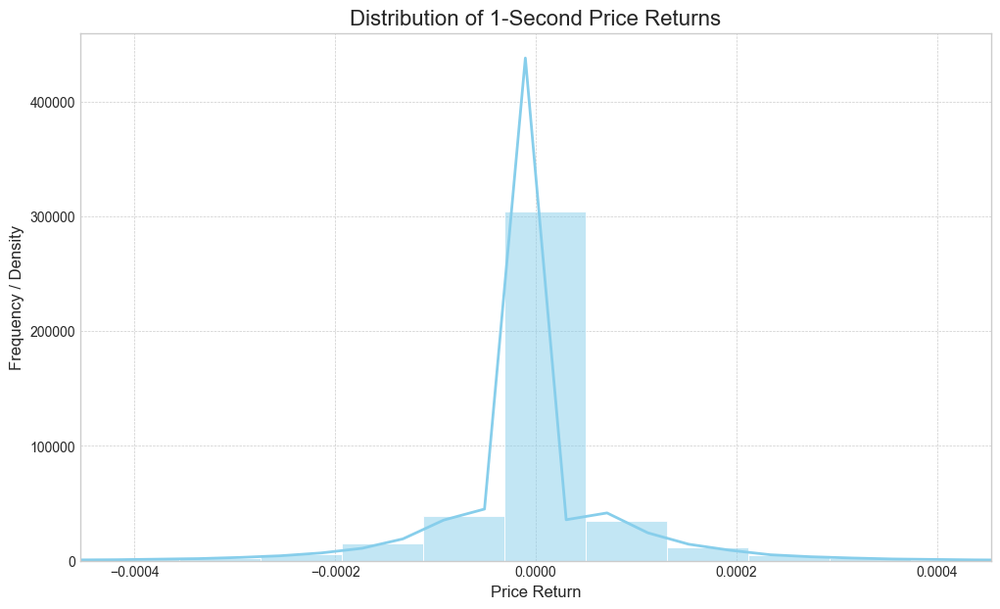

In [464]:
# --- Plotting the distribution of price returns ---

# Drop NaN values from the price_returns column before plotting
price_returns_to_plot = df_copy3['price_returns'].dropna()

plt.figure(figsize=(12, 7))

# Create a histogram with a Kernel Density Estimate (KDE) line
sns.histplot(price_returns_to_plot, bins=100, kde=True, color='skyblue', line_kws={'linewidth': 2})

# --- Enhance the plot ---
plt.title('Distribution of 1-Second Price Returns', fontsize=16)
plt.xlabel('Price Return', fontsize=12)
plt.ylabel('Frequency / Density', fontsize=12)
plt.grid(True, linestyle='--', linewidth=0.5)

# It's common for returns to be highly concentrated around zero.
# We can set a limit on the x-axis to see the distribution more clearly,
# excluding extreme outliers that might squash the view.
# Let's calculate a reasonable limit, e.g., 5 standard deviations.
std_dev = price_returns_to_plot.std()
plt.xlim(-5*std_dev, 5*std_dev)

plt.show()

In [468]:
# Define the thresholds for the signals
bullish_threshold = 0.00001
bearish_threshold = -0.00001

# Create the one-hot encoded columns based on 'price_returns_1'
df_copy3['bullish'] = (df_copy3['price_returns_1'] > bullish_threshold).astype(int)
df_copy3['bearish'] = (df_copy3['price_returns_1'] < bearish_threshold).astype(int)
df_copy3['choppy'] = ((df_copy3['price_returns_1'] >= bearish_threshold) & (df_copy3['price_returns_1'] <= bullish_threshold)).astype(int)

# --- Verification ---
# Display the head of the new columns to check the logic
print("--- Sample of new signal columns ---")
print(df_copy3[['price_returns_1', 'bullish', 'bearish', 'choppy']].head(10))

# Display the total counts for each signal type
print("\n--- Total counts for each signal ---")
print(f"Bullish signals: {df_copy3['bullish'].sum()}")
print(f"Bearish signals: {df_copy3['bearish'].sum()}")
print(f"Choppy signals:  {df_copy3['choppy'].sum()}")

--- Sample of new signal columns ---
                     price_returns_1  bullish  bearish  choppy
timestamp                                                     
2025-04-16 00:00:05        -0.000117        0        1       0
2025-04-16 00:00:06         0.000000        0        0       1
2025-04-16 00:00:07        -0.000327        0        1       0
2025-04-16 00:00:08        -0.000013        0        1       0
2025-04-16 00:00:09         0.000069        1        0       0
2025-04-16 00:00:10         0.000025        1        0       0
2025-04-16 00:00:11        -0.000284        0        1       0
2025-04-16 00:00:12        -0.000044        0        1       0
2025-04-16 00:00:13        -0.000113        0        1       0
2025-04-16 00:00:14         0.000000        0        0       1

--- Total counts for each signal ---
Bullish signals: 71463
Bearish signals: 71804
Choppy signals:  279796


Found 71463 data points for the bullish condition. Plotting a sample...


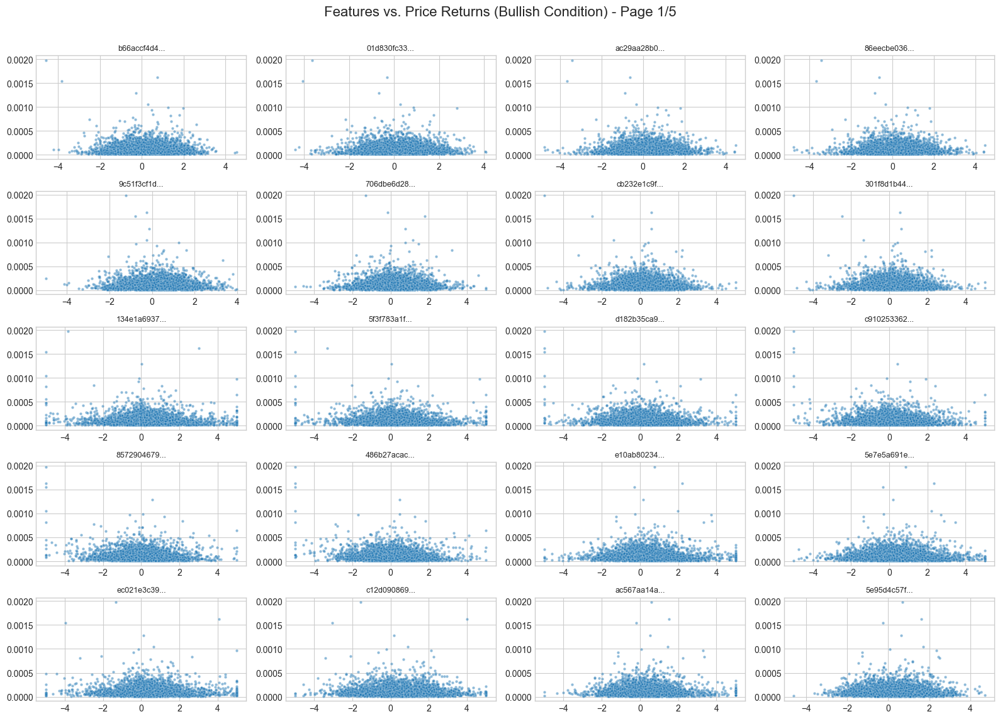

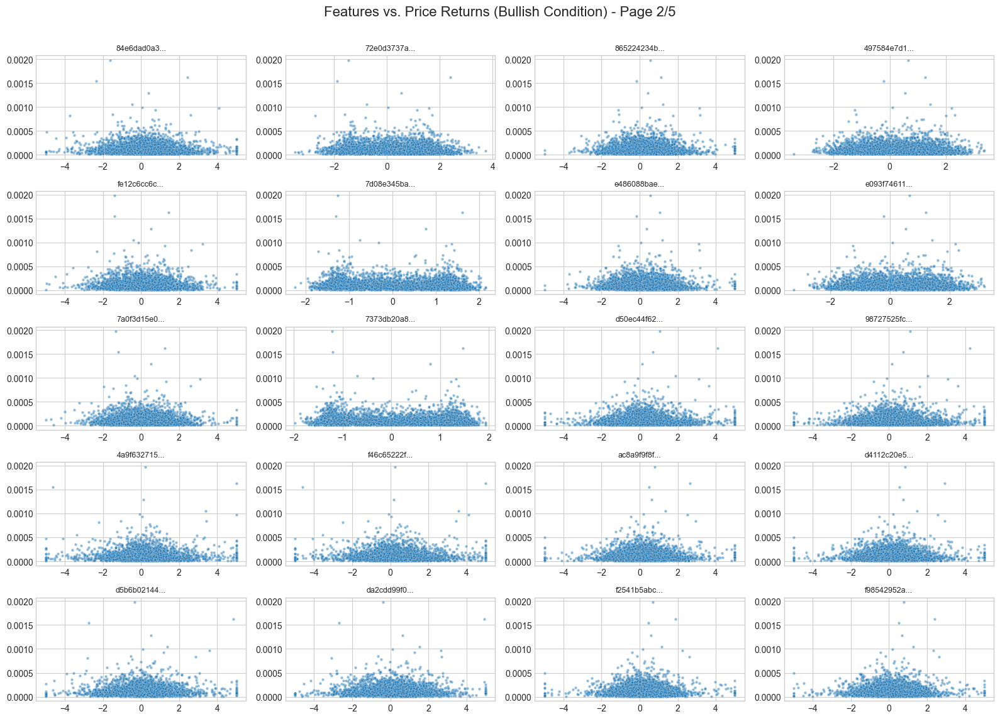

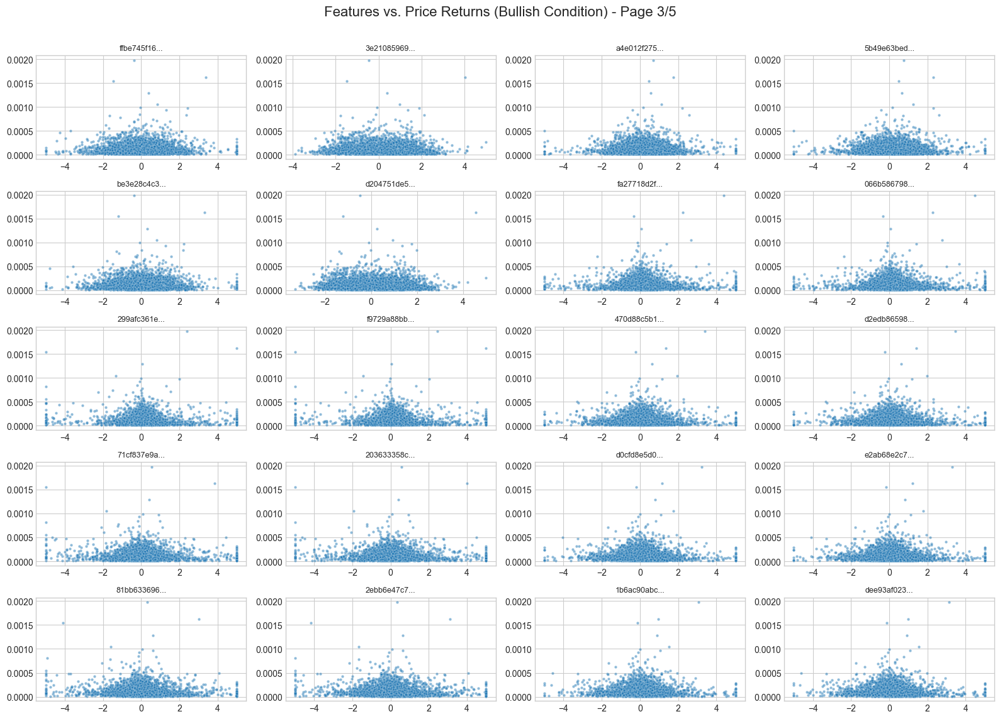

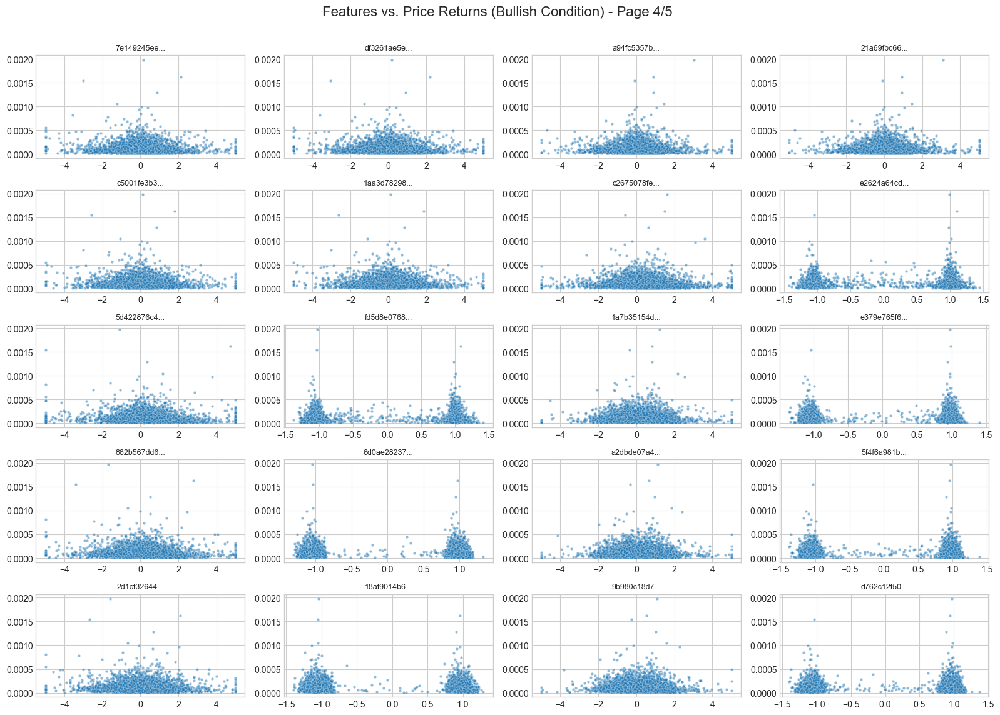

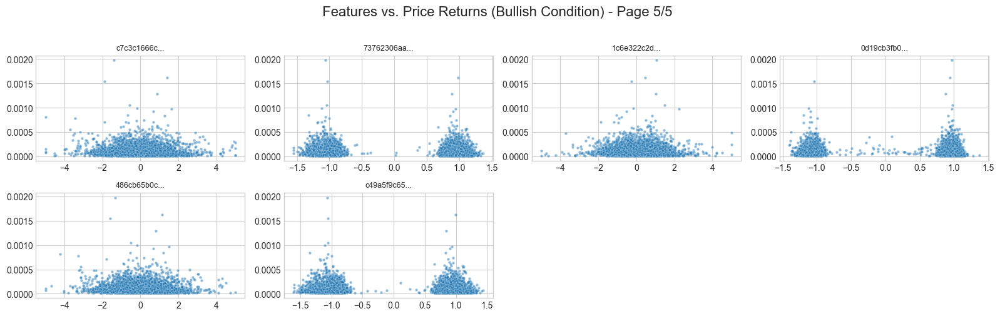

In [469]:
# --- Scatter Plot Matrix for Bullish Condition ---

# 1. Filter the DataFrame for rows where the bullish signal is active
df_bullish = df_copy3[df_copy3['bullish'] == 1].copy()

if df_bullish.empty:
    print("No data points found for the 'bullish == 1' condition. Cannot create plots.")
else:
    print(f"Found {len(df_bullish)} data points for the bullish condition. Plotting a sample...")

    # 2. Define the feature columns to plot
    # Exclude target, helper, and signal columns
    cols_to_exclude = ['mid_prc', 'returns', 'volatility', 'price_returns', 'price_returns_1', 'bullish', 'bearish', 'choppy']
    responder_cols_for_plotting = df_copy3.columns.drop(cols_to_exclude, errors='ignore')

    # 3. Set up the plotting grid parameters
    nrows = 5
    ncols = 4
    plots_per_figure = nrows * ncols
    num_figures = int(np.ceil(len(responder_cols_for_plotting) / plots_per_figure))

    # Use a sample for faster plotting, especially if the filtered data is large
    sample_size = min(len(df_bullish), 5000)
    df_sample = df_bullish.sample(sample_size, random_state=42)

    # 4. Loop to create each figure
    for fig_num in range(num_figures):
        fig, axes = plt.subplots(nrows, ncols, figsize=(16, 12))
        axes = axes.flatten()
        
        # Determine the slice of features for the current figure
        start_index = fig_num * plots_per_figure
        end_index = start_index + plots_per_figure
        responders_subset = responder_cols_for_plotting[start_index:end_index]
        
        # Create a subplot for each feature in the subset
        for i, responder in enumerate(responders_subset):
            ax = axes[i]
            sns.scatterplot(data=df_sample, x=responder, y='price_returns_1', alpha=0.5, s=10, ax=ax)
            
            ax.set_title(f'{responder[:10]}...', fontsize=9)
            ax.set_xlabel('')
            ax.set_ylabel('')
            ax.grid(True)

        # Hide any unused subplots in the last figure
        for i in range(len(responders_subset), len(axes)):
            axes[i].set_visible(False)
            
        fig.suptitle(f'Features vs. Price Returns (Bullish Condition) - Page {fig_num + 1}/{num_figures}', fontsize=16)
        plt.tight_layout(rect=[0, 0.03, 1, 0.97])
        plt.show()

In [470]:
# --- Correlation Analysis for Bullish Condition ---

if df_bullish.empty:
    print("No data points found for the 'bullish == 1' condition. Cannot calculate correlations.")
else:
    # 1. Define the feature columns to correlate
    # (This is the same list as used for plotting)
    cols_to_exclude = ['mid_prc', 'returns', 'volatility', 'price_returns', 'price_returns_1', 'bullish', 'bearish', 'choppy',
                       'TrendStrength', 'TrendStrength_Smoothed', 'ChoppyStrength', 'ChoppyStrength_Smoothed',
                       'target_var']
    responder_cols_for_corr = df_bullish.columns.drop(cols_to_exclude, errors='ignore')

    # 2. Calculate the correlation of each feature with 'price_returns'
    # We'll use the df_bullish dataframe which is already filtered
    bullish_correlations = df_bullish[responder_cols_for_corr].corrwith(df_bullish['price_returns_1'], method='spearman')

    # 3. Sort the correlations in descending order
    sorted_bullish_correlations = bullish_correlations.sort_values(ascending=False)

    # 4. Print the results
    print("--- Feature Correlations with Price Returns (Bullish Condition Only) ---")
    with pd.option_context('display.max_rows', None): # Ensure all rows are printed
        print(sorted_bullish_correlations)

--- Feature Correlations with Price Returns (Bullish Condition Only) ---
ac29aa28b0    0.017399
86eecbe036    0.017399
01d830fc33    0.013507
98727525fc   -0.003481
d50ec44f62   -0.003619
b66accf4d4   -0.009829
1aa3d78298   -0.014069
c5001fe3b3   -0.014236
d4112c20e5   -0.016481
ac8a9f9f8f   -0.016790
301f8d1b44   -0.017608
cb232e1c9f   -0.017616
df3261ae5e   -0.019272
7e149245ee   -0.019412
f98542952a   -0.022447
5b49e63bed   -0.022866
f2541b5abc   -0.023091
a4e012f275   -0.023637
f46c65222f   -0.023749
4a9f632715   -0.024179
21a69fbc66   -0.026343
a94fc5357b   -0.026438
9c51f3cf1d   -0.027189
dee93af023   -0.027688
1b6ac90abc   -0.027791
2ebb6e47c7   -0.028173
81bb633696   -0.028276
e2ab68e2c7   -0.031544
d0cfd8e5d0   -0.031649
706dbe6d28   -0.031914
203633358c   -0.034329
d204751de5   -0.034390
71cf837e9a   -0.034403
d2edb86598   -0.035855
470d88c5b1   -0.035965
be3e28c4c3   -0.037743
3e21085969   -0.039430
c49a5f9c65   -0.039599
d762c12f50   -0.040964
0d19cb3fb0   -0.041401
5f4f6a9

Found 71804 data points for the bearish condition. Plotting a sample...


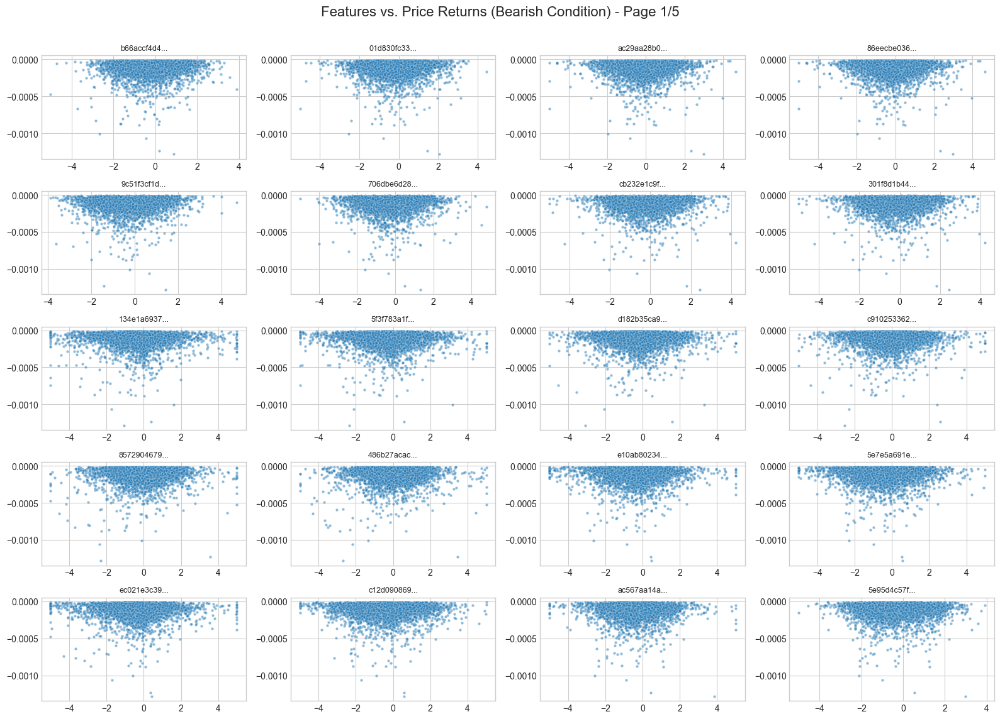

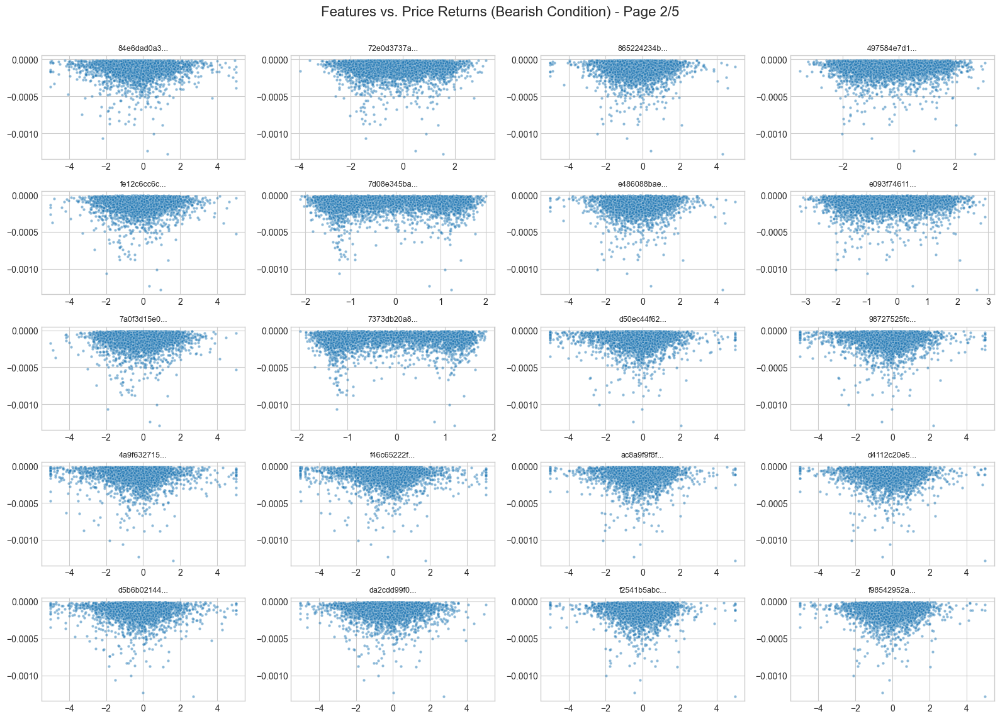

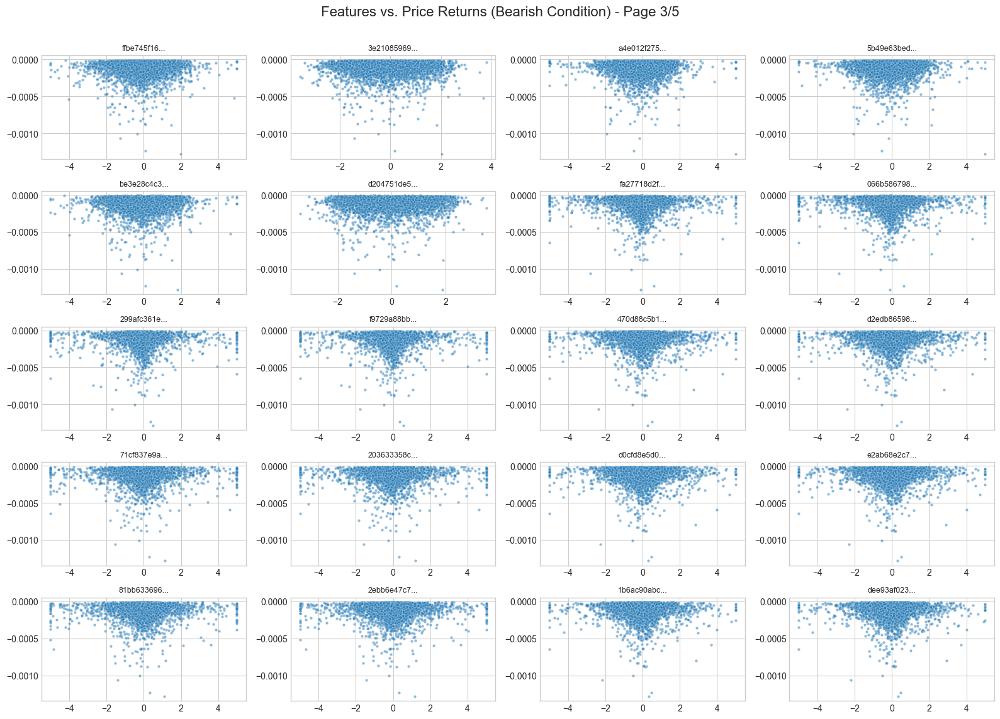

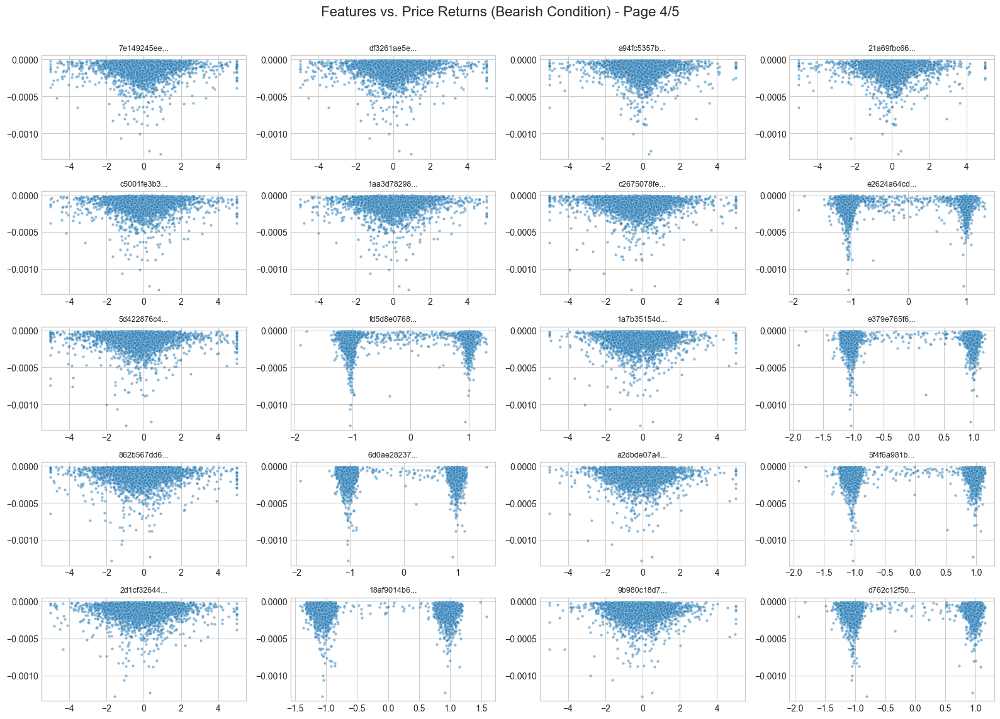

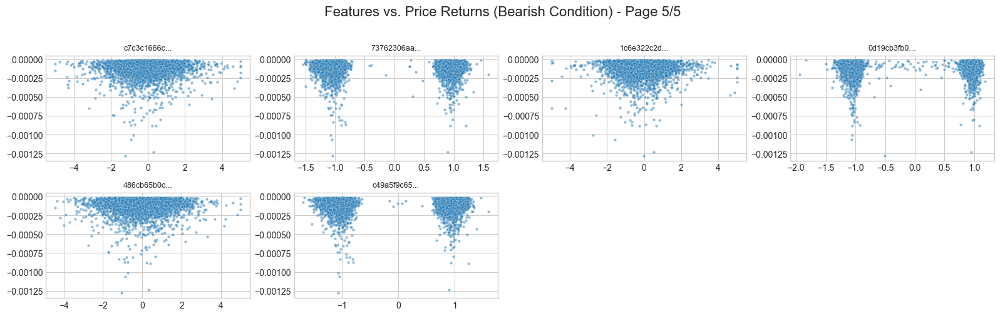

In [471]:
# --- Scatter Plot Matrix for Bullish Condition ---

# 1. Filter the DataFrame for rows where the bearish signal is active
df_bearish = df_copy3[df_copy3['bearish'] == 1].copy()

if df_bearish.empty:
    print("No data points found for the 'bearish == 1' condition. Cannot create plots.")
else:
    print(f"Found {len(df_bearish)} data points for the bearish condition. Plotting a sample...")

    # 2. Define the feature columns to plot
    # Exclude target, helper, and signal columns
    cols_to_exclude = ['mid_prc', 'returns', 'volatility', 'price_returns', 'price_returns_1', 'bullish', 'bearish', 'choppy']
    responder_cols_for_plotting = df_copy3.columns.drop(cols_to_exclude, errors='ignore')

    # 3. Set up the plotting grid parameters
    nrows = 5
    ncols = 4
    plots_per_figure = nrows * ncols
    num_figures = int(np.ceil(len(responder_cols_for_plotting) / plots_per_figure))

    # Use a sample for faster plotting, especially if the filtered data is large
    sample_size = min(len(df_bearish), 5000)
    df_sample = df_bearish.sample(sample_size, random_state=42)

    # 4. Loop to create each figure
    for fig_num in range(num_figures):
        fig, axes = plt.subplots(nrows, ncols, figsize=(16, 12))
        axes = axes.flatten()
        
        # Determine the slice of features for the current figure
        start_index = fig_num * plots_per_figure
        end_index = start_index + plots_per_figure
        responders_subset = responder_cols_for_plotting[start_index:end_index]
        
        # Create a subplot for each feature in the subset
        for i, responder in enumerate(responders_subset):
            ax = axes[i]
            sns.scatterplot(data=df_sample, x=responder, y='price_returns_1', alpha=0.5, s=10, ax=ax)
            
            ax.set_title(f'{responder[:10]}...', fontsize=9)
            ax.set_xlabel('')
            ax.set_ylabel('')
            ax.grid(True)

        # Hide any unused subplots in the last figure
        for i in range(len(responders_subset), len(axes)):
            axes[i].set_visible(False)
            
        fig.suptitle(f'Features vs. Price Returns (Bearish Condition) - Page {fig_num + 1}/{num_figures}', fontsize=16)
        plt.tight_layout(rect=[0, 0.03, 1, 0.97])
        plt.show()

In [472]:
# --- Correlation Analysis for Bearish Condition ---

if df_bearish.empty:
    print("No data points found for the 'bearish == 1' condition. Cannot calculate correlations.")
else:
    # 1. Define the feature columns to correlate
    # (This is the same list as used for plotting)
    cols_to_exclude = ['mid_prc', 'returns', 'volatility', 'price_returns', 'price_returns_1', 'bullish', 'bearish', 'choppy',
                       'TrendStrength', 'TrendStrength_Smoothed', 'ChoppyStrength', 'ChoppyStrength_Smoothed',
                       'target_var']
    responder_cols_for_corr = df_bearish.columns.drop(cols_to_exclude, errors='ignore')

    # 2. Calculate the correlation of each feature with 'price_returns_1'
    # We'll use the df_bearish dataframe which is already filtered
    bearish_correlations = df_bearish[responder_cols_for_corr].corrwith(df_bearish['price_returns_1'], method='spearman')
    # 3. Sort the correlations in descending order
    sorted_bearish_correlations = bearish_correlations.sort_values(ascending=False)

    # 4. Print the results
    print("--- Feature Correlations with Price Returns (Bearish Condition Only) ---")
    with pd.option_context('display.max_rows', None): # Ensure all rows are printed
        print(sorted_bearish_correlations)

--- Feature Correlations with Price Returns (Bearish Condition Only) ---
ac29aa28b0    0.043258
86eecbe036    0.043258
01d830fc33    0.039515
b66accf4d4    0.022411
9c51f3cf1d    0.001506
301f8d1b44    0.001275
cb232e1c9f    0.001126
98727525fc   -0.006290
d50ec44f62   -0.006366
c5001fe3b3   -0.008052
1aa3d78298   -0.008099
706dbe6d28   -0.009608
a4e012f275   -0.010590
5b49e63bed   -0.011154
f2541b5abc   -0.012935
f98542952a   -0.013297
7e149245ee   -0.014598
df3261ae5e   -0.014614
d4112c20e5   -0.016078
ac8a9f9f8f   -0.016095
f46c65222f   -0.019539
4a9f632715   -0.019712
486cb65b0c   -0.024640
2ebb6e47c7   -0.025373
81bb633696   -0.025410
be3e28c4c3   -0.026028
486b27acac   -0.026859
d204751de5   -0.028697
ffbe745f16   -0.029785
21a69fbc66   -0.029909
a94fc5357b   -0.030064
203633358c   -0.031046
71cf837e9a   -0.031112
5e7e5a691e   -0.031150
e10ab80234   -0.031375
dee93af023   -0.031443
1b6ac90abc   -0.031594
3e21085969   -0.031775
c7c3c1666c   -0.031983
d5b6b02144   -0.033327
da2cdd9

In [473]:
# --- Merge and Compare Bullish vs. Bearish Correlations ---

try:
    # Rename the series to create clear column names in the final DataFrame
    sorted_bullish_correlations.name = 'bullish_corr'
    sorted_bearish_correlations.name = 'bearish_corr'

    # Concatenate the two Series into a single DataFrame, aligning on the feature index
    corr_comparison_df = pd.concat([sorted_bullish_correlations, sorted_bearish_correlations], axis=1)

    # Calculate the difference in correlation between the two states
    corr_comparison_df['corr_diff'] = corr_comparison_df['bullish_corr'] - corr_comparison_df['bearish_corr']

    # Sort by the absolute difference to find the features with the biggest change in behavior
    corr_comparison_df = corr_comparison_df.reindex(corr_comparison_df.corr_diff.abs().sort_values(ascending=False).index)
    
    # --- Display the results ---
    print("--- Comparison of Feature Correlations (Bullish vs. Bearish) ---")
    print("Sorted by the absolute difference between the two conditions.\n")
    with pd.option_context('display.max_rows', None):
        print(corr_comparison_df)

except NameError:
    print("Could not perform comparison. Please ensure both 'sorted_bullish_correlations' and 'sorted_bearish_correlations' have been calculated in previous cells.")


--- Comparison of Feature Correlations (Bullish vs. Bearish) ---
Sorted by the absolute difference between the two conditions.

            bullish_corr  bearish_corr  corr_diff
b66accf4d4     -0.009829      0.022411  -0.032240
9c51f3cf1d     -0.027189      0.001506  -0.028695
01d830fc33      0.013507      0.039515  -0.026008
ac29aa28b0      0.017399      0.043258  -0.025859
86eecbe036      0.017399      0.043258  -0.025859
d762c12f50     -0.040964     -0.065603   0.024639
5f4f6a981b     -0.042110     -0.065791   0.023681
0d19cb3fb0     -0.041401     -0.064812   0.023411
72e0d3737a     -0.080180     -0.057154  -0.023025
84e6dad0a3     -0.079289     -0.056440  -0.022849
706dbe6d28     -0.031914     -0.009608  -0.022307
5f3f783a1f     -0.078681     -0.056510  -0.022170
d182b35ca9     -0.077656     -0.056031  -0.021625
134e1a6937     -0.074393     -0.053730  -0.020663
e093f74611     -0.070663     -0.050095  -0.020568
e379e765f6     -0.045798     -0.066194   0.020397
497584e7d1     -0.0710

In [474]:
df_choppy = df_copy3[df_copy3['choppy'] == 1].copy()

# --- Correlation Analysis for Choppy Condition ---

if df_choppy.empty:
    print("No data points found for the 'choppy == 1' condition. Cannot calculate correlations.")
else:
    # 1. Define the feature columns to correlate
    # (This is the same list as used for plotting)
    cols_to_exclude = ['mid_prc', 'returns', 'volatility', 'price_returns', 'price_returns_1', 'bullish', 'bearish', 'choppy', 
                       'TrendStrength', 'TrendStrength_Smoothed', 'ChoppyStrength', 'ChoppyStrength_Smoothed',
                       'target_var']
    responder_cols_for_corr = df_choppy.columns.drop(cols_to_exclude, errors='ignore')

    # 2. Calculate the correlation of each feature with 'price_returns'
    # We'll use the df_choppy dataframe which is already filtered
    choppy_correlations = df_choppy[responder_cols_for_corr].corrwith(df_choppy['price_returns_1'], method='spearman')
    # 3. Sort the correlations in descending order
    sorted_choppy_correlations = choppy_correlations.sort_values(ascending=False)

    # 4. Print the results
    print("--- Feature Correlations with Price Returns (Choppy Condition Only) ---")
    with pd.option_context('display.max_rows', None): # Ensure all rows are printed
        print(sorted_choppy_correlations)

--- Feature Correlations with Price Returns (Choppy Condition Only) ---
5e95d4c57f    0.158236
ac567aa14a    0.157507
c2675078fe    0.156977
c12d090869    0.152447
ec021e3c39    0.151730
5e7e5a691e    0.149606
e10ab80234    0.149160
5d422876c4    0.147807
497584e7d1    0.146107
865224234b    0.145093
e093f74611    0.142585
e486088bae    0.141494
134e1a6937    0.141227
72e0d3737a    0.132562
84e6dad0a3    0.132084
5f3f783a1f    0.125040
1a7b35154d    0.121755
e2624a64cd    0.113894
fd5d8e0768    0.107721
a2dbde07a4    0.106146
9c51f3cf1d    0.104675
f46c65222f    0.102979
4a9f632715    0.102305
f9729a88bb    0.101457
299afc361e    0.101390
706dbe6d28    0.100841
066b586798    0.100250
fa27718d2f    0.100216
d182b35ca9    0.094777
e379e765f6    0.093666
862b567dd6    0.092324
9b980c18d7    0.090232
b66accf4d4    0.090095
cb232e1c9f    0.089354
301f8d1b44    0.089346
98727525fc    0.087809
d50ec44f62    0.087307
5f4f6a981b    0.087129
da2cdd99f0    0.086678
d5b6b02144    0.085882
1c6e322c

In [475]:
# --- Merge All Three Correlation Sets ---

try:
    # Rename the choppy correlations series for a clean merge
    sorted_choppy_correlations.name = 'choppy_corr'

    # Concatenate the choppy correlations with the existing comparison DataFrame
    full_corr_comparison_df = pd.concat([corr_comparison_df, sorted_choppy_correlations], axis=1)

    # Optional: Calculate additional difference columns for more insight
    full_corr_comparison_df['corr_diff'] = full_corr_comparison_df['bullish_corr'] + full_corr_comparison_df['bearish_corr'] - full_corr_comparison_df['choppy_corr']
    # full_corr_comparison_df['bear_vs_choppy_diff'] = full_corr_comparison_df['bearish_corr'] - full_corr_comparison_df['choppy_corr']

    # The DataFrame is already sorted by the absolute difference between bullish and bearish.
    # We will keep this sorting to highlight the features with the most state-dependent behavior.
    full_corr_comparison_df = full_corr_comparison_df.reindex(full_corr_comparison_df.corr_diff.abs().sort_values(ascending=False).index)

    # --- Display the results ---
    print("--- Comparison of Feature Correlations (Bullish vs. Bearish vs. Choppy) ---")
    print("Sorted by the absolute difference between bullish and bearish conditions.\n")
    with pd.option_context('display.max_rows', None):
        print(full_corr_comparison_df)

except NameError:
    print("Could not perform comparison. Please ensure 'corr_comparison_df' and 'sorted_choppy_correlations' have been calculated in previous cells.")

--- Comparison of Feature Correlations (Bullish vs. Bearish vs. Choppy) ---
Sorted by the absolute difference between bullish and bearish conditions.

            bullish_corr  bearish_corr  corr_diff  choppy_corr
c2675078fe     -0.076126     -0.061639  -0.294741     0.156977
5d422876c4     -0.073315     -0.056221  -0.277343     0.147807
5e95d4c57f     -0.066048     -0.048630  -0.272914     0.158236
ac567aa14a     -0.066455     -0.048876  -0.272838     0.157507
72e0d3737a     -0.080180     -0.057154  -0.269896     0.132562
134e1a6937     -0.074393     -0.053730  -0.269350     0.141227
497584e7d1     -0.071051     -0.050660  -0.267819     0.146107
84e6dad0a3     -0.079289     -0.056440  -0.267813     0.132084
865224234b     -0.071242     -0.051303  -0.267638     0.145093
e093f74611     -0.070663     -0.050095  -0.263343     0.142585
e486088bae     -0.070740     -0.050846  -0.263080     0.141494
1a7b35154d     -0.079090     -0.061261  -0.262106     0.121755
5f3f783a1f     -0.078681     -

In [480]:
# --- 1. Select Regime Indicator Features ---

try:
    # Ensure the DataFrame is sorted by 'corr_diff' to easily find the extremes
    # This column was defined as: (bullish_corr + bearish_corr - 2 * choppy_corr)
    # High positive values indicate trend-following behavior
    # High negative values indicate choppy/mean-reverting behavior
    
    sorted_by_diff = full_corr_comparison_df.sort_values('corr_diff', ascending=False)

    # Select the top 5 features with the highest positive corr_diff (Trend Indicators)
    F_trend = sorted_by_diff.head(10).index.tolist()

    # Select the top 5 features with the most negative corr_diff (Choppy Indicators)
    F_choppy = sorted_by_diff.tail(10).index.tolist()

    print("--- Selected Features for Trend Filter ---")
    print("\nTop 5 Trend-Following Features (F_trend):")
    for feature in F_trend:
        print(f"- {feature}")

    print("\nTop 5 Choppy-Market Features (F_choppy):")
    for feature in F_choppy:
        print(f"- {feature}")

except NameError:
    print("Could not select features. Please ensure 'full_corr_comparison_df' has been calculated in the previous cell.")


--- Selected Features for Trend Filter ---

Top 5 Trend-Following Features (F_trend):
- ac29aa28b0
- 86eecbe036
- 01d830fc33
- 1aa3d78298
- c5001fe3b3
- df3261ae5e
- 7e149245ee
- b66accf4d4
- 2ebb6e47c7
- 81bb633696

Top 5 Choppy-Market Features (F_choppy):
- e093f74611
- 865224234b
- 84e6dad0a3
- 497584e7d1
- 134e1a6937
- 72e0d3737a
- ac567aa14a
- 5e95d4c57f
- 5d422876c4
- c2675078fe


In [481]:
try:
    # --- 1. Create the Target Variable ---
    # Define the conditions for each market state
    conditions = [
        df_copy3['bearish'] == 1,
        df_copy3['choppy'] == 1,
        df_copy3['bullish'] == 1
    ]
    # Define the corresponding values for the target variable
    choices = [0, 1, 2]
    # Create the 'target_var' column
    df_copy3['target_var'] = np.select(conditions, choices, default=np.nan)

    # print("--- Created 'target_var' column ---")
    # print(df_copy3[['price_returns_1', 'bullish', 'choppy', 'bearish', 'target_var']].dropna().head(10))
    print("\nValue counts for 'target_var':")
    print(df_copy3['target_var'].value_counts())

    # --- 2. Calculate Composite Strength Indicators ---
    smoothing_period = 20
    
    # Calculate Trend Strength
    df_copy3['TrendStrength'] = df_copy3[F_trend].abs().sum(axis=1).rolling(window=smoothing_period).mean()

    # Calculate Choppy Strength
    df_copy3['ChoppyStrength'] = df_copy3[F_choppy].abs().sum(axis=1).rolling(window=smoothing_period).mean()

    # --- Display the results ---
    print(f"\n--- Calculated Trend and Choppy Strength (smoothed over {smoothing_period} periods) ---")
    print(df_copy3[['TrendStrength', 'ChoppyStrength', 'target_var']].head(60))

except NameError:
    print("Could not run cell. Ensure 'F_trend' and 'F_choppy' lists are available from the previous cells.")
except Exception as e:
    print(f"An error occurred: {e}")


Value counts for 'target_var':
target_var
1.0    279796
0.0     71804
2.0     71463
Name: count, dtype: int64

--- Calculated Trend and Choppy Strength (smoothed over 20 periods) ---
                     TrendStrength  ChoppyStrength  target_var
timestamp                                                     
2025-04-16 00:00:05            NaN             NaN         0.0
2025-04-16 00:00:06            NaN             NaN         1.0
2025-04-16 00:00:07            NaN             NaN         0.0
2025-04-16 00:00:08            NaN             NaN         0.0
2025-04-16 00:00:09            NaN             NaN         2.0
2025-04-16 00:00:10            NaN             NaN         2.0
2025-04-16 00:00:11            NaN             NaN         0.0
2025-04-16 00:00:12            NaN             NaN         0.0
2025-04-16 00:00:13            NaN             NaN         0.0
2025-04-16 00:00:14            NaN             NaN         1.0
2025-04-16 00:00:15            NaN             NaN         1

/var/folders/sr/p42wz5n11rzcm2dvgg2x75l00000gn/T/ipykernel_64591/585296800.py:9: FutureWarning: 'T' is deprecated and will be removed in a future version, please use 'min' instead.
  df_plot = df_copy3[['mid_prc', 'TrendStrength_Smoothed']].resample('5T').mean().dropna()


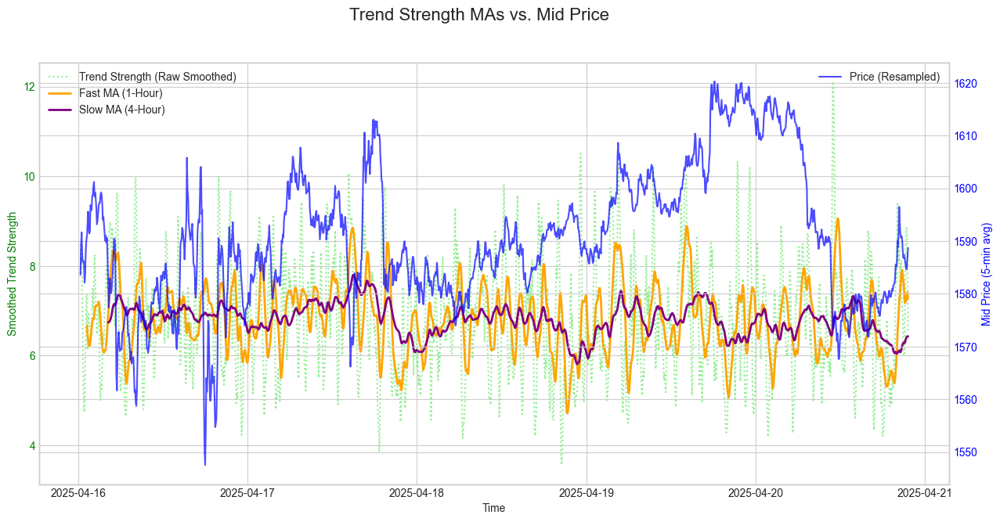

In [482]:
try:
    # --- 1. Use a longer smoothing period for a clearer signal ---
    # Using a 20-minute window (1200 seconds) instead of 20 seconds
    long_smoothing_period = 1200
    df_copy3['TrendStrength_Smoothed'] = df_copy3[F_trend].abs().sum(axis=1).rolling(window=long_smoothing_period).mean()

    # --- 2. Resample data to 5-minute intervals for plotting ---
    # This reduces noise and makes the chart much easier to read.
    df_plot = df_copy3[['mid_prc', 'TrendStrength_Smoothed']].resample('5T').mean().dropna()

    # --- 3. Develop Fast and Slow Moving Averages of the Trend Strength ---
    # The data is in 5-minute intervals, so 12 periods = 1 hour.
    fast_ma_period = 12 # 1-hour MA
    slow_ma_period = 48 # 4-hour MA
    df_plot['Fast_MA_Trend'] = df_plot['TrendStrength_Smoothed'].rolling(window=fast_ma_period).mean()
    df_plot['Slow_MA_Trend'] = df_plot['TrendStrength_Smoothed'].rolling(window=slow_ma_period).mean()

    # --- 4. Visualize the Smoothed and Resampled Data ---
    fig, ax1 = plt.subplots(figsize=(15, 7))

    # Plot Smoothed Trend Strength and its MAs on the primary y-axis
    ax1.set_xlabel('Time')
    ax1.set_ylabel('Smoothed Trend Strength', color='green')
    ax1.plot(df_plot.index, df_plot['TrendStrength_Smoothed'], color='lightgreen', label='Trend Strength (Raw Smoothed)', linewidth=1.5, linestyle=':')
    ax1.plot(df_plot.index, df_plot['Fast_MA_Trend'], color='orange', label='Fast MA (1-Hour)', linewidth=2)
    ax1.plot(df_plot.index, df_plot['Slow_MA_Trend'], color='purple', label='Slow MA (4-Hour)', linewidth=2)
    ax1.tick_params(axis='y', labelcolor='green')
    ax1.legend(loc='upper left')
    ax1.grid(True)

    # Create a secondary y-axis for the resampled price
    ax2 = ax1.twinx()  
    ax2.set_ylabel('Mid Price (5-min avg)', color='blue')
    ax2.plot(df_plot.index, df_plot['mid_prc'], color='blue', alpha=0.7, label='Price (Resampled)')
    ax2.tick_params(axis='y', labelcolor='blue')
    ax2.legend(loc='upper right')
    
    fig.suptitle('Trend Strength MAs vs. Mid Price', fontsize=16)
    plt.show()

except NameError:
    print("Could not generate plot. Please ensure 'df_copy3' and 'F_trend' are available from previous cells.")

/var/folders/sr/p42wz5n11rzcm2dvgg2x75l00000gn/T/ipykernel_64591/4106838799.py:9: FutureWarning: 'T' is deprecated and will be removed in a future version, please use 'min' instead.
  df_plot = df_copy3[['mid_prc', 'ChoppyStrength_Smoothed']].resample('5T').mean().dropna()


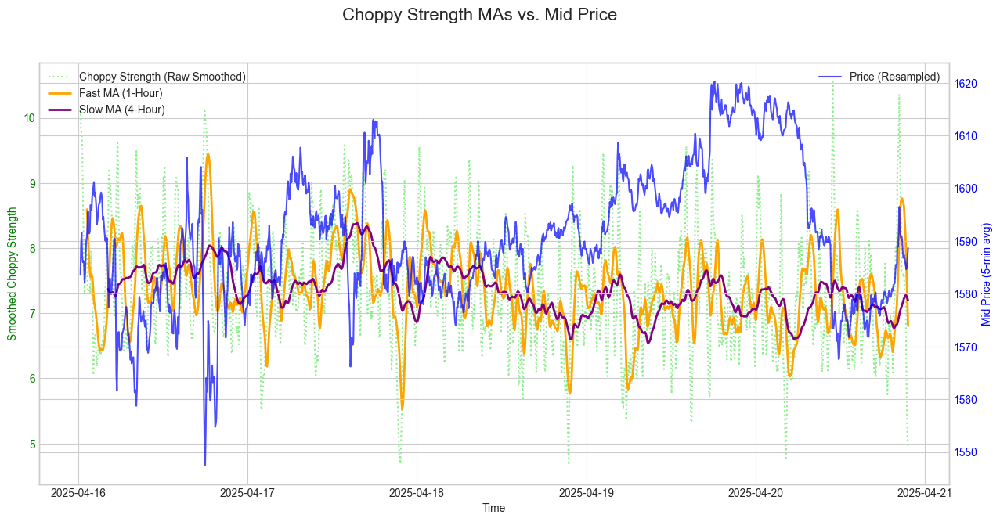

In [483]:
try:
    # --- 1. Use a longer smoothing period for a clearer signal ---
    # Using a 20-minute window (1200 seconds) instead of 20 seconds
    long_smoothing_period = 1200
    df_copy3['ChoppyStrength_Smoothed'] = df_copy3[F_choppy].abs().sum(axis=1).rolling(window=long_smoothing_period).mean()

    # --- 2. Resample data to 5-minute intervals for plotting ---
    # This reduces noise and makes the chart much easier to read.
    df_plot = df_copy3[['mid_prc', 'ChoppyStrength_Smoothed']].resample('5T').mean().dropna()
    # --- 3. Develop Fast and Slow Moving Averages of the Choppy Strength ---
    # The data is in 5-minute intervals, so 12 periods = 1 hour.
    fast_ma_period = 12 # 1-hour MA
    slow_ma_period = 48 # 4-hour MA
    df_plot['Fast_MA_Choppy'] = df_plot['ChoppyStrength_Smoothed'].rolling(window=fast_ma_period).mean()
    df_plot['Slow_MA_Choppy'] = df_plot['ChoppyStrength_Smoothed'].rolling(window=slow_ma_period).mean()

    # --- 4. Visualize the Smoothed and Resampled Data ---
    fig, ax1 = plt.subplots(figsize=(15, 7))

    # Plot Smoothed Choppy Strength and its MAs on the primary y-axis
    ax1.set_xlabel('Time')
    ax1.set_ylabel('Smoothed Choppy Strength', color='green')
    ax1.plot(df_plot.index, df_plot['ChoppyStrength_Smoothed'], color='lightgreen', label='Choppy Strength (Raw Smoothed)', linewidth=1.5, linestyle=':')
    ax1.plot(df_plot.index, df_plot['Fast_MA_Choppy'], color='orange', label='Fast MA (1-Hour)', linewidth=2)
    ax1.plot(df_plot.index, df_plot['Slow_MA_Choppy'], color='purple', label='Slow MA (4-Hour)', linewidth=2)
    ax1.tick_params(axis='y', labelcolor='green')
    ax1.legend(loc='upper left')
    ax1.grid(True)

    # Create a secondary y-axis for the resampled price
    ax2 = ax1.twinx()  
    ax2.set_ylabel('Mid Price (5-min avg)', color='blue')
    ax2.plot(df_plot.index, df_plot['mid_prc'], color='blue', alpha=0.7, label='Price (Resampled)')
    ax2.tick_params(axis='y', labelcolor='blue')
    ax2.legend(loc='upper right')

    fig.suptitle('Choppy Strength MAs vs. Mid Price', fontsize=16)
    plt.show()

except NameError:
    print("Could not generate plot. Please ensure 'df_copy3' and 'F_choppy' are available from previous cells.")

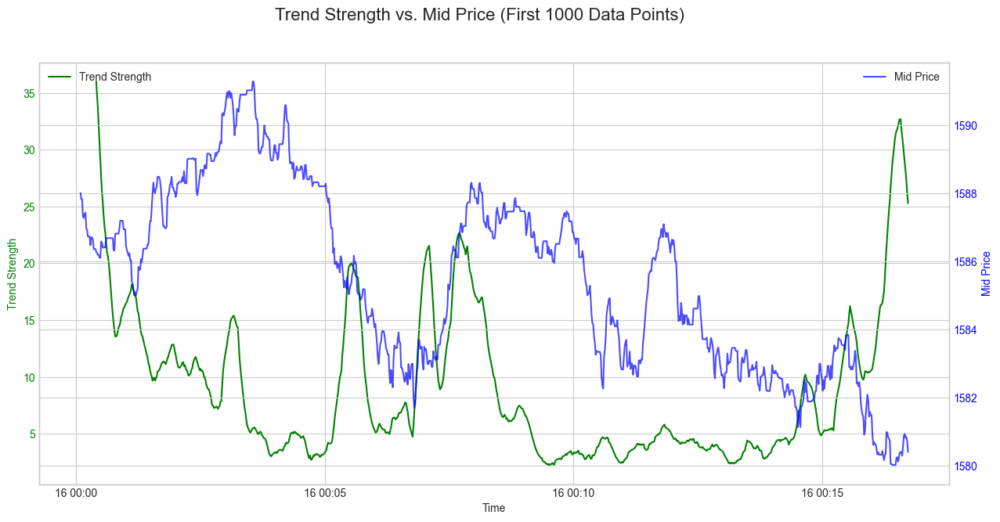

In [484]:
try:
    # --- 1. Select the first 5000 data points for plotting ---
    df_slice = df_copy3.iloc[:1000]

    # --- 2. Visualize the sliced data on a dual-axis chart ---
    fig, ax1 = plt.subplots(figsize=(15, 7))

    # Plot Trend Strength on the primary y-axis
    ax1.set_xlabel('Time')
    ax1.set_ylabel('Trend Strength', color='green')
    ax1.plot(df_slice.index, df_slice['TrendStrength'], color='green', label='Trend Strength', linewidth=1.5)
    ax1.tick_params(axis='y', labelcolor='green')
    ax1.legend(loc='upper left')
    ax1.grid(True)

    # Create a secondary y-axis for the mid price
    ax2 = ax1.twinx()  
    ax2.set_ylabel('Mid Price', color='blue')
    ax2.plot(df_slice.index, df_slice['mid_prc'], color='blue', alpha=0.7, label='Mid Price')
    ax2.tick_params(axis='y', labelcolor='blue')
    ax2.legend(loc='upper right')

    fig.suptitle('Trend Strength vs. Mid Price (First 1000 Data Points)', fontsize=16)
    plt.show()

except NameError:
    print("Could not generate plot. Please ensure 'df_copy3' with the 'TrendStrength' column is available.")
except Exception as e:
    print(f"An error occurred: {e}")

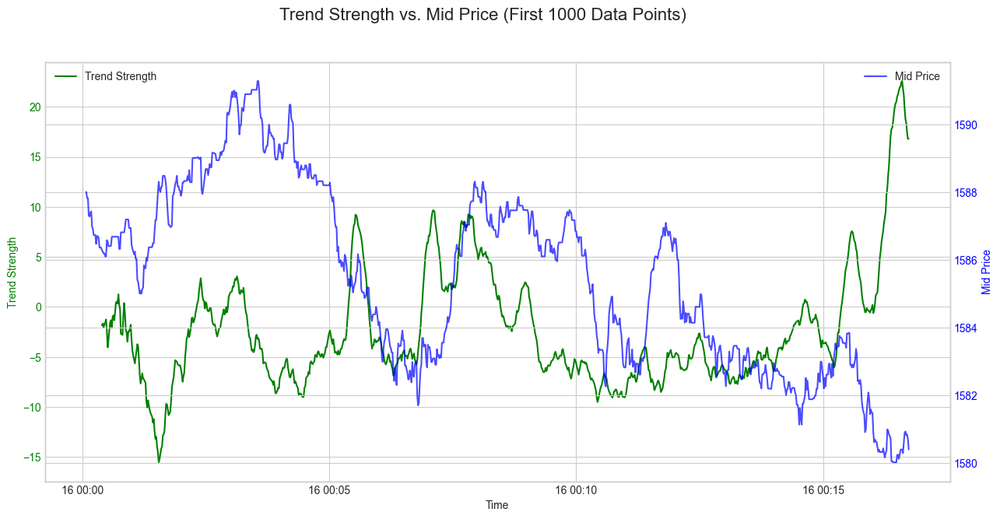

In [485]:
try:
    # --- 1. Select the first 5000 data points for plotting ---
    df_slice = df_copy3.iloc[:1000]

    # --- 2. Visualize the sliced data on a dual-axis chart ---
    fig, ax1 = plt.subplots(figsize=(15, 7))

    # Plot Trend Strength on the primary y-axis
    ax1.set_xlabel('Time')
    ax1.set_ylabel('Trend Strength', color='green')
    ax1.plot(df_slice.index, df_slice['TrendStrength']-df_slice['ChoppyStrength'], color='green', label='Trend Strength', linewidth=1.5)
    ax1.tick_params(axis='y', labelcolor='green')
    ax1.legend(loc='upper left')
    ax1.grid(True)

    # Create a secondary y-axis for the mid price
    ax2 = ax1.twinx()  
    ax2.set_ylabel('Mid Price', color='blue')
    ax2.plot(df_slice.index, df_slice['mid_prc'], color='blue', alpha=0.7, label='Mid Price')
    ax2.tick_params(axis='y', labelcolor='blue')
    ax2.legend(loc='upper right')

    fig.suptitle('Trend Strength vs. Mid Price (First 1000 Data Points)', fontsize=16)
    plt.show()

except NameError:
    print("Could not generate plot. Please ensure 'df_copy3' with the 'TrendStrength' column is available.")
except Exception as e:
    print(f"An error occurred: {e}")

In [486]:
    print("--- Selected Features for Trend Filter ---")
    print("\nTop 5 Trend-Following Features (F_trend):")
    for feature in F_trend:
        print(f"- {feature}")

    print("\nTop 5 Choppy-Market Features (F_choppy):")
    for feature in F_choppy:
        print(f"- {feature}")

--- Selected Features for Trend Filter ---

Top 5 Trend-Following Features (F_trend):
- ac29aa28b0
- 86eecbe036
- 01d830fc33
- 1aa3d78298
- c5001fe3b3
- df3261ae5e
- 7e149245ee
- b66accf4d4
- 2ebb6e47c7
- 81bb633696

Top 5 Choppy-Market Features (F_choppy):
- e093f74611
- 865224234b
- 84e6dad0a3
- 497584e7d1
- 134e1a6937
- 72e0d3737a
- ac567aa14a
- 5e95d4c57f
- 5d422876c4
- c2675078fe


Dropping highly correlated features: ['86eecbe036', '01d830fc33', 'c5001fe3b3', 'df3261ae5e', '7e149245ee', '81bb633696', '865224234b', '497584e7d1', '72e0d3737a', '5e95d4c57f']



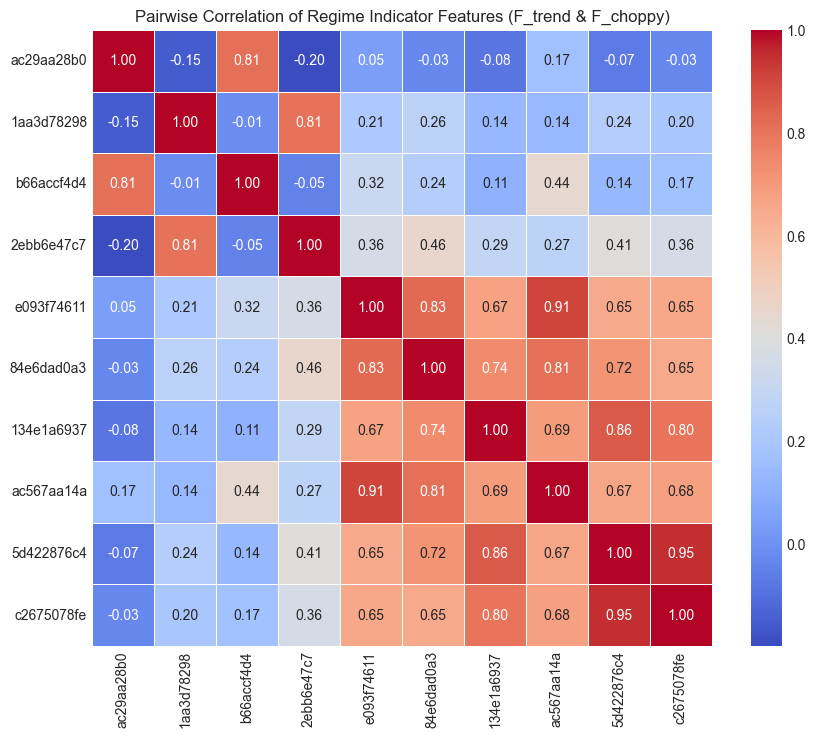

In [488]:
try:
    # --- 1. Prepare Data for Modeling ---
    
    # Automatically identify and remove highly correlated features
    all_regime_features = F_trend + F_choppy
    corr_matrix = df_copy3[all_regime_features].corr().abs()
    upper_tri = corr_matrix.where(np.triu(np.ones(corr_matrix.shape), k=1).astype(bool))
    
    # Find features with correlation greater than 0.95
    features_to_drop = [column for column in upper_tri.columns if any(upper_tri[column] > 0.95)]
    print(f"Dropping highly correlated features: {features_to_drop}\n")

    # Define the feature set, removing the highly correlated ones
    feature_cols = [f for f in all_regime_features if f not in features_to_drop]
    target_col = 'target_var'

    # --- 2. Calculate the pairwise correlation matrix ---
    regime_feature_corr = df_copy3[feature_cols].corr(method='spearman')

    # --- 3. Visualize the correlation matrix as a heatmap ---
    plt.figure(figsize=(10, 8))
    sns.heatmap(
        regime_feature_corr,
        annot=True,          # Display the correlation values on the heatmap
        cmap='coolwarm',     # Use a diverging colormap
        fmt=".2f",           # Format numbers to two decimal places
        linewidths=.5
    )
    plt.title('Pairwise Correlation of Regime Indicator Features (F_trend & F_choppy)')
    plt.show()

except NameError:
    print("Could not create correlation matrix. Please ensure 'F_trend' and 'F_choppy' lists are available.")
except Exception as e:
    print(f"An error occurred: {e}")

In [ ]:
try:
    # --- 1. Combine the feature lists ---
    all_regime_features = F_trend + F_choppy

    # --- 2. Calculate the pairwise correlation matrix ---
    regime_feature_corr = df_copy3[all_regime_features].corr(method='spearman')

    # --- 3. Visualize the correlation matrix as a heatmap ---
    plt.figure(figsize=(10, 8))
    sns.heatmap(
        regime_feature_corr,
        annot=True,          # Display the correlation values on the heatmap
        cmap='coolwarm',     # Use a diverging colormap
        fmt=".2f",           # Format numbers to two decimal places
        linewidths=.5
    )
    plt.title('Pairwise Correlation of Regime Indicator Features (F_trend & F_choppy)')
    plt.show()

except NameError:
    print("Could not create correlation matrix. Please ensure 'F_trend' and 'F_choppy' lists are available.")
except Exception as e:
    print(f"An error occurred: {e}")

/Users/stark/Desktop/Projects/AlphaResearch-the-anatomy-of-a-Signal/venv/lib/python3.13/site-packages/sklearn/linear_model/_logistic.py:1272: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.8. From then on, it will always use 'multinomial'. Leave it to its default value to avoid this warning.
  warnings.warn(


--- Logistic Regression Model Evaluation ---
Features Used: 10
Out-of-Sample Accuracy: 0.2848

--- Classification Report ---
              precision    recall  f1-score   support

 Bearish (0)       0.19      0.66      0.29     15076
  Choppy (1)       0.83      0.17      0.29     97366
 Bullish (2)       0.18      0.65      0.28     14477

    accuracy                           0.28    126919
   macro avg       0.40      0.49      0.28    126919
weighted avg       0.68      0.28      0.29    126919



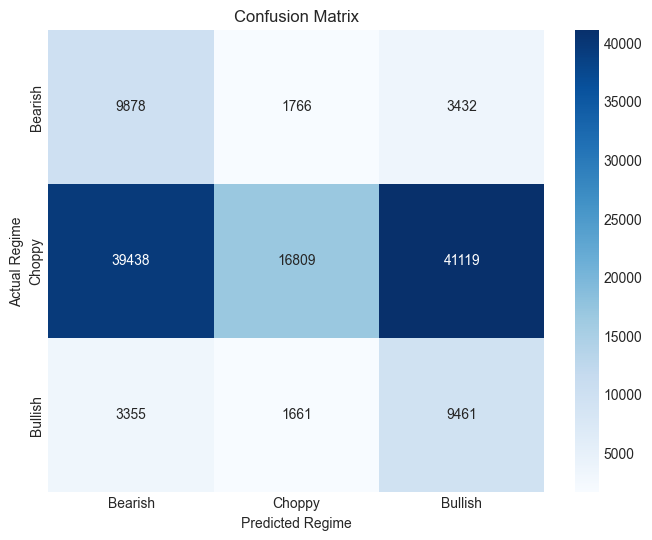

In [491]:
try:
    # --- 1. Prepare Data for Modeling ---
    
    # Define the feature set by combining the trend and choppy indicators
    # features_to_remove = ['1aa3d78298', 'ac29aa28b0', '', '5d422876c4', '5e95d4c57f']
    # feature_cols = [f for f in F_trend + F_choppy if f not in features_to_remove]
    # target_col = 'target_var'
    
    # Create a modeling DataFrame and drop rows with NaN values
    # NaNs can exist due to the rolling windows used to create the features
    df_model = df_copy3[feature_cols + [target_col]].dropna()
    
    X = df_model[feature_cols]
    y = df_model[target_col]

    if len(df_model) < 100:
        print("Not enough data to train the model after dropping NaNs.")
    else:
        # --- 2. Split Data Chronologically ---
        # We use shuffle=False because this is time-series data
        X_train, X_test, y_train, y_test = train_test_split(
            X, y, test_size=0.3, shuffle=False, random_state=42
        )

        # --- 3. Scale Features ---
        # Scaling is important for logistic regression performance
        scaler = StandardScaler()
        X_train_scaled = scaler.fit_transform(X_train)
        X_test_scaled = scaler.transform(X_test)

        # --- 4. Train the Logistic Regression Model ---
        # 'multinomial' is used for a target with more than two classes
        model = LogisticRegression(multi_class='multinomial', solver='lbfgs', 
                                   max_iter=1000, class_weight='balanced', C=0.1)
        model.fit(X_train_scaled, y_train)

        # --- 5. Evaluate the Model on the Test Set ---
        y_pred = model.predict(X_test_scaled)
        accuracy = accuracy_score(y_test, y_pred)
        
        print("--- Logistic Regression Model Evaluation ---")
        print(f"Features Used: {len(feature_cols)}")
        print(f"Out-of-Sample Accuracy: {accuracy:.4f}\n")

        # --- 6. Display Detailed Classification Report ---
        # Target names correspond to the values: 0=Bearish, 1=Choppy, 2=Bullish
        report = classification_report(y_test, y_pred, target_names=['Bearish (0)', 'Choppy (1)', 'Bullish (2)'])
        print("--- Classification Report ---")
        print(report)

        # --- 7. Visualize the Confusion Matrix ---
        cm = confusion_matrix(y_test, y_pred)
        plt.figure(figsize=(8, 6))
        sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', 
                    xticklabels=['Bearish', 'Choppy', 'Bullish'], 
                    yticklabels=['Bearish', 'Choppy', 'Bullish'])
        plt.title('Confusion Matrix')
        plt.ylabel('Actual Regime')
        plt.xlabel('Predicted Regime')
        plt.show()

except NameError:
    print("Could not train model. Ensure 'df_copy3', 'F_trend', and 'F_choppy' are available from previous cells.")
except Exception as e:
    print(f"An error occurred: {e}")

--- Training LightGBM Model ---
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001191 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2550
[LightGBM] [Info] Number of data points in the train set: 296144, number of used features: 10
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
Training until validation scores don't improve for 100 rounds
Did not meet early stopping. Best iteration is:
[9997]	valid_0's multi_logloss: 0.838266

--- LightGBM Model Evaluation ---
Features Used: 10
Out-of-Sample Accuracy: 0.6247

--- Classification Report ---
              precision    recall  f1-score   support

 Bearish (0)       0.25      0.35      0.29     15076
  Choppy (1)       0.82      0.71      0.76     97366
 Bullish (2)       0.23

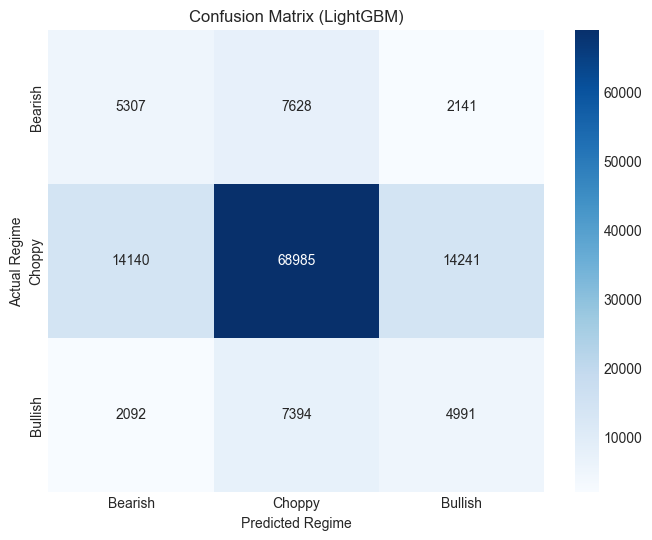

In [498]:
try:
    # --- 1. Prepare Data for Modeling ---
    
    # Define the feature set by combining the trend and choppy indicators
    # features_to_remove = ['1aa3d78298', 'ac29aa28b0', '', '5d422876c4', '5e95d4c57f']
    # feature_cols = [f for f in F_trend + F_choppy if f not in features_to_remove]
    # target_col = 'target_var'
    
    # Create a modeling DataFrame and drop rows with NaN values
    # NaNs can exist due to the rolling windows used to create the features
    df_model = df_copy3[feature_cols + [target_col]].dropna()
    
    X = df_model[feature_cols]
    y = df_model[target_col]

    if len(df_model) < 100:
        print("Not enough data to train the model after dropping NaNs.")
    else:
        # --- 2. Split Data Chronologically ---
        # We use shuffle=False because this is time-series data
        X_train, X_test, y_train, y_test = train_test_split(
            X, y, test_size=0.3, shuffle=False, random_state=42
        )

        # --- 3. Train a LightGBM Classifier ---
        # LightGBM is a powerful gradient boosting model that can capture non-linear relationships.
        # Scaling is not strictly necessary for tree-based models like LightGBM.

        lgbm = lgb.LGBMClassifier(objective='multiclass', 
                                  n_estimators=10000, 
                                  learning_rate=0.05,
                                  num_leaves=31,
                                  class_weight='balanced',
                                  n_jobs=-1,
                                  random_state=42)

        print("--- Training LightGBM Model ---")
        lgbm.fit(X_train, y_train,
                 eval_set=[(X_test, y_test)],
                 eval_metric='multi_logloss',
                 callbacks=[lgb.early_stopping(100, verbose=True)])

        # --- 4. Evaluate the Model on the Test Set ---
        y_pred = lgbm.predict(X_test)
        accuracy = accuracy_score(y_test, y_pred)
        
        print("\n--- LightGBM Model Evaluation ---")
        print(f"Features Used: {len(feature_cols)}")
        print(f"Out-of-Sample Accuracy: {accuracy:.4f}\n")

        # --- 5. Display Detailed Classification Report ---
        # Target names correspond to the values: 0=Bearish, 1=Choppy, 2=Bullish
        report = classification_report(y_test, y_pred, target_names=['Bearish (0)', 'Choppy (1)', 'Bullish (2)'])
        print("--- Classification Report ---")
        print(report)

        # --- 6. Visualize the Confusion Matrix ---
        cm = confusion_matrix(y_test, y_pred)
        plt.figure(figsize=(8, 6))
        sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', 
                    xticklabels=['Bearish', 'Choppy', 'Bullish'], 
                    yticklabels=['Bearish', 'Choppy', 'Bullish'])
        plt.title('Confusion Matrix (LightGBM)')
        plt.ylabel('Actual Regime')
        plt.xlabel('Predicted Regime')
        plt.show()

except NameError:
    print("Could not train model. Ensure 'df_copy3', 'feature_cols', and 'target_col' are available from previous cells.")
except Exception as e:
    print(f"An error occurred: {e}")

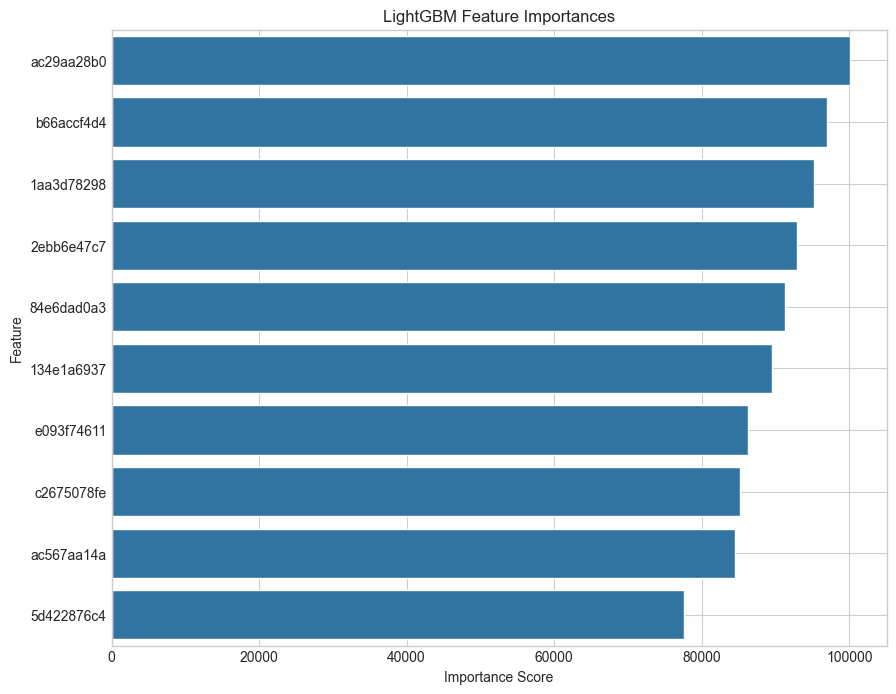


--- Top 10 Most Important Features ---
      feature  importance
0  ac29aa28b0      100052
2  b66accf4d4       97051
1  1aa3d78298       95213
3  2ebb6e47c7       92944
5  84e6dad0a3       91315
6  134e1a6937       89530
4  e093f74611       86268
9  c2675078fe       85182
7  ac567aa14a       84560
8  5d422876c4       77615


In [499]:
# --- 7. Plot Feature Importances ---
try:
    # Create a DataFrame of feature importances
    feature_importance_df = pd.DataFrame({
        'feature': X_train.columns,
        'importance': lgbm.feature_importances_
    }).sort_values('importance', ascending=False)

    # Plot the feature importances
    plt.figure(figsize=(10, 8))
    sns.barplot(x='importance', y='feature', data=feature_importance_df)
    plt.title('LightGBM Feature Importances')
    plt.xlabel('Importance Score')
    plt.ylabel('Feature')
    plt.grid(True)
    plt.show()
    
    print("\n--- Top 10 Most Important Features ---")
    print(feature_importance_df.head(10))

except NameError:
    print("\nCould not plot feature importances. 'lgbm' model not found.")
except Exception as e:
    print(f"\nAn error occurred while plotting feature importances: {e}")



--- Combined Model Evaluation (Logistic Regression + LightGBM) ---
Strategy: Predict Bullish/Bearish only if both models agree, otherwise predict Choppy.
Out-of-Sample Accuracy: 0.6526

--- Classification Report (Combined) ---
              precision    recall  f1-score   support

 Bearish (0)       0.26      0.31      0.29     15076
  Choppy (1)       0.81      0.76      0.78     97366
 Bullish (2)       0.25      0.31      0.28     14477

    accuracy                           0.65    126919
   macro avg       0.44      0.46      0.45    126919
weighted avg       0.68      0.65      0.66    126919



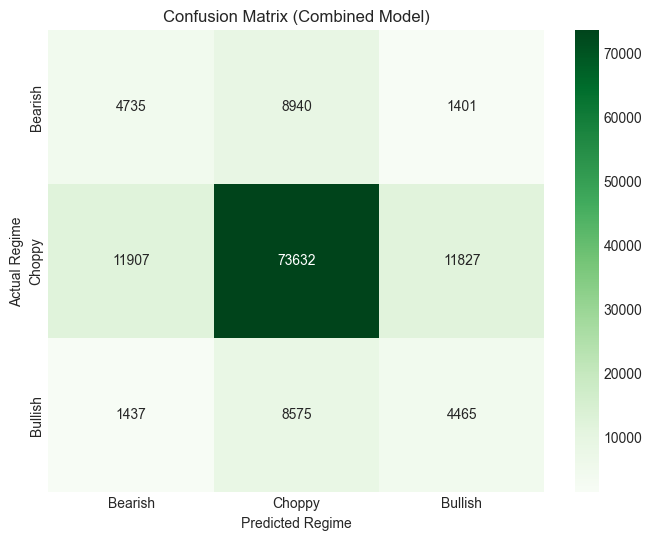

In [500]:
try:
    # --- 1. Generate Predictions from Both Models ---
    # (Assuming 'model' is the trained LogisticRegression and 'lgbm' is the LightGBM)
    y_pred_lr = model.predict(X_test_scaled)
    y_pred_lgbm = lgbm.predict(X_test)

    # --- 2. Implement the Ensemble Logic ---
    # Default to 'Choppy' (1)
    y_pred_combined = np.ones_like(y_test) 

    # Find where both models agree on 'Bullish' (2)
    bullish_agreement = (y_pred_lr == 2) & (y_pred_lgbm == 2)
    y_pred_combined[bullish_agreement] = 2

    # Find where both models agree on 'Bearish' (0)
    bearish_agreement = (y_pred_lr == 0) & (y_pred_lgbm == 0)
    y_pred_combined[bearish_agreement] = 0

    # --- 3. Evaluate the Combined Model ---
    accuracy_combined = accuracy_score(y_test, y_pred_combined)
    
    print("\n\n--- Combined Model Evaluation (Logistic Regression + LightGBM) ---")
    print("Strategy: Predict Bullish/Bearish only if both models agree, otherwise predict Choppy.")
    print(f"Out-of-Sample Accuracy: {accuracy_combined:.4f}\n")

    # --- 4. Display Detailed Classification Report ---
    report_combined = classification_report(y_test, y_pred_combined, target_names=['Bearish (0)', 'Choppy (1)', 'Bullish (2)'])
    print("--- Classification Report (Combined) ---")
    print(report_combined)

    # --- 5. Visualize the Confusion Matrix ---
    cm_combined = confusion_matrix(y_test, y_pred_combined)
    plt.figure(figsize=(8, 6))
    sns.heatmap(cm_combined, annot=True, fmt='d', cmap='Greens', 
                xticklabels=['Bearish', 'Choppy', 'Bullish'], 
                yticklabels=['Bearish', 'Choppy', 'Bullish'])
    plt.title('Confusion Matrix (Combined Model)')
    plt.ylabel('Actual Regime')
    plt.xlabel('Predicted Regime')
    plt.show()

except NameError as e:
    print(f"\nCould not run combined model evaluation. A required model or variable is missing: {e}")
except Exception as e:
    print(f"\nAn error occurred during combined model evaluation: {e}")

In [501]:
print(df_test.columns)

Index(['mid_prc', 'b66accf4d4', '01d830fc33', 'ac29aa28b0', '86eecbe036',
       '9c51f3cf1d', '706dbe6d28', 'cb232e1c9f', '301f8d1b44', '134e1a6937',
       '5f3f783a1f', 'd182b35ca9', 'c910253362', '8572904679', '486b27acac',
       'e10ab80234', '5e7e5a691e', 'ec021e3c39', 'c12d090869', 'ac567aa14a',
       '5e95d4c57f', '84e6dad0a3', '72e0d3737a', '865224234b', '497584e7d1',
       'fe12c6cc6c', '7d08e345ba', 'e486088bae', 'e093f74611', '7a0f3d15e0',
       '7373db20a8', 'd50ec44f62', '98727525fc', '4a9f632715', 'f46c65222f',
       'ac8a9f9f8f', 'd4112c20e5', 'd5b6b02144', 'da2cdd99f0', 'f2541b5abc',
       'f98542952a', 'ffbe745f16', '3e21085969', 'a4e012f275', '5b49e63bed',
       'be3e28c4c3', 'd204751de5', 'fa27718d2f', '066b586798', '299afc361e',
       'f9729a88bb', '470d88c5b1', 'd2edb86598', '71cf837e9a', '203633358c',
       'd0cfd8e5d0', 'e2ab68e2c7', '81bb633696', '2ebb6e47c7', '1b6ac90abc',
       'dee93af023', '7e149245ee', 'df3261ae5e', 'a94fc5357b', '21a69fbc66',
  

In [502]:
try:
    # --- 1. Calculate Returns ---
    # Calculate the percentage change in the mid-price to get returns
    df_test['returns'] = df_test['mid_prc'].pct_change()

    # --- 2. Calculate Shifted Returns ---
    # Shift the returns column by -1 to get the next second's return
    df_test['price_returns_1'] = df_test['returns'].shift(-1)

    # --- 3. Set Regime Based on Thresholds ---
    # Define the thresholds for bullish and bearish signals
    bullish_threshold = 0.00001
    bearish_threshold = -0.00001

    # Define the conditions for each regime
    conditions = [
        df_test['price_returns_1'] > bullish_threshold,
        df_test['price_returns_1'] < bearish_threshold
    ]
    # Define the choices corresponding to the conditions
    choices = [2, 0]

    # Create the 'regime' column using np.select
    df_test['regime'] = np.select(conditions, choices, default=1)

    # --- Verification ---
    # Display the head of the new columns to verify the logic
    print("--- Sample of new columns in df_test ---")
    print(df_test[['mid_prc', 'returns', 'price_returns_1', 'regime']].dropna().head(10))

    # Display the total counts for each regime type
    print("\n--- Total counts for each regime in df_test ---")
    print(df_test['regime'].value_counts())

except Exception as e:
    print(f"An error occurred: {e}")

--- Sample of new columns in df_test ---
                         mid_prc   returns  price_returns_1  regime
timestamp                                                          
2025-04-20 21:37:13  1589.619995 -0.000142        -0.000142       0
2025-04-20 21:37:14  1589.395020 -0.000142        -0.000069       0
2025-04-20 21:37:15  1589.285034 -0.000069        -0.000211       0
2025-04-20 21:37:16  1588.949951 -0.000211        -0.000003       1
2025-04-20 21:37:17  1588.944946 -0.000003        -0.000041       0
2025-04-20 21:37:18  1588.880005 -0.000041        -0.000028       0
2025-04-20 21:37:19  1588.834961 -0.000028         0.000000       1
2025-04-20 21:37:20  1588.834961  0.000000         0.000000       1
2025-04-20 21:37:21  1588.834961  0.000000         0.000069       2
2025-04-20 21:37:22  1588.944946  0.000069         0.000000       1

--- Total counts for each regime in df_test ---
regime
1    93387
0    44061
2    43866
Name: count, dtype: int64




--- Final Ensemble Model Evaluation on Test Data (df_test) ---
Out-of-Sample Accuracy: 0.4840

--- Classification Report (Ensemble on Test Data) ---
              precision    recall  f1-score   support

 Bearish (0)       0.36      0.32      0.34     44061
  Choppy (1)       0.58      0.64      0.61     93387
 Bullish (2)       0.36      0.32      0.34     43866

    accuracy                           0.48    181314
   macro avg       0.43      0.43      0.43    181314
weighted avg       0.47      0.48      0.48    181314



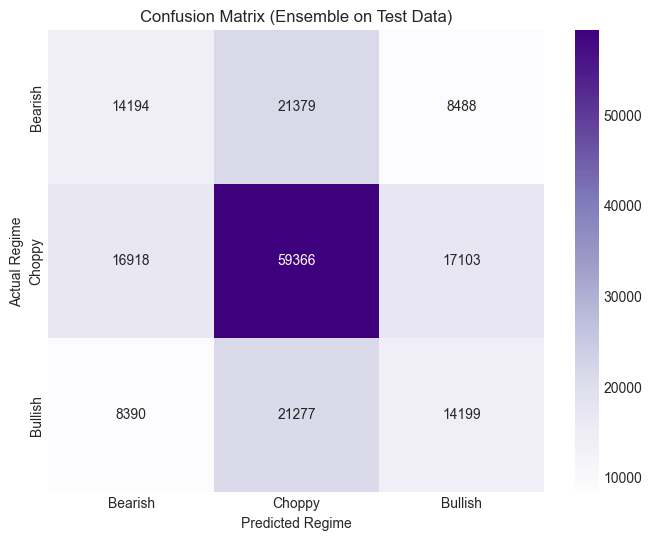

In [503]:
try:
    # --- 1. Prepare the Test Data ---
    # The 'regime' column in df_test is our ground truth (y_test)
    # We need to handle potential NaN values that might exist in the feature or target columns
    df_eval = df_test[feature_cols + ['regime']].dropna()
    
    X_eval = df_eval[feature_cols]
    y_eval = df_eval['regime']

    if X_eval.empty:
        print("Evaluation stopped: No data left after removing NaN values.")
    else:
        # --- 2. Generate Predictions from Both Models ---
        
        # a) LightGBM predictions (uses raw feature values)
        y_pred_lgbm = lgbm.predict(X_eval)

        # b) Logistic Regression predictions (uses scaled feature values)
        X_eval_scaled = scaler.transform(X_eval)
        y_pred_lr = model.predict(X_eval_scaled)

        # --- 3. Implement the Ensemble Logic ---
        # Default to 'Choppy' (1)
        y_pred_combined = np.ones_like(y_eval) 

        # Find where both models agree on 'Bullish' (2)
        bullish_agreement = (y_pred_lr == 2) & (y_pred_lgbm == 2)
        y_pred_combined[bullish_agreement] = 2

        # Find where both models agree on 'Bearish' (0)
        bearish_agreement = (y_pred_lr == 0) & (y_pred_lgbm == 0)
        y_pred_combined[bearish_agreement] = 0

        # --- 4. Evaluate the Combined Model's Performance on df_test ---
        accuracy_combined = accuracy_score(y_eval, y_pred_combined)
        
        print("\n\n--- Final Ensemble Model Evaluation on Test Data (df_test) ---")
        print(f"Out-of-Sample Accuracy: {accuracy_combined:.4f}\n")

        # --- 5. Display Detailed Classification Report ---
        report_combined = classification_report(y_eval, y_pred_combined, target_names=['Bearish (0)', 'Choppy (1)', 'Bullish (2)'])
        print("--- Classification Report (Ensemble on Test Data) ---")
        print(report_combined)

        # --- 6. Visualize the Confusion Matrix ---
        cm_combined = confusion_matrix(y_eval, y_pred_combined)
        plt.figure(figsize=(8, 6))
        sns.heatmap(cm_combined, annot=True, fmt='d', cmap='Purples', 
                    xticklabels=['Bearish', 'Choppy', 'Bullish'], 
                    yticklabels=['Bearish', 'Choppy', 'Bullish'])
        plt.title('Confusion Matrix (Ensemble on Test Data)')
        plt.ylabel('Actual Regime')
        plt.xlabel('Predicted Regime')
        plt.show()

except NameError as e:
    print(f"\nCould not run evaluation. A required model or variable is missing: {e}")
    print("Please ensure the cells that train 'lgbm', 'model', 'scaler', and define 'feature_cols' have been run.")
except Exception as e:
    print(f"\nAn error occurred during the evaluation: {e}")

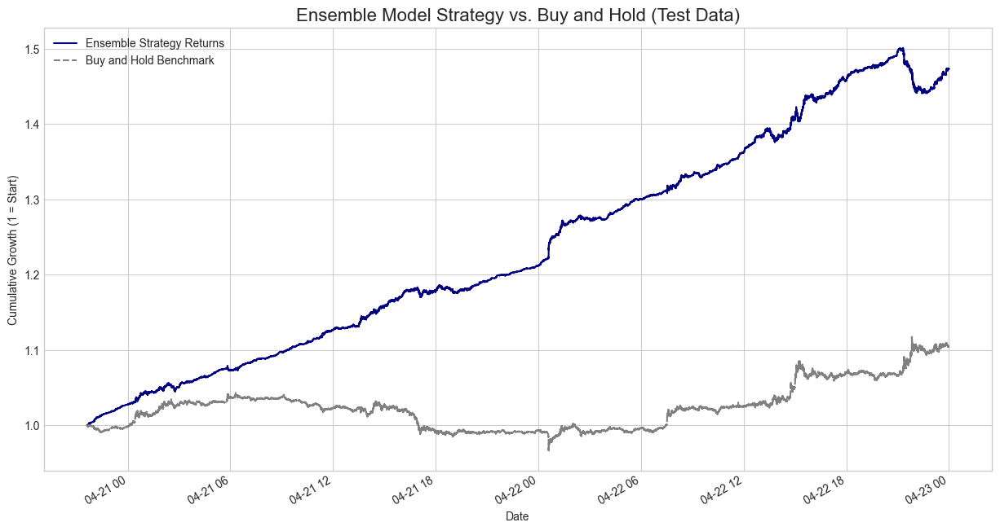


--- Backtest Performance Summary ---
Total Net Strategy Return: 47.38%
Total Buy and Hold Return: 10.44%
Annualized Sharpe Ratio: 127.26
Total Number of Trades: 95085.0


In [511]:
try:
    # --- 1. Prepare a DataFrame for Backtesting ---
    # Use the df_eval which has aligned features and actual regimes (y_eval)
    # Add the combined predictions to this DataFrame
    df_backtest = df_eval.copy()
    df_backtest['predicted_regime'] = y_pred_combined

    # --- 2. Define Transaction Costs and Create Trading Signals ---
    TRANSACTION_COST_PCT = 0.0000 # 0.00% per trade

    # Map model predictions to trading signals: Bullish(2)->1, Choppy(1)->0, Bearish(0)->-1
    signal_map = {2: 1, 1: 0, 0: -1}
    df_backtest['signal'] = df_backtest['predicted_regime'].map(signal_map)

    # --- 3. Calculate Strategy Returns and Costs ---
    # The return is the signal from the previous period multiplied by the actual return of the current period.
    # We use 'price_returns_1' from the original df_test, aligned to our backtest frame.
    df_backtest['strategy_returns'] = df_backtest['signal'].shift(1) * df_test.loc[df_backtest.index, 'price_returns_1']

    # A trade occurs when the signal changes.
    df_backtest['trades'] = df_backtest['signal'].diff().abs()
    df_backtest['costs'] = df_backtest['trades'] * TRANSACTION_COST_PCT

    # Calculate net returns by subtracting costs.
    df_backtest['net_returns'] = df_backtest['strategy_returns'] - df_backtest['costs']
    df_backtest.dropna(inplace=True)

    # --- 4. Calculate Cumulative Returns (Equity Curve) ---
    # Strategy Equity Curve
    df_backtest['cumulative_strategy_returns'] = (1 + df_backtest['net_returns']).cumprod()
    
    # Benchmark "Buy and Hold" Equity Curve
    df_backtest['cumulative_buy_hold'] = (1 + df_test.loc[df_backtest.index, 'price_returns_1']).cumprod()

    # --- 5. Plot the Results ---
    plt.figure(figsize=(15, 8))
    df_backtest['cumulative_strategy_returns'].plot(label='Ensemble Strategy Returns', color='navy')
    df_backtest['cumulative_buy_hold'].plot(label='Buy and Hold Benchmark', color='gray', linestyle='--')
    
    plt.title('Ensemble Model Strategy vs. Buy and Hold (Test Data)', fontsize=16)
    plt.xlabel('Date')
    plt.ylabel('Cumulative Growth (1 = Start)')
    plt.legend()
    plt.grid(True)
    plt.show()

    # --- 6. Calculate and Print Final Performance Metrics ---
    # a) Total Return
    total_strategy_return = (df_backtest['cumulative_strategy_returns'].iloc[-1] - 1) * 100
    total_benchmark_return = (df_backtest['cumulative_buy_hold'].iloc[-1] - 1) * 100
    
    # b) Number of Trades
    num_trades = df_backtest['trades'].sum()

    # c) Annualized Sharpe Ratio
    # The data is per second, so we annualize from seconds.
    SECONDS_IN_A_YEAR = 365 * 24 * 60 * 60
    annualization_factor = np.sqrt(SECONDS_IN_A_YEAR)
    mean_net_return = df_backtest['net_returns'].mean()
    std_dev_net = df_backtest['net_returns'].std()
    
    # Avoid division by zero if there are no returns or volatility
    sharpe_ratio = (mean_net_return / std_dev_net) * annualization_factor if std_dev_net > 0 else 0

    print("\n--- Backtest Performance Summary ---")
    print(f"Total Net Strategy Return: {total_strategy_return:.2f}%")
    print(f"Total Buy and Hold Return: {total_benchmark_return:.2f}%")
    print(f"Annualized Sharpe Ratio: {sharpe_ratio:.2f}")
    print(f"Total Number of Trades: {num_trades}")

except NameError as e:
    print(f"\nCould not run backtest. A required variable is missing: {e}")
    print("Please ensure the previous evaluation cell has been run successfully.")
except Exception as e:
    print(f"\nAn error occurred during the backtest: {e}")